In [1]:
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
# from tensorflow.keras.mixed_precision import experimental as mixed_precision
from scipy.stats import sem

parentDir = os.path.dirname(os.path.abspath(os.getcwd()))
sys.path.append(os.path.join(os.getcwd(), "general_utils"))
# import file_management
from v1_model_utils import models, load_sparse, other_v1_utils
sys.path.append(os.path.join(os.getcwd(), "v1_model_utils"))
import analysis_utils as utils
from math import pi
from scipy import stats

import h5py
import pickle as pkl
from scipy.ndimage import gaussian_filter
from numba import njit

%load_ext line_profiler

# Set style parameters for publication quality
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 12,
    'axes.linewidth': 1.2,
    'axes.labelpad': 8,
    'xtick.major.width': 1.2,
    'ytick.major.width': 1.2,
    'xtick.major.size': 5,
    'ytick.major.size': 5,
    'legend.frameon': True,
    'legend.fontsize': 11,
    'axes.labelsize': 12,
    'axes.titlesize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.transparent': True
})

sns.set(style="ticks")
plt.rcParams['text.usetex'] = True

/tmp/ipykernel_4011034/119553692.py:4: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd
2025-07-29 18:08:43.427609: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


## CSV FILES LOADING AND LGN DATA FOR OSI/DSI ANALYSIS

In [2]:
# cache_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/GLIF_network/tf_data/V1_network_v1_65871.pkl'
cache_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/GLIF_network_nll/tf_data/V1_network_v1_65871_random_weights_True.pkl'
with open(cache_path, 'rb') as f:
    network, lgn_input, bkg_input = pkl.load(f)

# Extract main variables from the network
voltage_scale = (network['node_params']['V_th'] - network['node_params']['E_L']).astype(np.float32)
variable_key = f'sparse_recurrent_weights:0'
indices = network["synapses"]["indices"].astype(np.int32)
node_type_ids = network['node_type_ids']

# Load the V1 data csv
v1_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/Simulation_results/v1_65871_random_weights_True/b_test/v1_features_df.csv'
# v1_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/Simulation_results/v1_65871_random_weights_True/b_py7q/Best_model/ckpt-50_results/v1_features_df.csv'
# v1_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/Simulation_results/v1_65871/b_9135/Best_model/ckpt-98_results/v1_features_df.csv'
v1_core_df = pd.read_csv(v1_path, sep=' ')

# Load the checkpoint
# ckpt_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/Simulation_results/v1_65871/b_9135/Best_model'
# ckpt_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/Simulation_results/v1_65871/b_5abx/Best_model'
ckpt_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/Simulation_results/v1_65871_random_weights_True/b_py7q/Best_model'
checkpoint_directory = tf.train.latest_checkpoint(ckpt_path)
print(f'Restoring checkpoint from {checkpoint_directory}...')

from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')
dtype = tf.float16

# Build the model
model = models.create_model(
            network,
            lgn_input,
            bkg_input,
            seq_len=500,
            n_input=17400,
            n_output=2,
            cue_duration=40,
            dtype=dtype,
            input_weight_scale=1.,
            dampening_factor=.5,
            recurrent_dampening_factor=0.5,
            gauss_std=.3,
            lr_scale=1.,
            train_input=False,
            train_noise=True,
            train_recurrent=True,
            train_recurrent_per_type=False,
            neuron_output=False,
            batch_size=1,
            pseudo_gauss=False,
            use_state_input=True,
            return_state=True,
            hard_reset=False,
            add_metric=True,
            max_delay=5,
        )

model.build((1, 1000, 17400))

# Store the initial model variables that are going to be trained
model_variables_dict = {'Initial': {var.name: var.numpy().astype(np.float32) for var in model.trainable_variables}}
checkpoint = tf.train.Checkpoint(model=model)
checkpoint.restore(checkpoint_directory).expect_partial()#.assert_consumed()
model_variables_dict['Restored'] = {var.name: var.numpy().astype(np.float32) for var in model.trainable_variables}

Restoring checkpoint from /home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/Simulation_results/v1_65871_random_weights_True/b_py7q/Best_model/ckpt-50...
The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


2025-07-29 18:08:47.959871: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


Creating the V1 column...
    > # Recurrent synapses: 23525415
    > # LGN input synapses 30852826
    > # BKG input synapses 263484


In [3]:
for key in model_variables_dict['Restored'].keys():
    values = model_variables_dict['Restored'][key]
    min_value = np.min(values)
    max_value = np.max(values)
    print(f"{key}: min={min_value:.4f}, max={max_value:.4f}")
    initial_values = model_variables_dict['Initial'][key]
    min_initial_value = np.min(initial_values)
    max_initial_value = np.max(initial_values)
    print(f"Initial {key}: min={min_initial_value:.4f}, max={max_initial_value:.4f}\n")

sparse_recurrent_weights:0: min=-2753.8721, max=4825.1313
Initial sparse_recurrent_weights:0: min=-19.2065, max=36.9075

rest_of_brain_weights:0: min=0.0044, max=2.9872
Initial rest_of_brain_weights:0: min=0.0404, max=2.0522



In [323]:
v1_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/Simulation_results/v1_65871_random_weights_True/b_test/v1_features_df.csv'
# v1_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/Simulation_results/v1_65871_random_weights_True/b_py7q/Best_model/ckpt-50_results/v1_features_df.csv'
# v1_path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/Simulation_results/v1_65871/b_9135/Best_model/ckpt-98_results/v1_features_df.csv'
v1_core_df = pd.read_csv(v1_path, sep=' ')
v1_core_df

,node_id,pop_name,max_mean_rate(Hz),preferred_angle,p_value_OSI,OSI,DSI,Ave_Rate(Hz),firing_rate_sp
0,0,i1Htr3a,6.600000,NaN,0.242688,0.023382,0.004155,6.20000,6.67500
1,1,i1Htr3a,7.550000,NaN,0.961708,0.021192,0.013992,7.20000,12.23125
2,2,i1Htr3a,1.350000,NaN,0.890569,0.103659,0.130648,0.94375,0.58750
3,3,i1Htr3a,2.450000,NaN,0.884833,0.018158,0.018608,2.09375,11.71250
4,4,i1Htr3a,5.810298,15.413118,0.019659,0.304594,0.230026,2.03750,0.69375
...,...,...,...,...,...,...,...,...,...
16361,16361,i6Sst,0.400000,NaN,0.225085,0.253010,0.185119,0.21250,5.01250
16362,16362,i6Sst,0.450000,NaN,0.337292,0.299942,0.179662,0.21250,7.78125
16363,16363,i6Sst,2.100000,NaN,0.885622,0.054013,0.054929,1.76250,9.10000
16364,16364,i6Sst,0.350000,NaN,0.106821,0.294508,0.173708,0.17500,3.26875


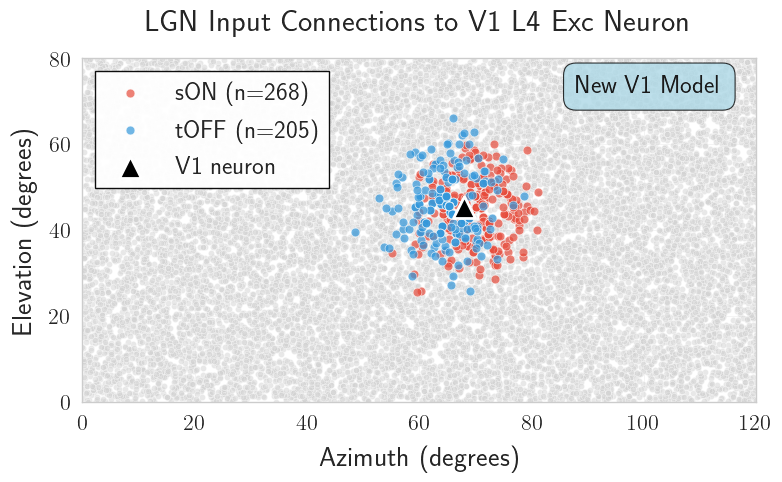

In [324]:
# Set seaborn style for publication-ready plots
sns.set_style("whitegrid", {"grid.linewidth": 0.5, "grid.alpha": 0.5})
sns.set_context("paper", font_scale=1.3, rc={"lines.linewidth": 2})

# Set up the figure with better proportions
fig, ax = plt.subplots(figsize=(8, 5))

# Define a publication-quality color palette
category_colors = {
    'sON': '#E74C3C',      # Professional red
    'sOFF': '#27AE60',     # Professional green
    'tOFF': '#3498DB',     # Professional blue
    'ON/OFF': '#F39C12',    # Professional orange
    'Other': '#95A5A6'      # Professional gray
}

path = '/home/jgalvan/Desktop/Neurocoding/V1_GLIF_model/GLIF_network_nll/tf_data/lgn_full_col_cells_120x80.csv'
lgn_data = pd.read_csv(path, sep=' ')

# Get data for the selected V1 neuron
v1_neuron_id = 5309
v1_pop_name = v1_core_df['pop_name'].values[v1_neuron_id]
v1_cell_type = other_v1_utils.pop_name_to_cell_type(v1_pop_name)

# Get LGN connections
mask = lgn_input['indices'][:, 0] == v1_neuron_id
lgn_ids = lgn_input['indices'][:, 1][mask]
lgn_x = lgn_data['x'][lgn_ids].values
lgn_y = lgn_data['y'][lgn_ids].values
lgn_model_id = lgn_data['model_id'][lgn_ids].values

# Categorize LGN model IDs into 4 main categories
def categorize_lgn_model(model_id):
    """Categorize LGN model IDs into 4 main types."""
    model_str = str(model_id).lower()
    
    if model_str.startswith('son'):
        return 'sON'
    elif model_str.startswith('soff'):
        return 'sOFF'
    elif model_str.startswith('toff'):
        return 'tOFF'
    elif 'on' in model_str and 'off' in model_str:  # sONsOFF, sONtOFF, etc.
        return 'ON/OFF'
    else:
        return 'Other'

# Apply categorization
lgn_categories = np.array([categorize_lgn_model(mid) for mid in lgn_model_id])

# Plot LGN neurons by category with improved styling
unique_categories = np.unique(lgn_categories)
ordered_categories = ['sON', 'sOFF', 'tOFF', 'ON/OFF', 'Other']
ordered_categories = [cat for cat in ordered_categories if cat in unique_categories]

for category in ordered_categories:
    mask = lgn_categories == category
    count = np.sum(mask)
    ax.scatter(lgn_x[mask], lgn_y[mask], 
               c=category_colors[category], 
               s=40, alpha=0.7, 
               label=f'{category} (n={count})',
               edgecolors='white', linewidth=0.5,
               zorder=5)

# scatter all lgn neurons with a light gray color
ax.scatter(lgn_data['x'].values, lgn_data['y'].values, c='lightgray', s=20, alpha=0.5,
           edgecolors='white', linewidth=0.5, zorder=1)

# Plot V1 neuron position with emphasis
v1_x = network['x'][v1_neuron_id] * 70/1000 + 60
v1_y = network['z'][v1_neuron_id] * 40/1000 + 40
ax.scatter(v1_x, v1_y, c='black', s=250, marker='^', 
           label=f'V1 neuron', 
           edgecolors='white', linewidth=2, zorder=10)

# Improved axis formatting
ax.set_xlim(0, 120)
ax.set_ylim(0, 80)
ax.set_xlabel('Azimuth (degrees)', fontsize=20, fontweight='bold')
ax.set_ylabel('Elevation (degrees)', fontsize=20, fontweight='bold')
ax.set_title(f'LGN Input Connections to V1 {v1_cell_type} Neuron', 
             fontsize=22, fontweight='bold', pad=20)

# Enhanced legend
legend = ax.legend(loc='upper left', frameon=True, fancybox=False, 
                   shadow=False, framealpha=0.95, fontsize=18,
                   )
legend.get_frame().set_facecolor('white')
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(1)

# Add "New V1 model" text box on the right
text_box = dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8, edgecolor='black')
ax.text(0.95, 0.95, 'New V1 Model', transform=ax.transAxes, fontsize=18, color='k',
        verticalalignment='top', horizontalalignment='right', bbox=text_box, 
        fontweight='bold')

# Adjust grid
ax.grid(True, alpha=0.3, linewidth=0.5)
ax.set_axisbelow(True)

# Adjust tick parameters
ax.tick_params(axis='both', which='major', labelsize=16, width=1, length=5)
ax.tick_params(axis='both', which='minor', width=0.5, length=3)

plt.tight_layout()
plt.show()

# Optional: Save the figure as high-resolution PDF for publication
# plt.savefig('lgn_connections_v1_neuron.png', dpi=300, bbox_inches='tight', 
#             facecolor='white', edgecolor='none')

In [325]:
v1_pop_names = other_v1_utils.pop_names(network)
v1_cell_types = [other_v1_utils.pop_name_to_cell_type(pop_name) for pop_name in v1_pop_names]
v1_ei = [n[0] for n in v1_pop_names]
v1_core_mask = other_v1_utils.isolate_core_neurons(network, n_selected_neurons=16366, data_dir='GLIF_network_nll')
v1_core_indices = np.where(v1_core_mask)[0]
v1_core_df['tf_id'] = v1_core_indices

all_v1_neurons_df = pd.DataFrame({
    'tf_id': np.arange(len(v1_pop_names)),
    'pop_name': v1_pop_names,
    'cell_type': v1_cell_types,
    'ei': v1_ei,
    'tuning_angle': network['tuning_angle'],
    'x': network['x'],
    'y': network['y'],
    'z': network['z'],
    'azimuth': network['x'] * 70/1000 + 60,
    'elevation': network['z'] * 40/1000 + 40
})

v1_df = pd.merge(all_v1_neurons_df, v1_core_df, on=['tf_id', 'pop_name'], how='outer')
v1_df['area'] = 'v1'
v1_df['region'] = np.where(v1_df['tf_id'].isin(v1_core_indices), 'core', 'annulus')

# can we set two indices: first the area and then the tf_id
v1_df.set_index(['area', 'tf_id'], inplace=True)

# print the percentage of core neurons with preferred_angle
core_neurons = v1_df['region'] == 'core'
total_core_neurons = core_neurons.sum()
core_with_angle = v1_df[core_neurons]['preferred_angle'].notna().sum()
percentage_with_angle = (core_with_angle / total_core_neurons) * 100 if total_core_neurons > 0 else 0
print(f"Percentage of core neurons with preferred_angle: {percentage_with_angle:.2f}%")


Percentage of core neurons with preferred_angle: 77.94%


In [326]:
v1_df

pop_name cell_type ei  tuning_angle           x           y  \
area tf_id                                                               
v1   0      i1Htr3a  L1 Htr3a  i      0.000000  215.722260 -127.750664   
     1      i1Htr3a  L1 Htr3a  i      1.809045 -317.582611 -116.269836   
     2      i1Htr3a  L1 Htr3a  i      3.618090 -193.192459 -124.866631   
     3      i1Htr3a  L1 Htr3a  i      5.427135  249.000183 -147.456009   
     4      i1Htr3a  L1 Htr3a  i      7.236181 -353.444244 -145.307861   
...             ...       ... ..           ...         ...         ...   
     65866    i6Sst    L6 SST  i    339.069763  210.587067 -797.246338   
     65867    i6Sst    L6 SST  i    343.255829 -174.842270 -822.858521   
     65868    i6Sst    L6 SST  i    347.441864  366.073029 -698.065308   
     65869    i6Sst    L6 SST  i    351.627899 -170.762405 -686.952271   
     65870    i6Sst    L6 SST  i    355.813965  145.252625 -715.489075   

                     z    azimuth  elevation  node_id  max_mean_rate(Hz)  \
area tf_id                                                                 
v1   0      288.067749  75.100555  51.522709      NaN                NaN   
     1      -58.897064  37.769218  37.644119      NaN                NaN   
     2        7.688277  46.476528  40.307529      0.0               6.60   
     3       90.409622  77.430016  43.616386      NaN                NaN   
     4        8.257144  35.258904  40.330284      NaN                NaN   
...                ...        ...        ...      ...                ...   
     65866 -184.810562  74.741096  32.607578      NaN                NaN   
     65867   59.488029  47.761040  42.379520  16363.0               2.10   
     65868 -119.328606  85.625107  35.226856      NaN                NaN   
     65869   47.039146  48.046631  41.881565  16364.0               0.35   
     65870  -77.184113  70.167686  36.912636  16365.0               0.15   

            preferred_angle  p_value_OSI       OSI       DSI  Ave_Rate(Hz)  \
area tf_id                                                                   
v1   0                  NaN          NaN       NaN       NaN           NaN   
     1                  NaN          NaN       NaN       NaN           NaN   
     2                  NaN     0.242688  0.023382  0.004155       6.20000   
     3                  NaN          NaN       NaN       NaN           NaN   
     4                  NaN          NaN       NaN       NaN           NaN   
...                     ...          ...       ...       ...           ...   
     65866              NaN          NaN       NaN       NaN           NaN   
     65867              NaN     0.885622  0.054013  0.054929       1.76250   
     65868              NaN          NaN       NaN       NaN           NaN   
     65869              NaN     0.106821  0.294508  0.173708       0.17500   
     65870              NaN     0.740817  0.272727  0.254358       0.06875   

            firing_rate_sp   region  
area tf_id                           
v1   0                 NaN  annulus  
     1                 NaN  annulus  
     2             6.67500     core  
     3                 NaN  annulus  
     4                 NaN  annulus  
...                    ...      ...  
     65866             NaN  annulus  
     65867         9.10000     core  
     65868             NaN  annulus  
     65869         3.26875     core  
     65870         3.31250     core  

[65871 rows x 18 columns]

### Filter by FDR adjusted OSI p_values

In [327]:
# Apply multiple comparison correction (e.g., Benjamini-Hochberg FDR)
from statsmodels.stats.multitest import multipletests

p_values_OSI = v1_df['p_value_OSI'].values
# create a mask for the non nan pvalues
pval_mask = ~np.isnan(p_values_OSI)
p_values_OSI_corrected = multipletests(p_values_OSI[pval_mask], alpha=0.05, method='fdr_bh')[1]
print((p_values_OSI < 0.05).sum(), len(p_values_OSI), (p_values_OSI < 0.05).sum() / len(p_values_OSI))
print((p_values_OSI_corrected < 0.05).sum(), len(p_values_OSI_corrected), (p_values_OSI_corrected < 0.05).sum() / len(p_values_OSI_corrected))

v1_df['p_value_OSI_corrected'] = np.nan * np.ones_like(p_values_OSI)
v1_df.loc[pval_mask, 'p_value_OSI_corrected'] = p_values_OSI_corrected
# remove v1_df neurons with a p_value greater than 0.05
# v1_df.dropna(subset=['p_value_OSI_corrected'], inplace=True)
# v1_df = v1_df[v1_df['p_value_OSI_corrected'] < 0.05].copy()
df = v1_df.loc['v1']
df

12756 65871 0.19365122739900714
12541 16366 0.766283759012587


,pop_name,cell_type,ei,tuning_angle,x,y,z,azimuth,elevation,node_id,max_mean_rate(Hz),preferred_angle,p_value_OSI,OSI,DSI,Ave_Rate(Hz),firing_rate_sp,region,p_value_OSI_corrected
tf_id,,,,,,,,,,,,,,,,,,,
0,i1Htr3a,L1 Htr3a,i,0.000000,215.722260,-127.750664,288.067749,75.100555,51.522709,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN
1,i1Htr3a,L1 Htr3a,i,1.809045,-317.582611,-116.269836,-58.897064,37.769218,37.644119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN
2,i1Htr3a,L1 Htr3a,i,3.618090,-193.192459,-124.866631,7.688277,46.476528,40.307529,0.0,6.60,NaN,0.242688,0.023382,0.004155,6.20000,6.67500,core,0.281690
3,i1Htr3a,L1 Htr3a,i,5.427135,249.000183,-147.456009,90.409622,77.430016,43.616386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN
4,i1Htr3a,L1 Htr3a,i,7.236181,-353.444244,-145.307861,8.257144,35.258904,40.330284,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65866,i6Sst,L6 SST,i,339.069763,210.587067,-797.246338,-184.810562,74.741096,32.607578,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN
65867,i6Sst,L6 SST,i,343.255829,-174.842270,-822.858521,59.488029,47.761040,42.379520,16363.0,2.10,NaN,0.885622,0.054013,0.054929,1.76250,9.10000,core,0.919909
65868,i6Sst,L6 SST,i,347.441864,366.073029,-698.065308,-119.328606,85.625107,35.226856,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN


In [328]:
# #take a sample of the df but keep it ordered
# df = df.sample(frac=0.1).sort_index()
# df

## FUNCTIONS TOOLKIT

In [329]:
@njit
def fast_indices_masking(indices, target_tf_ids, source_tf_ids):
    target_tf_ids_set = set(target_tf_ids)
    source_tf_ids_set = set(source_tf_ids)
    mask = np.zeros(indices.shape[0], dtype=np.bool_)
    for k in range(indices.shape[0]):
        i, j = indices[k]
        if i in target_tf_ids_set and j in source_tf_ids_set:
            mask[k] = True
    return mask

## PREFERRED VS TUNING ANGLE HISTOGRAM

V1 Percentage of responsive neurons: 19.365122739900713
V1 Mean difference between preferred and estimated tuning angle: 16.624348903441927


(<Figure size 1500x1200 with 1 Axes>,
 <Axes: xlabel='Labeled - Fitted Tuning Angle (°)', ylabel='Number of Neurons'>)

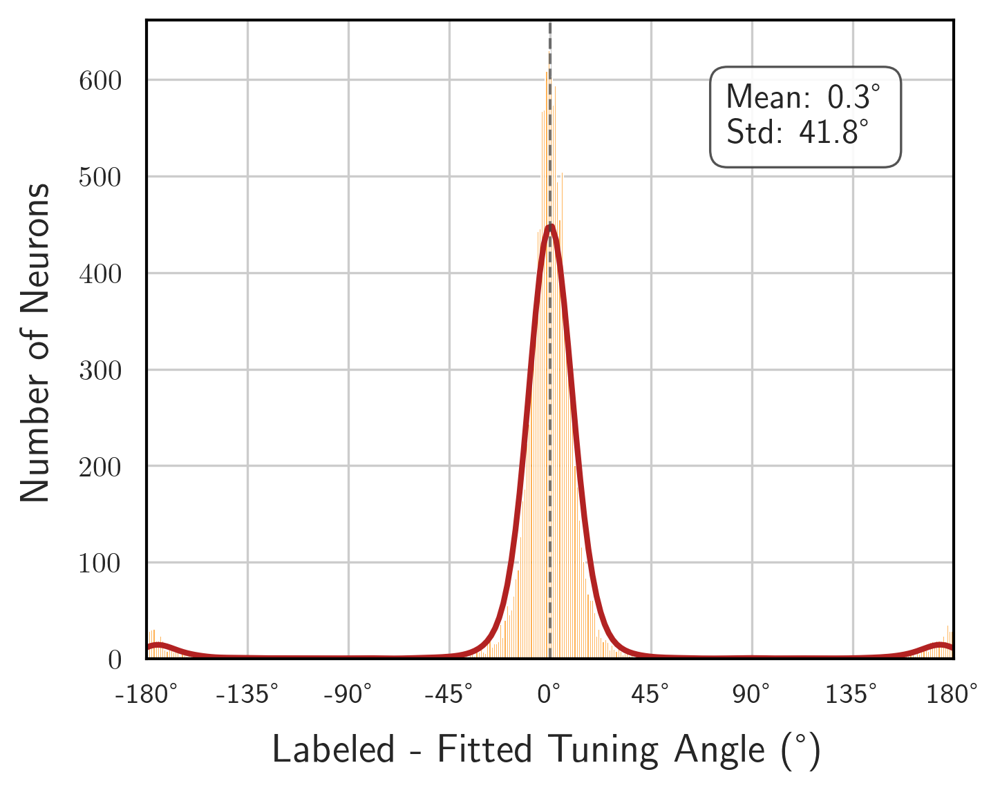

In [330]:
# plot an histogram with the variation of the tuning angle
v1_tuning_angles_diff = df['tuning_angle'] - df['preferred_angle']
v1_responsive_neurons_mask = np.logical_not(np.isnan(v1_tuning_angles_diff))
v1_tuning_angles_diff = v1_tuning_angles_diff[v1_responsive_neurons_mask]
v1_tuning_angles_diff = np.where(v1_tuning_angles_diff > 180, v1_tuning_angles_diff - 360, v1_tuning_angles_diff)
v1_tuning_angles_diff = np.where(v1_tuning_angles_diff < -180, v1_tuning_angles_diff + 360, v1_tuning_angles_diff)
print('V1 Percentage of responsive neurons:', np.sum(v1_responsive_neurons_mask) / len(v1_responsive_neurons_mask) * 100)
print('V1 Mean difference between preferred and estimated tuning angle:', np.nanmean(np.abs(v1_tuning_angles_diff)))

def plot_tuning_angle_variation(angle_diff, path='', save_fig=True):
    """
    Create a publication-ready plot showing the distribution of differences between 
    labeled and fitted tuning angles.
    
    Parameters:
    -----------
    angle_diff : numpy.ndarray
        Array of angle differences (labeled - fitted) in degrees
    path : str
        Directory path for saving the figure
    save_fig : bool
        Whether to save the figure or not
    """
    # Clean data - remove NaNs
    angle_diff = angle_diff[~np.isnan(angle_diff)]
    
    # Create figure with appropriate size and DPI for publication
    fig, ax = plt.subplots(figsize=(5, 4), dpi=300)
    
    # Calculate optimal bin width using Freedman-Diaconis rule
    n_bins = utils.freedman_diaconis(angle_diff, returnas="bins")
    
    # Plot the histogram with KDE
    hist = sns.histplot(
        angle_diff, 
        bins=n_bins, 
        kde=True, 
        ax=ax, 
        color='#FF8C00',  # Darker orange for better visibility in print
        edgecolor='white',  # White edges for better bin definition
        linewidth=0.5,
        alpha=0.7, 
        stat='count'
    )
    
    # Get KDE line and make it more prominent
    line = hist.lines[0]
    line.set_color('#B22222')  # Darker red for KDE line
    line.set_linewidth(2)
    
    # Add vertical line at zero
    ax.axvline(x=0, color='#404040', linestyle='--', linewidth=1, alpha=0.7)
    
    # Add statistics box with mean and std
    mean_diff = np.mean(angle_diff)
    std_diff = np.std(angle_diff)
    median_diff = np.median(angle_diff)
    
    stats_text = (f'Mean: {mean_diff:.1f}°\n'
                 f'Std: {std_diff:.1f}°')
    
    # Create more elegant stats box
    box = dict(
        boxstyle='round,pad=0.5',
        facecolor='white', 
        edgecolor='#404040',
        alpha=0.9
    )
    
    ax.text(
        0.72, 0.9, 
        stats_text, 
        horizontalalignment='left', 
        verticalalignment='top', 
        transform=ax.transAxes, 
        fontsize=12,
        fontweight='medium',
        bbox=box
    )
    
    # Customize the appearance
    ax.set_xlim(-180, 180)
    # Set x-ticks every 45 degrees for more granularity
    xticks = np.arange(-180, 181, 45)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'{x}°' for x in xticks], fontsize=10)
    # Customize y-axis
    ax.tick_params(axis='y', labelsize=10)
    # Set labels with proper scientific formatting
    ax.set_xlabel('Labeled - Fitted Tuning Angle (°)', fontsize=14, fontweight='bold')
    ax.set_ylabel('Number of Neurons', fontsize=14, fontweight='bold')
    # Add a subtle title
    # ax.set_title('Distribution of Tuning Angle Differences', fontsize=11, pad=10)
    
    # Make borders more visible
    for spine in ax.spines.values():
        spine.set_linewidth(1)
        spine.set_color('black')
    
    # Tight layout with a bit more padding
    plt.tight_layout()
    
    # Save with high quality settings
    if save_fig:
        if not os.path.exists(path):
            os.makedirs(path, exist_ok=True)
        plt.savefig(
            os.path.join(path, 'V1_tuning_angle_variation.png'), 
            dpi=300, 
            bbox_inches='tight',
            transparent=True
        )
    
    return fig, ax

plot_tuning_angle_variation(v1_tuning_angles_diff, path='Paper_figures')

In [331]:
# plot an histogram with the variation of the tuning angle
v1_tuning_angles_diff = df['tuning_angle'] - df['preferred_angle']
v1_responsive_neurons_mask = np.logical_not(np.isnan(v1_tuning_angles_diff))
v1_tuning_angles_diff = v1_tuning_angles_diff[v1_responsive_neurons_mask]
v1_tuning_angles_diff = np.where(v1_tuning_angles_diff > 180, v1_tuning_angles_diff - 360, v1_tuning_angles_diff)
v1_tuning_angles_diff = np.where(v1_tuning_angles_diff < -180, v1_tuning_angles_diff + 360, v1_tuning_angles_diff)
print('V1 Percentage of responsive neurons:', np.sum(v1_responsive_neurons_mask) / len(v1_responsive_neurons_mask) * 100)
print('V1 Mean difference between preferred and estimated tuning angle:', np.nanmean(np.abs(v1_tuning_angles_diff)))
print('V1 STD difference between preferred and estimated tuning angle:', np.nanstd(np.abs(v1_tuning_angles_diff)))


V1 Percentage of responsive neurons: 19.365122739900713
V1 Mean difference between preferred and estimated tuning angle: 16.624348903441927
V1 STD difference between preferred and estimated tuning angle: 38.37825510858869


## WEIGHTS DISTRIBUTION IN TARGET NEURON COORDINATES

In [333]:
df

,pop_name,cell_type,ei,tuning_angle,x,y,z,azimuth,elevation,node_id,max_mean_rate(Hz),preferred_angle,p_value_OSI,OSI,DSI,Ave_Rate(Hz),firing_rate_sp,region,p_value_OSI_corrected
tf_id,,,,,,,,,,,,,,,,,,,
0,i1Htr3a,L1 Htr3a,i,0.000000,215.722260,-127.750664,288.067749,75.100555,51.522709,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN
1,i1Htr3a,L1 Htr3a,i,1.809045,-317.582611,-116.269836,-58.897064,37.769218,37.644119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN
2,i1Htr3a,L1 Htr3a,i,3.618090,-193.192459,-124.866631,7.688277,46.476528,40.307529,0.0,6.60,NaN,0.242688,0.023382,0.004155,6.20000,6.67500,core,0.281690
3,i1Htr3a,L1 Htr3a,i,5.427135,249.000183,-147.456009,90.409622,77.430016,43.616386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN
4,i1Htr3a,L1 Htr3a,i,7.236181,-353.444244,-145.307861,8.257144,35.258904,40.330284,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65866,i6Sst,L6 SST,i,339.069763,210.587067,-797.246338,-184.810562,74.741096,32.607578,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN
65867,i6Sst,L6 SST,i,343.255829,-174.842270,-822.858521,59.488029,47.761040,42.379520,16363.0,2.10,NaN,0.885622,0.054013,0.054929,1.76250,9.10000,core,0.919909
65868,i6Sst,L6 SST,i,347.441864,366.073029,-698.065308,-119.328606,85.625107,35.226856,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,annulus,NaN


11428
1176995 1176995


/tmp/ipykernel_308935/1099171477.py:140: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


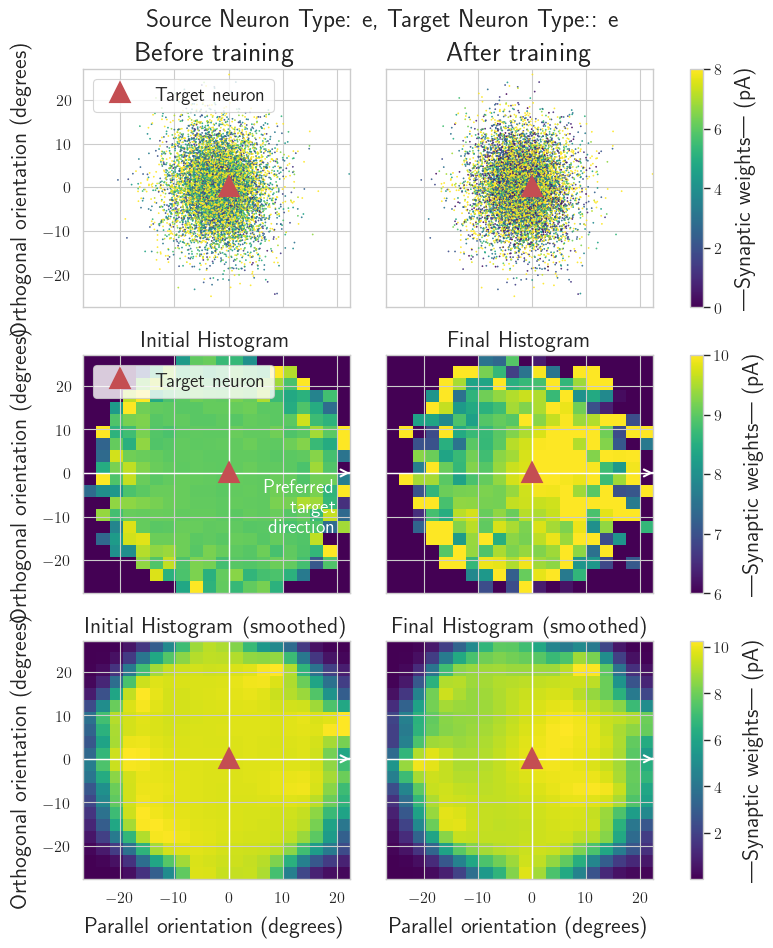

In [453]:
### DATA PREPARATION
cell_types = ['e', 'i']
source_cell_type = 'e'
target_cell_type = 'e'

# Select source and target IDs
# source_tf_ids = df.index[df['ei'] == source_cell_type].astype(np.int32).values
source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core')].astype(np.int32).values
target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
# target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core')].astype(np.int32).values

# source_tf_ids = df.index[(df['cell_type'] == 'L4 Exc') & (df['region'] == 'core')].astype(np.int32).values
# target_tf_ids = df.index[(df['cell_type'] == 'L6 Exc') & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
print(len(target_tf_ids))
# v1_df.dropna(subset=['p_value_OSI_corrected'], inplace=True)
# v1_df = v1_df[v1_df['p_value_OSI_corrected'] < 0.05].copy()
# Create sets for fast lookup
mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
selected_indices = indices[mask]
target_indices = selected_indices[:, 0]
source_indices = selected_indices[:, 1]
print(len(source_indices), len(target_indices))
# Mask voltage_scale_node_ids first
voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
initial_value_masked = np.abs(model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids)
final_value_masked = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)
# Calculate tuning angle differences
target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
# Calculate differences in coordinates
source_azimuth = df.loc[source_indices, 'azimuth'].values
target_azimuth = df.loc[target_indices, 'azimuth'].values
source_elevation = df.loc[source_indices, 'elevation'].values
target_elevation = df.loc[target_indices, 'elevation'].values
# source position in the target centered coordinate system
diff_azimuth = source_azimuth - target_azimuth
diff_elevation = source_elevation - target_elevation
# get the target neuron angle to define the rotation
target_tuning_angle_rad = np.radians(target_tuning_angles)
cos_angles = np.cos(target_tuning_angle_rad)
sin_angles = np.sin(target_tuning_angle_rad)
# Rotate the sources coordinates according to the target neuron preferred direction
diff_x_rot = diff_azimuth * cos_angles + diff_elevation * sin_angles
diff_z_rot = diff_elevation * cos_angles - diff_azimuth * sin_angles

# Now represent the weights as a function of the difference in coordinates
fig = plt.figure(figsize=(8, 10))
gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 0.05], wspace=0.2, hspace=0.2)

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1], sharex=ax0, sharey=ax0)
# Randomly select indices to sample
n_samples = min(len(diff_x_rot), 10000)
random_indices = np.random.choice(len(diff_x_rot), n_samples, replace=False)
# Initial scatter plot
scatter_initial = ax0.scatter(diff_x_rot[random_indices], diff_z_rot[random_indices], c=initial_value_masked[random_indices], 
                              cmap='viridis', s=0.2, alpha=1, vmin=0, vmax=8)
ax0.set_title('Before training', fontsize=20)
ax0.set_ylabel('Orthogonal orientation (degrees)', fontsize=16)
# Final scatter plot
scatter_final = ax1.scatter(diff_x_rot[random_indices], diff_z_rot[random_indices], c=final_value_masked[random_indices], 
                            cmap='viridis', s=0.2, alpha=1, vmin=0, vmax=8)
ax1.set_title('After training', fontsize=20)
scatter_cbar = plt.colorbar(scatter_final, cax=plt.subplot(gs[0, 2]))
scatter_cbar.set_label('|Synaptic weights| (pA)', fontsize=16)

# Create 2D histograms
bins = 20  # Number of bins in each dimension
# Initial histogram
H_initial, xedges_initial, yedges_initial = np.histogram2d(diff_x_rot, diff_z_rot, bins=bins, weights=initial_value_masked)
count_initial, _, _ = np.histogram2d(diff_x_rot, diff_z_rot, bins=bins)
H_initial = np.divide(H_initial, count_initial, out=np.zeros_like(H_initial), where=count_initial != 0)
# Final histogram
H_final, xedges_final, yedges_final = np.histogram2d(diff_x_rot, diff_z_rot, bins=bins, weights=final_value_masked)
count_final, _, _ = np.histogram2d(diff_x_rot, diff_z_rot, bins=bins)
H_final = np.divide(H_final, count_final, out=np.zeros_like(H_final), where=count_final != 0)

# Plot initial histogram with shared color scale
ax2 = plt.subplot(gs[1, 0], sharex=ax0, sharey=ax0)
im_initial = ax2.imshow(H_initial.T, origin='lower', 
                            extent=[xedges_initial[0], xedges_initial[-1], yedges_initial[0], yedges_initial[-1]], 
                            aspect='auto', cmap='viridis', vmin=0, vmax=10)
ax2.set_title('Initial Histogram', fontsize=16)
ax2.set_ylabel('Orthogonal orientation (degrees)', fontsize=16)
# Plot final histogram with shared color scale
ax3 = plt.subplot(gs[1, 1], sharex=ax0, sharey=ax0)
im_final = ax3.imshow(H_final.T, origin='lower', 
                        extent=[xedges_final[0], xedges_final[-1], yedges_final[0], yedges_final[-1]], 
                        aspect='auto', cmap='viridis', vmin=6, vmax=10)
ax3.set_title('Final Histogram', fontsize=16)
cb_final = plt.colorbar(im_final, cax=plt.subplot(gs[1, 2]))
cb_final.set_label('|Synaptic weights| (pA)', fontsize=16)

# Apply Gaussian filter to histograms
sigma = 1  # Standard deviation for Gaussian kernel
H_initial_filtered = gaussian_filter(H_initial, sigma=sigma)
H_final_filtered = gaussian_filter(H_final, sigma=sigma)
# Plot initial histogram with Gaussian filter applied
ax4 = plt.subplot(gs[2, 0], sharex=ax0, sharey=ax0)
im_initial_filtered = ax4.imshow(H_initial_filtered.T, origin='lower', 
                                    extent=[xedges_initial[0], xedges_initial[-1], yedges_initial[0], yedges_initial[-1]], 
                                    aspect='auto', cmap='viridis', vmin=0, vmax=8) 
ax4.set_title('Initial Histogram (smoothed)', fontsize=16)
ax4.set_xlabel('Parallel orientation (degrees)', fontsize=16)
ax4.set_ylabel('Orthogonal orientation (degrees)', fontsize=16)
# Plot final histogram with Gaussian filter applied
ax5 = plt.subplot(gs[2, 1], sharex=ax0, sharey=ax0)
im_final_filtered = ax5.imshow(H_final_filtered.T, origin='lower', 
                                    extent=[xedges_final[0], xedges_final[-1], yedges_final[0], yedges_final[-1]], 
                                    aspect='auto', cmap='viridis') 
ax5.set_title('Final Histogram (smoothed)', fontsize=16)
ax5.set_xlabel('Parallel orientation (degrees)', fontsize=16)
cb_final_filtered = plt.colorbar(im_final_filtered, cax=plt.subplot(gs[2, 2]))
cb_final_filtered.set_label(r'|Synaptic weights| (pA)', fontsize=16)
# Draw arrow and text for each subplot at y=0
for ax in [ax2, ax3, ax4, ax5]:
    ax.axvline(0, color='white', lw=1)
    ax.axhline(0, color='white', lw=1)
    ax.annotate('', xy=(ax.get_xlim()[1], 0), xytext=(ax.get_xlim()[1]-0.1, 0),
                arrowprops=dict(arrowstyle='->', color='white', lw=1.5))
    if ax == ax2:
        # Position for the centered text at the right end of the x-axis
        x_right = x_right = ax.get_xlim()[1] - 0.05 * (ax.get_xlim()[1] - ax.get_xlim()[0])  # Move left by 10% of x-axis range
        y_position = -0.025 * (ax.get_ylim()[1] - ax.get_ylim()[0])
        ax.text(x_right, y_position,
                'Preferred \n target \n direction', color='white', ha='right', va='top', fontsize=14, weight='bold')
# Hide y ticks for specific subplots (e.g., ax1, ax3, ax5)
for ax in [ax1, ax3, ax5]:
    ax.tick_params(axis='y', labelleft=False)
# Hide x ticks for specific subplots (e.g., ax0, ax1, ax2, ax3)
for ax in [ax0, ax1, ax2, ax3]:
    ax.tick_params(axis='x', labelbottom=False)

for ax in [ax0, ax1, ax2, ax3, ax4, ax5]:
    ax.plot(0, 0, 'r^', markersize=12, markeredgewidth=3, label='Target neuron')
ax0.legend(loc='upper left', fontsize=14)
ax2.legend(loc='upper left', fontsize=14)

fig.suptitle(f'Source Neuron Type: {source_cell_type}, Target Neuron Type:: {target_cell_type}', fontsize=18)
fig.subplots_adjust(top=0.92)
plt.tight_layout()
plt.show()

In [521]:
set(df['cell_type'])

{'L1 Htr3a',
 'L2/3 Exc',
 'L2/3 PV',
 'L2/3 SST',
 'L2/3 VIP',
 'L4 Exc',
 'L4 PV',
 'L4 SST',
 'L4 VIP',
 'L5 ET',
 'L5 IT',
 'L5 NP',
 'L5 PV',
 'L5 SST',
 'L5 VIP',
 'L6 Exc',
 'L6 PV',
 'L6 SST',
 'L6 VIP'}

In [587]:
source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
target_tf_ids = df.index[(df['cell_type'] == 'L6 Exc') & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
# target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
# Create sets for fast lookup
mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
selected_indices = indices[mask]
target_indices = selected_indices[:, 0]
source_indices = selected_indices[:, 1]
# Mask voltage_scale_node_ids first
voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
initial_value_masked = np.abs(model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids)
final_value_masked = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)
print(np.max(final_value_masked), np.min(final_value_masked))
# Calculate tuning angle differences
source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
# Calculate differences in coordinates
source_azimuth = df.loc[source_indices, 'azimuth'].values
target_azimuth = df.loc[target_indices, 'azimuth'].values
source_elevation = df.loc[source_indices, 'elevation'].values
target_elevation = df.loc[target_indices, 'elevation'].values
# source position in the target centered coordinate system
diff_azimuth = source_azimuth - target_azimuth
diff_elevation = source_elevation - target_elevation
# Convert to polar coordinates relative to target's preferred direction
# Calculate distance from target
distances = np.sqrt(diff_azimuth**2 + diff_elevation**2)
# Calculate angle relative to target's preferred direction
# Angle of source relative to target in visual field
source_angles = np.arctan2(diff_elevation, diff_azimuth) * 180 / np.pi
# Adjust angles relative to target's preferred direction
target_tuning_angle_deg = target_tuning_angles
relative_angles = source_angles - target_tuning_angle_deg
# Normalize angles to [0, 360)
# relative_angles = (relative_angles + 360) % 360
relative_angles = (relative_angles + 180) % 360 - 180
print(min(relative_angles), max(relative_angles))

# # get the target neuron angle to define the rotation
# target_tuning_angle_rad = np.radians(target_tuning_angles)
# cos_angles = np.cos(target_tuning_angle_rad)
# sin_angles = np.sin(target_tuning_angle_rad)
# # Rotate the sources coordinates according to the target neuron preferred direction
# diff_x_rot = diff_azimuth * cos_angles + diff_elevation * sin_angles
# diff_z_rot = diff_elevation * cos_angles - diff_azimuth * sin_angles
# # Distinghish between parallel, orthogonal and opposite tuning angles
# # Parallel
# parallel_tuning_mask = tuning_angle_diff < 15
# parallel_diff_x = diff_x_rot[parallel_tuning_mask]
# parallel_diff_z = diff_z_rot[parallel_tuning_mask]
# parallel_final_value_masked = final_value_masked[parallel_tuning_mask]
# # parallel_final_value_masked = initial_value_masked[parallel_tuning_mask]

# # Orthogonal
# orthogonal_tuning_mask = np.logical_and(tuning_angle_diff > 80, tuning_angle_diff < 100)
# orthogonal_diff_x = diff_x_rot[orthogonal_tuning_mask]
# orthogonal_diff_z = diff_z_rot[orthogonal_tuning_mask]
# orthogonal_final_value_masked = final_value_masked[orthogonal_tuning_mask]
# # orthogonal_final_value_masked = initial_value_masked[orthogonal_tuning_mask]
# # Opposite
# opposite_tuning_mask = tuning_angle_diff > 165
# opposite_diff_x = diff_x_rot[opposite_tuning_mask]
# opposite_diff_z = diff_z_rot[opposite_tuning_mask]
# opposite_final_value_masked = final_value_masked[opposite_tuning_mask]

1894.7891 0.0003179776
-179.99967616064797 179.99445978062658


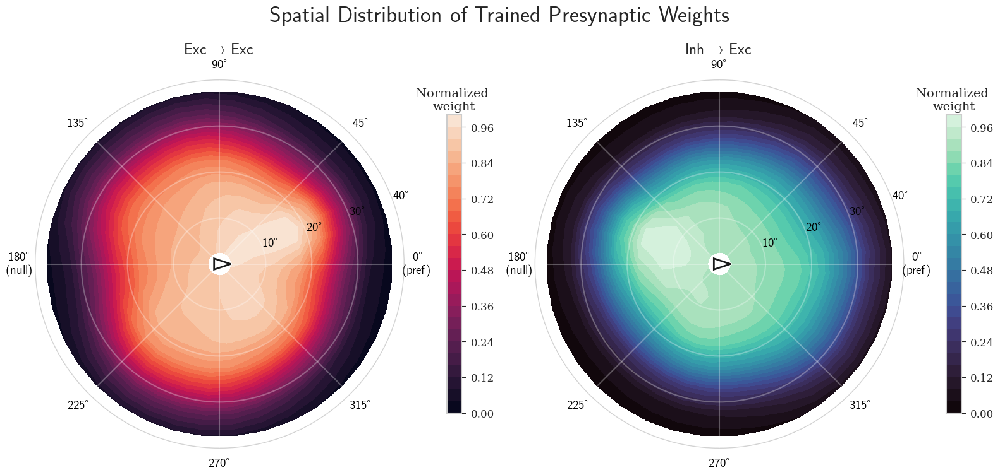

In [604]:
def plot_polar_synaptic_density(df, indices, model_variables_dict, voltage_scale, node_type_ids, ax=None,
                                source_ei='e', target_ei='e', source_cell_type=None, target_cell_type=None, variable_key='sparse_recurrent_weights:0',
                                use_final_weights=True, radial_bins=10, angular_bins=36, max_radius=40):
    """
    Create a polar plot showing the density of average synaptic weights 
    with respect to target neuron preferred direction.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        DataFrame containing neuron information
    indices : numpy.ndarray
        Connection indices [target, source]
    model_variables_dict : dict
        Dictionary containing initial and final model weights
    voltage_scale : numpy.ndarray
        Voltage scaling factors
    node_type_ids : numpy.ndarray
        Node type IDs for scaling
    source_cell_type : str
        Source cell type filter
    target_cell_type : str
        Target cell type filter
    variable_key : str
        Key for accessing weights in model_variables_dict
    use_final_weights : bool
        Whether to use final (True) or initial (False) weights
    radial_bins : int
        Number of radial bins for binning distances
    angular_bins : int
        Number of angular bins (typically 36 for 10-degree bins)
    max_radius : float
        Maximum radius to consider in degrees
    """

    # Set publication-ready style
    with plt.style.context('seaborn-v0_8-paper'):
        # Configure matplotlib for publication quality
        plt.rcParams.update({
            'font.family': 'serif',
            'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans', 'Bitstream Vera Sans', 'sans-serif'],
            'font.size': 12,
            'axes.linewidth': 1.5,
            'axes.labelsize': 14,
            'axes.titlesize': 16,
            'xtick.labelsize': 12,
            'ytick.labelsize': 12,
            'legend.fontsize': 12,
            'figure.dpi': 300,
            'savefig.dpi': 300,
            'savefig.bbox': 'tight',
            'text.usetex': False  # Set to True if you have LaTeX installed
        })
    
        # Select source and target neurons
        if source_cell_type is not None:
            source_tf_ids = df.index[(df['cell_type'] == source_cell_type) & (df['region'] == 'core')].astype(np.int32).values
        else:
            source_tf_ids = df.index[(df['ei'] == source_ei) & (df['region'] == 'core')].astype(np.int32).values
        if target_cell_type is not None:
            target_tf_ids = df.index[(df['cell_type'] == target_cell_type) & (df['region'] == 'core') & 
                                    (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
        else:
            target_tf_ids = df.index[(df['ei'] == target_ei) & (df['region'] == 'core') &  (df['OSI'] > 0.4) & 
                                    (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
        
        # Create connection mask
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Get synaptic weights
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        if use_final_weights:
            weights = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)
            weight_label = 'Trained weights'
        else:
            weights = np.abs(model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids)
            weight_label = 'Initial weights'
        # Get target neuron preferred angles
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        # Calculate spatial differences
        source_azimuth = df.loc[source_indices, 'azimuth'].values
        target_azimuth = df.loc[target_indices, 'azimuth'].values
        source_elevation = df.loc[source_indices, 'elevation'].values
        target_elevation = df.loc[target_indices, 'elevation'].values
        # Source position relative to target
        diff_azimuth = source_azimuth - target_azimuth
        diff_elevation = source_elevation - target_elevation
        # Convert to polar coordinates relative to target's preferred direction
        # Calculate distance from target
        distances = np.sqrt(diff_azimuth**2 + diff_elevation**2)
        # Calculate angle relative to target's preferred direction
        # Angle of source relative to target in visual field
        source_angles = np.arctan2(diff_elevation, diff_azimuth) * 180 / np.pi
        # Adjust angles relative to target's preferred direction
        target_tuning_angle_deg = target_tuning_angles
        relative_angles = source_angles - target_tuning_angle_deg
        # Normalize angles to [0, 360)
        # relative_angles = (relative_angles + 360) % 360
        relative_angles = (relative_angles + 180) % 360 - 180
        # Filter by maximum radius
        valid_mask = distances <= max_radius

        # tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        # tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
        # # valid_mask = np.logical_and(valid_mask, tuning_angle_diff > 165)
        # valid_mask = np.logical_and(valid_mask, tuning_angle_diff < 15)
        # valid_mask = np.logical_and(valid_mask, tuning_angle_diff > 80, tuning_angle_diff < 100)

        distances = distances[valid_mask]
        relative_angles = relative_angles[valid_mask]
        weights = weights[valid_mask]
        # Create polar grid
        r_edges = np.linspace(0, max_radius, radial_bins + 1)
        # theta_edges = np.linspace(0, 360, angular_bins + 1)
        theta_edges    = np.linspace(-180, 180, angular_bins + 1)  # edges, not centres
        theta_edges_rad = np.deg2rad(theta_edges)                  # for plotting

        # Weighted sum per (radius, angle) bin
        hist_sum,   _, _ = np.histogram2d(distances,
                                        relative_angles,
                                        bins=[r_edges, theta_edges],
                                        weights=weights)
        # Number of observations per bin
        hist_count, _, _ = np.histogram2d(distances,
                                        relative_angles,
                                        bins=[r_edges, theta_edges])
        # Mean weight (0 where no samples fell into the bin)
        avg_weight_matrix = np.divide(hist_sum, hist_count,
                            out=np.zeros_like(hist_sum, dtype=float),
                            where=hist_count > 0)


        # avg_weight_matrix, _, _ = np.histogram2d(distances,
        #                                 relative_angles,
        #                                 bins=[r_edges, theta_edges])
        # # # divide by the number of target neurons
        # bin_area = np.outer(np.diff(r_edges), np.deg2rad(np.diff(theta_edges)))
        # avg_weight_matrix = avg_weight_matrix / (bin_area * len(target_tf_ids))
        # print(len(target_tf_ids), len(source_tf_ids), np.sum(avg_weight_matrix), len(distances))

        # -----------------------------------------------------------
        # Smooth in a way that respects geometry:
        #   • radius  : ordinary (non‑periodic) axis  -> use 'nearest'
        #   • angle   : periodic (0° == 360°)        -> use 'wrap'
        # -----------------------------------------------------------
        #
        # gaussian_filter accepts one σ per axis **and** one boundary
        # mode per axis, so we can do everything in a single call.
        # -----------------------------------------------------------

        sigma_r, sigma_theta = 1.2, 1.5         # feel free to tune
        smoothed_weights = gaussian_filter(avg_weight_matrix,
                                sigma=[sigma_r, sigma_theta],
                                mode=['nearest', 'wrap'])
        # smoothed_weights = avg_weight_matrix.copy()  # For debugging, remove later
        # -----------------------------------------------------------
        # Prepare data for polar contourf:
        #   – duplicate the first angular column so the plot closes,
        #     because contourf wants a full 0 → 2π grid
        # -----------------------------------------------------------

        smoothed_weights_wrapped = np.hstack((smoothed_weights, smoothed_weights[:, :1]))        # (radial_bins, angular_bins+1)
        theta_centers = np.radians((theta_edges[:-1] + theta_edges[1:]) / 2)
        theta_centers = np.append(theta_centers, theta_centers[0] + 2*np.pi)

        r_centers = (r_edges[:-1] + r_edges[1:]) / 2
        # Fix: Use r_edges directly instead of r_centers to start from 0
        # r_centers = r_edges[:-1]  # Use the left edges of bins to start from 0
        # Alternative: if you want true centers but starting from 0:
        # r_centers = np.concatenate([[0], (r_edges[1:-1] + r_edges[2:]) / 2])

        THETA, R = np.meshgrid(theta_centers, r_centers)
        # THETA, R = np.meshgrid(theta_edges_rad, r_edges[:-1])   # edges!           # avoids off‑by‑one artefacts


        if ax is None:
            fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': 'polar'})
        
        if 'e' in source_ei or source_cell_type is not None and 'E' in source_cell_type:
            cmap = 'rocket' # inferno, rocket, YlOrRd
            # cmap = 'Reds'

        else:
            cmap = 'mako' # cividis, mako, PuBu
            # cmap = 'Blues'

        # vmin = 3
        # vmax = np.max(smoothed_weights_wrapped)
        # levels = np.linspace(3, 13, 25)        
        levels = 25
        smoothed_weights_wrapped /= np.max(smoothed_weights_wrapped)  # Normalize to [0, 1] for better color mapping
        im = ax.contourf(THETA, R, smoothed_weights_wrapped, levels=levels, cmap=cmap,
                         extend='neither')

        # Add right-pointing triangle at center (0, 0)
        # Triangle vertices in Cartesian coordinates
        triangle_size = max_radius * 0.06  # Size relative to plot
        triangle_vertices = np.array([
            [triangle_size, 0],           # Right point (tip)
            [-triangle_size/2, triangle_size/2],   # Top left
            [-triangle_size/2, -triangle_size/2]   # Bottom left
        ])
        
        # Convert to polar coordinates for plotting
        triangle_r = np.sqrt(triangle_vertices[:, 0]**2 + triangle_vertices[:, 1]**2)
        triangle_theta = np.arctan2(triangle_vertices[:, 1], triangle_vertices[:, 0])
        
        # Close the triangle by repeating the first point
        triangle_r = np.append(triangle_r, triangle_r[0])
        triangle_theta = np.append(triangle_theta, triangle_theta[0])
        
        # Plot the triangle
        ax.plot(triangle_theta, triangle_r, 'w-', linewidth=3, zorder=10)
        ax.fill(triangle_theta, triangle_r, color='white', edgecolor='black', 
                linewidth=2, zorder=10, alpha=0.9)

        ax.set_theta_zero_location('E')               # 0° at the preferred direction
        ax.set_theta_direction(1)                     # counter‑clockwise positive
        ax.set_ylim(0, max_radius)
        # Set radial ticks with better spacing and visibility
        rticks = np.arange(10, max_radius + 1, 10)
        ax.set_rticks(rticks)
        ax.set_rlabel_position(20)  # Position radial labels at 20 degrees

        # Make radial tick labels more visible
        ax.set_yticklabels([f'{int(r)}°' for r in rticks], fontsize=14, color='white', fontweight='normal')
        # increase x tick label size
        ax.tick_params(axis='both', labelsize=14, colors='black', width=1.5)
        
        # Move grid setup AFTER the contour plot and set higher z-order
        ax.grid(True, alpha=0.3, linewidth=1.5, color='white', zorder=5)
        ax.set_axisbelow(False)  # Ensure grid is on top

        ax.set_thetagrids(np.arange(0, 360, 45),
                        ['0°\n(pref)', '45°', '90°', '135°',
                        '180°\n(null)', '225°', '270°', '315°'])

        cbar = plt.colorbar(im, ax=ax, fraction=0.035, pad=0.1)
        # set the upper title of the cbar
        # cbar.ax.set_title('Connections / deg²', fontsize=14)
        cbar.ax.set_title('Normalized \nweight', fontsize=14)


        # Set title with better formatting
        source_title = source_cell_type if source_cell_type else source_ei
        target_title = target_cell_type if target_cell_type else target_ei
        source_name = f'{source_title}'
        target_name = f'{target_title}'
        # title = f'Spatial Distribution of {weight_label}\n{source_name} → {target_name} Connections'
        title = f'{source_name} → {target_name}'
        if source_ei == 'e' and target_ei == 'e':
            title = f'Exc → Exc'
        else:
            title = 'Inh → Exc'
        ax.set_title(title, pad=30, fontsize=18, fontweight='bold')

        # plt.tight_layout()
        # plt.show()
        # return fig, ax, avg_weight_matrix#, count_matrix

# # Example usage:
# fig, ax, weight_matrix, count_matrix = plot_polar_synaptic_density(
#     df, indices, model_variables_dict, voltage_scale, node_type_ids,
#     source_cell_type='e', target_cell_type='e', 
#     use_final_weights=True, radial_bins=8, angular_bins=36, max_radius=40
# )
# plt.show()

# create a subplots with the polar plot, one for exc source and the other for inh
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), subplot_kw={'projection': 'polar'})
plot_polar_synaptic_density(
    df, indices, model_variables_dict, voltage_scale, node_type_ids, ax=ax1,
    source_ei='e', target_ei='e', #target_cell_type='L2/3 Exc',#
    use_final_weights=True, radial_bins=8, angular_bins=36, max_radius=40
)
plot_polar_synaptic_density(
    df, indices, model_variables_dict, voltage_scale, node_type_ids, ax=ax2,
    source_ei='i', target_ei = 'e', #target_cell_type='L2/3 Exc',#target_cell_type='i', #
    use_final_weights=True, radial_bins=8, angular_bins=36, max_radius=40
)
# fig.suptitle('Spatial Distribution of Presynaptic Neurons', fontsize=26, fontweight='bold')
fig.suptitle('Spatial Distribution of Trained Presynaptic Weights', fontsize=26, fontweight='bold')
fig.tight_layout()
plt.show()

In [454]:
# Final histogram
H_final, xedges_final, yedges_final = np.histogram2d(diff_x_rot, diff_z_rot, bins=bins, weights=final_value_masked)
H_initial, xedges_initial, yedges_initial = np.histogram2d(diff_x_rot, diff_z_rot, bins=bins, weights=initial_value_masked)
count_final, _, _ = np.histogram2d(diff_x_rot, diff_z_rot, bins=bins)
H_final = np.divide(H_final, count_final, out=np.zeros_like(H_final), where=count_final != 0)
H_initial = np.divide(H_initial, count_final, out=np.zeros_like(H_initial), where=count_final != 0)

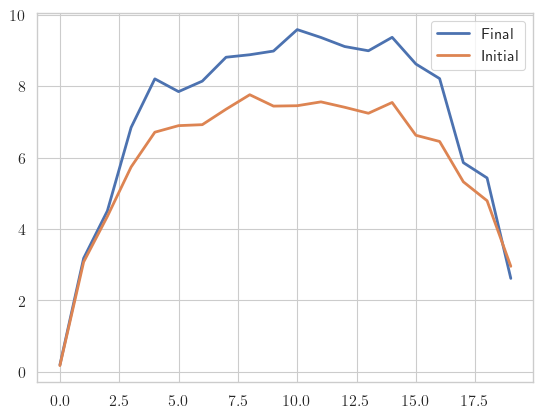

In [455]:
# plt.plot(np.sum(H_final, axis=1)/np.max(np.sum(H_final, axis=1)), label='Final')
# plt.plot(np.sum(H_initial, axis=1)/np.max(np.sum(H_initial, axis=1)), label='Initial')
plt.plot(np.mean(H_final, axis=1), label='Final')
plt.plot(np.mean(H_initial, axis=1), label='Initial')
plt.legend()
plt.show()

## WEIGHTS DISTRIBUTION FOR PARALLEL, PERPENDICULAR AND OPPOSITTE SOURCE NEURONS


e - e : Mean value of parallel histogram: 8.455695152282715
e - e : Mean value of perpendicular histogram: 8.287858963012695
e - e : Mean value of opposite histogram: 8.262139320373535

e - i : Mean value of parallel histogram: 8.455695152282715
e - i : Mean value of perpendicular histogram: 8.287858963012695
e - i : Mean value of opposite histogram: 8.262139320373535

i - e : Mean value of parallel histogram: 10.614763259887695
i - e : Mean value of perpendicular histogram: 10.852411270141602
i - e : Mean value of opposite histogram: 10.514036178588867

i - i : Mean value of parallel histogram: 10.614763259887695
i - i : Mean value of perpendicular histogram: 10.852411270141602
i - i : Mean value of opposite histogram: 10.514036178588867


/home/jgalvan/.conda/envs/predictive_coding_tf212/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


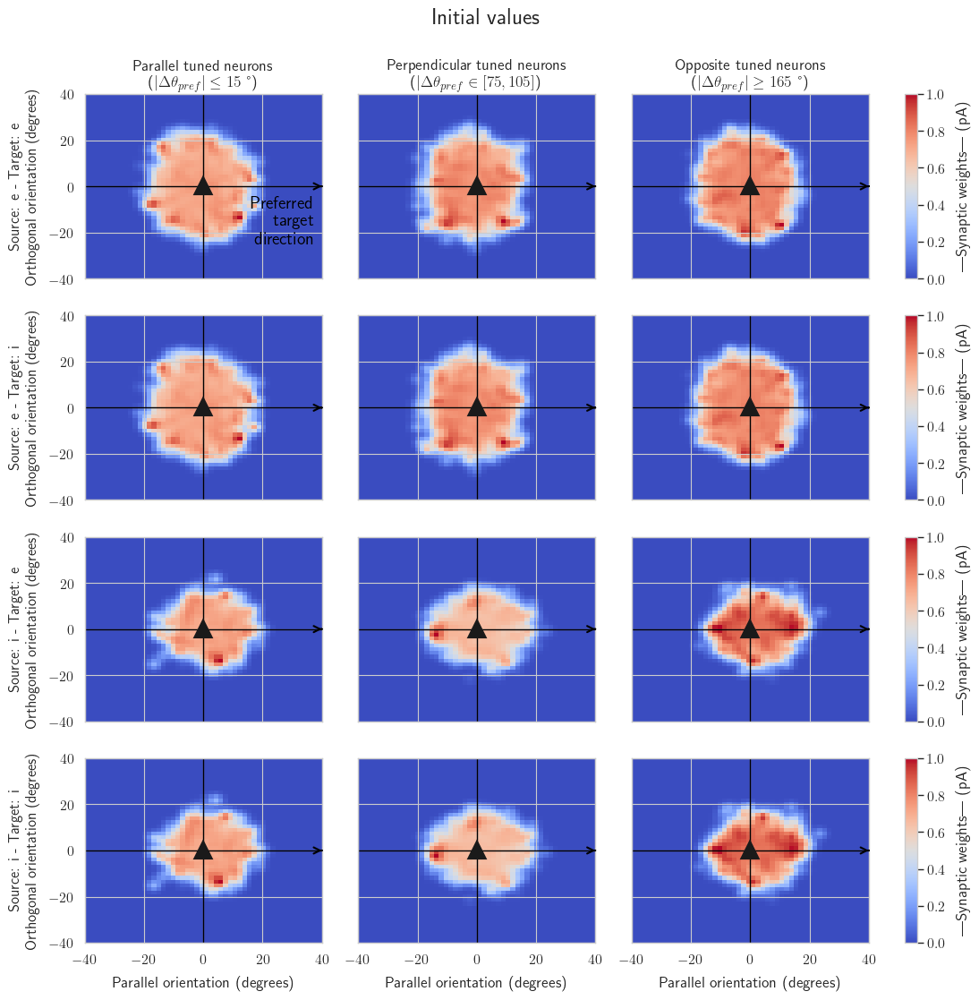

In [180]:
target_cell_types = ['e', 'i']
source_cell_types = ['e', 'i']

fig = plt.figure(figsize=(12, 6 * len(source_cell_types)), constrained_layout=True)
if len(source_cell_types) * len(target_cell_types) == 4:
    top_title_space = 0.9
else:
    top_title_space = 0.85
gs = gridspec.GridSpec(len(source_cell_types) * len(target_cell_types), 4, width_ratios=[1, 1, 1, 0.05], top=top_title_space, wspace=0.2, hspace=0.2)
plot_index = 0
for row, source_cell_type in enumerate(source_cell_types):
    # Select source and target IDs
    # source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core') & (df['OSI'] > 0.2)].astype(np.int32).values
    source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core')].astype(np.int32).values
    for col, target_cell_type in enumerate(target_cell_types):
        target_tf_ids = df.index[(df['cell_type'] == 'L6 Exc') & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
        # target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
        # Create sets for fast lookup
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Mask voltage_scale_node_ids first
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_value_masked = np.abs(model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids)
        final_value_masked = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)
        # Calculate tuning angle differences
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
        # Calculate differences in coordinates
        source_azimuth = df.loc[source_indices, 'azimuth'].values
        target_azimuth = df.loc[target_indices, 'azimuth'].values
        source_elevation = df.loc[source_indices, 'elevation'].values
        target_elevation = df.loc[target_indices, 'elevation'].values
        # source position in the target centered coordinate system
        diff_azimuth = source_azimuth - target_azimuth
        diff_elevation = source_elevation - target_elevation
        # get the target neuron angle to define the rotation
        target_tuning_angle_rad = np.radians(target_tuning_angles)
        cos_angles = np.cos(target_tuning_angle_rad)
        sin_angles = np.sin(target_tuning_angle_rad)
        # Rotate the sources coordinates according to the target neuron preferred direction
        diff_x_rot = diff_azimuth * cos_angles + diff_elevation * sin_angles
        diff_z_rot = diff_elevation * cos_angles - diff_azimuth * sin_angles
        # Distinghish between parallel, orthogonal and opposite tuning angles
        # Parallel
        parallel_tuning_mask = tuning_angle_diff < 15
        parallel_diff_x = diff_x_rot[parallel_tuning_mask]
        parallel_diff_z = diff_z_rot[parallel_tuning_mask]
        parallel_final_value_masked = initial_value_masked[parallel_tuning_mask]

        # Orthogonal
        orthogonal_tuning_mask = np.logical_and(tuning_angle_diff > 80, tuning_angle_diff < 100)
        orthogonal_diff_x = diff_x_rot[orthogonal_tuning_mask]
        orthogonal_diff_z = diff_z_rot[orthogonal_tuning_mask]
        orthogonal_final_value_masked = initial_value_masked[orthogonal_tuning_mask]
        # Opposite
        opposite_tuning_mask = tuning_angle_diff > 165
        opposite_diff_x = diff_x_rot[opposite_tuning_mask]
        opposite_diff_z = diff_z_rot[opposite_tuning_mask]
        opposite_final_value_masked = initial_value_masked[opposite_tuning_mask]

        bins = 50
        area_dimensions = [[-40, 40], [-40, 40]]
        # area_dimensions = [[-10, 10], [-10, 10]]
        # Parallel
        H_parallel, xedges_parallel, yedges_parallel = np.histogram2d(parallel_diff_x, parallel_diff_z, bins=bins, range=area_dimensions, weights=parallel_final_value_masked)
        count_parallel, _, _ = np.histogram2d(parallel_diff_x, parallel_diff_z, range=area_dimensions, bins=bins)
        H_parallel = np.divide(H_parallel, count_parallel, out=np.zeros_like(H_parallel), where=count_parallel != 0)
        # Orthogonal
        H_perpendicular, xedges_perpendicular, yedges_perpendicular = np.histogram2d(orthogonal_diff_x, orthogonal_diff_z, bins=bins, range=area_dimensions, weights=orthogonal_final_value_masked)
        count_perpendicular, _, _ = np.histogram2d(orthogonal_diff_x, orthogonal_diff_z, range=area_dimensions, bins=bins)
        H_perpendicular = np.divide(H_perpendicular, count_perpendicular, out=np.zeros_like(H_perpendicular), where=count_perpendicular != 0)
        # Opposite
        H_opp, xedges_opp, yedges_opp = np.histogram2d(opposite_diff_x, opposite_diff_z, bins=bins, range=area_dimensions, weights=opposite_final_value_masked)
        count_opp, _, _ = np.histogram2d(opposite_diff_x, opposite_diff_z, range=area_dimensions, bins=bins)
        H_opp = np.divide(H_opp, count_opp, out=np.zeros_like(H_opp), where=count_opp != 0)
        # Apply Gaussian filter to histograms
        sigma = 1
        H_parallel_filtered = gaussian_filter(H_parallel, sigma=sigma)
        H_perpendicular_filtered = gaussian_filter(H_perpendicular, sigma=sigma)
        H_opp_filtered = gaussian_filter(H_opp, sigma=sigma)
        # Normalize them with respect to the maximum value
        H_parallel_filtered = H_parallel_filtered / np.max(H_parallel_filtered)
        H_perpendicular_filtered = H_perpendicular_filtered / np.max(H_perpendicular_filtered)
        H_opp_filtered = H_opp_filtered / np.max(H_opp_filtered)
        
        # print the mean values of each histogram
        print()
        print(f'{source_cell_type} - {target_cell_type} : Mean value of parallel histogram: {np.mean(parallel_final_value_masked)}')
        print(f'{source_cell_type} - {target_cell_type} : Mean value of perpendicular histogram: {np.mean(orthogonal_final_value_masked)}')
        print(f'{source_cell_type} - {target_cell_type} : Mean value of opposite histogram: {np.mean(opposite_final_value_masked)}')
        # Define limits of the histograms
        # global_min = 0
        # global_max = 30
        # Get the access for each subplot
        ax_parallel = plt.subplot(gs[plot_index, 0])
        ax_perpendicular = plt.subplot(gs[plot_index, 1], sharex=ax_parallel, sharey=ax_parallel)
        ax_opposite = plt.subplot(gs[plot_index, 2], sharex=ax_parallel, sharey=ax_parallel)

        im_parallel_filtered = ax_parallel.imshow(H_parallel_filtered.T, origin='lower', 
                                                extent=[xedges_parallel[0], xedges_parallel[-1], yedges_parallel[0], yedges_parallel[-1]], 
                                                aspect='auto', cmap='coolwarm') #, vmin=global_min, vmax=global_max)
        ax_parallel.axhline(0, color='black', lw=1)
        ax_parallel.axvline(0, color='black', lw=1)
        ax_parallel.annotate('', xy=(ax_parallel.get_xlim()[1], 0), xytext=(ax_parallel.get_xlim()[1]-0.1, 0),
                    arrowprops=dict(arrowstyle='->', color='black', lw=1.5))
        ax_parallel.set_ylabel(f'Source: {source_cell_type} - Target: {target_cell_type}\n Orthogonal orientation (degrees)', fontsize=12)

        im_perpendicular_filtered = ax_perpendicular.imshow(H_perpendicular_filtered.T, origin='lower', 
                                                            extent=[xedges_perpendicular[0], xedges_perpendicular[-1], yedges_perpendicular[0], yedges_perpendicular[-1]], 
                                                            aspect='auto', cmap='coolwarm') #, vmin=global_min, vmax=global_max)
        ax_perpendicular.axhline(0, color='black', lw=1)
        ax_perpendicular.axvline(0, color='black', lw=1)
        ax_perpendicular.annotate('', xy=(ax_perpendicular.get_xlim()[1], 0), xytext=(ax_perpendicular.get_xlim()[1]-0.1, 0),
                    arrowprops=dict(arrowstyle='->', color='black', lw=1.5))
        
        im_opp_filtered = ax_opposite.imshow(H_opp_filtered.T, origin='lower', 
                                            extent=[xedges_opp[0], xedges_opp[-1], yedges_opp[0], yedges_opp[-1]], 
                                            aspect='auto', cmap='coolwarm') #, vmin=global_min, vmax=global_max)
        ax_opposite.axhline(0, color='black', lw=1)
        ax_opposite.axvline(0, color='black', lw=1)
        ax_opposite.annotate('', xy=(ax_opposite.get_xlim()[1], 0), xytext=(ax_opposite.get_xlim()[1]-0.1, 0),
                    arrowprops=dict(arrowstyle='->', color='black', lw=1.5))

        cbar = plt.colorbar(im_opp_filtered, cax=plt.subplot(gs[plot_index, 3]))
        cbar.set_label('|Synaptic weights| (pA)')

        ax_parallel.plot(0, 0, 'k^', markersize=12, markeredgewidth=3, label='Target neuron')
        ax_perpendicular.plot(0, 0, 'k^', markersize=12, markeredgewidth=3, label='Target neuron')
        ax_opposite.plot(0, 0, 'k^', markersize=12, markeredgewidth=3, label='Target neuron')

        if row == 0 and col == 0:
            ax_parallel.set_title(f'Parallel tuned neurons\n' + r'($|\Delta \theta_{pref}| \leq 15$ °)')
            ax_perpendicular.set_title(f'Perpendicular tuned neurons\n' + r'($|\Delta \theta_{pref} \in [75, 105]$)')
            ax_opposite.set_title(f'Opposite tuned neurons\n' + r'($|\Delta \theta_{pref}| \geq 165$ °)')
            # Position for the centered text at the right end of the x-axis
            x_right = ax_parallel.get_xlim()[1] - 0.03 * (ax_parallel.get_xlim()[1] - ax_parallel.get_xlim()[0])  # Move left by 10% of x-axis range
            y_position = -0.05 * (ax_parallel.get_ylim()[1] - ax_parallel.get_ylim()[0])
            ax_parallel.text(x_right, y_position,
                    'Preferred \n target\n direction', color='black', ha='right', va='top', fontsize=14, weight='bold')
            
        plt.setp(ax_perpendicular.get_yticklabels(), visible=False)
        plt.setp(ax_opposite.get_yticklabels(), visible=False)
        plot_index += 1

for i in range(plot_index-1):
    plt.setp(plt.subplot(gs[i, 0]).get_xticklabels(), visible=False)
    plt.setp(plt.subplot(gs[i, 1]).get_xticklabels(), visible=False)
    plt.setp(plt.subplot(gs[i, 2]).get_xticklabels(), visible=False)

plt.subplot(gs[plot_index-1, 0]).set_xlabel('Parallel orientation (degrees)')
plt.subplot(gs[plot_index-1, 1]).set_xlabel('Parallel orientation (degrees)')
plt.subplot(gs[plot_index-1, 2]).set_xlabel('Parallel orientation (degrees)')

fig.suptitle(f'Initial values', fontsize=18)
plt.show()

1894.7891 0.0003179776

e - e : Mean value of parallel histogram: 35.481449127197266
e - e : Mean value of perpendicular histogram: 3.812023639678955
e - e : Mean value of opposite histogram: 18.515846252441406
1894.7891 0.0003179776

e - i : Mean value of parallel histogram: 35.481449127197266
e - i : Mean value of perpendicular histogram: 3.812023639678955
e - i : Mean value of opposite histogram: 18.515846252441406
394.51288 0.024407156

i - e : Mean value of parallel histogram: 6.378138065338135
i - e : Mean value of perpendicular histogram: 18.306472778320312
i - e : Mean value of opposite histogram: 6.872657299041748
394.51288 0.024407156

i - i : Mean value of parallel histogram: 6.378138065338135
i - i : Mean value of perpendicular histogram: 18.306472778320312
i - i : Mean value of opposite histogram: 6.872657299041748


/home/jgalvan/.conda/envs/predictive_coding_tf212/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


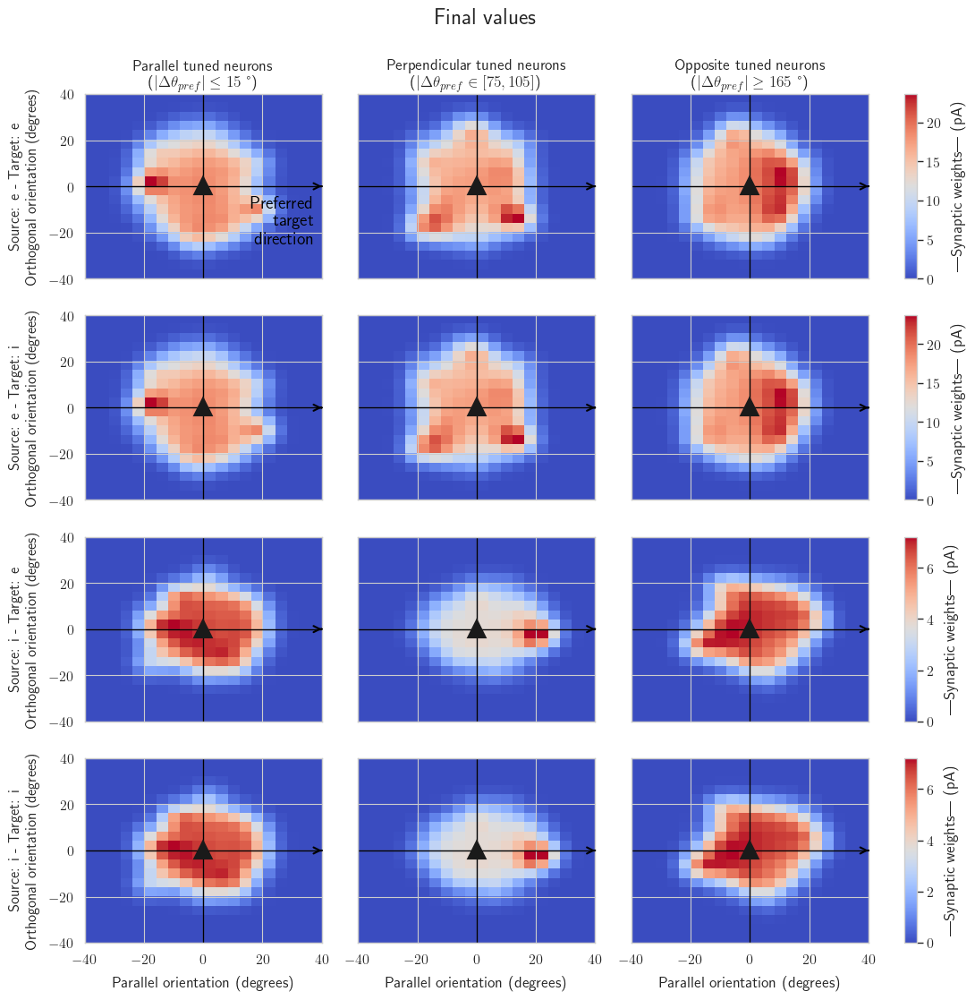

In [183]:
target_cell_types = ['e', 'i']
source_cell_types = ['e', 'i']

fig = plt.figure(figsize=(12, 6 * len(source_cell_types)), constrained_layout=True)
if len(source_cell_types) * len(target_cell_types) == 4:
    top_title_space = 0.9
else:
    top_title_space = 0.85
gs = gridspec.GridSpec(len(source_cell_types) * len(target_cell_types), 4, width_ratios=[1, 1, 1, 0.05], top=top_title_space, wspace=0.2, hspace=0.2)
plot_index = 0
for row, source_cell_type in enumerate(source_cell_types):
    # Select source and target IDs
    # source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core') & (df['OSI'] > 0.2)].astype(np.int32).values
    source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
    for col, target_cell_type in enumerate(target_cell_types):
        target_tf_ids = df.index[(df['cell_type'] == 'L6 Exc') & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
        # target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
        # Create sets for fast lookup
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Mask voltage_scale_node_ids first
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_value_masked = np.abs(model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids)
        final_value_masked = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)
        print(np.max(final_value_masked), np.min(final_value_masked))
        # Calculate tuning angle differences
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
        # Calculate differences in coordinates
        source_azimuth = df.loc[source_indices, 'azimuth'].values
        target_azimuth = df.loc[target_indices, 'azimuth'].values
        source_elevation = df.loc[source_indices, 'elevation'].values
        target_elevation = df.loc[target_indices, 'elevation'].values
        # source position in the target centered coordinate system
        diff_azimuth = source_azimuth - target_azimuth
        diff_elevation = source_elevation - target_elevation
        # get the target neuron angle to define the rotation
        target_tuning_angle_rad = np.radians(target_tuning_angles)
        cos_angles = np.cos(target_tuning_angle_rad)
        sin_angles = np.sin(target_tuning_angle_rad)
        # Rotate the sources coordinates according to the target neuron preferred direction
        diff_x_rot = diff_azimuth * cos_angles + diff_elevation * sin_angles
        diff_z_rot = diff_elevation * cos_angles - diff_azimuth * sin_angles
        # Distinghish between parallel, orthogonal and opposite tuning angles
        # Parallel
        parallel_tuning_mask = tuning_angle_diff < 15
        parallel_diff_x = diff_x_rot[parallel_tuning_mask]
        parallel_diff_z = diff_z_rot[parallel_tuning_mask]
        parallel_final_value_masked = final_value_masked[parallel_tuning_mask]
        # parallel_final_value_masked = initial_value_masked[parallel_tuning_mask]

        # Orthogonal
        orthogonal_tuning_mask = np.logical_and(tuning_angle_diff > 80, tuning_angle_diff < 100)
        orthogonal_diff_x = diff_x_rot[orthogonal_tuning_mask]
        orthogonal_diff_z = diff_z_rot[orthogonal_tuning_mask]
        orthogonal_final_value_masked = final_value_masked[orthogonal_tuning_mask]
        # orthogonal_final_value_masked = initial_value_masked[orthogonal_tuning_mask]
        # Opposite
        opposite_tuning_mask = tuning_angle_diff > 165
        opposite_diff_x = diff_x_rot[opposite_tuning_mask]
        opposite_diff_z = diff_z_rot[opposite_tuning_mask]
        opposite_final_value_masked = final_value_masked[opposite_tuning_mask]
        # opposite_final_value_masked = initial_value_masked[opposite_tuning_mask]

        bins = 20
        area_dimensions = [[-40, 40], [-40, 40]]
        # area_dimensions = [[-20, 20], [-20, 20]]
        # area_dimensions = [[-10, 10], [-10, 10]]
        # Parallel
        H_parallel, xedges_parallel, yedges_parallel = np.histogram2d(parallel_diff_x, parallel_diff_z, bins=bins, range=area_dimensions, weights=parallel_final_value_masked)
        count_parallel, _, _ = np.histogram2d(parallel_diff_x, parallel_diff_z, range=area_dimensions, bins=bins)
        H_parallel = np.divide(H_parallel, count_parallel, out=np.zeros_like(H_parallel), where=count_parallel != 0)
        # Orthogonal
        H_perpendicular, xedges_perpendicular, yedges_perpendicular = np.histogram2d(orthogonal_diff_x, orthogonal_diff_z, bins=bins, range=area_dimensions, weights=orthogonal_final_value_masked)
        count_perpendicular, _, _ = np.histogram2d(orthogonal_diff_x, orthogonal_diff_z, range=area_dimensions, bins=bins)
        H_perpendicular = np.divide(H_perpendicular, count_perpendicular, out=np.zeros_like(H_perpendicular), where=count_perpendicular != 0)
        # Opposite
        H_opp, xedges_opp, yedges_opp = np.histogram2d(opposite_diff_x, opposite_diff_z, bins=bins, range=area_dimensions, weights=opposite_final_value_masked)
        count_opp, _, _ = np.histogram2d(opposite_diff_x, opposite_diff_z, range=area_dimensions, bins=bins)
        H_opp = np.divide(H_opp, count_opp, out=np.zeros_like(H_opp), where=count_opp != 0)
        # Apply Gaussian filter to histograms
        sigma = 1
        # H_parallel_filtered = H_parallel
        # H_perpendicular_filtered = H_perpendicular
        # H_opp_filtered = H_opp
        H_parallel_filtered = gaussian_filter(H_parallel, sigma=sigma)
        H_perpendicular_filtered = gaussian_filter(H_perpendicular, sigma=sigma)
        H_opp_filtered = gaussian_filter(H_opp, sigma=sigma)
        # # Normalize them with respect to the maximum value
        # H_parallel_filtered = H_parallel_filtered / np.max(H_parallel_filtered)
        # H_perpendicular_filtered = H_perpendicular_filtered / np.max(H_perpendicular_filtered)
        # H_opp_filtered = H_opp_filtered / np.max(H_opp_filtered)
        # print the mean values of each histogram
        print()
        print(f'{source_cell_type} - {target_cell_type} : Mean value of parallel histogram: {np.mean(parallel_final_value_masked)}')
        print(f'{source_cell_type} - {target_cell_type} : Mean value of perpendicular histogram: {np.mean(orthogonal_final_value_masked)}')
        print(f'{source_cell_type} - {target_cell_type} : Mean value of opposite histogram: {np.mean(opposite_final_value_masked)}')
        # Define limits of the histograms
        # global_min = 0
        # global_max = 30
        # Get the access for each subplot
        ax_parallel = plt.subplot(gs[plot_index, 0])
        ax_perpendicular = plt.subplot(gs[plot_index, 1], sharex=ax_parallel, sharey=ax_parallel)
        ax_opposite = plt.subplot(gs[plot_index, 2], sharex=ax_parallel, sharey=ax_parallel)

        im_parallel_filtered = ax_parallel.imshow(H_parallel_filtered.T, origin='lower', 
                                                extent=[xedges_parallel[0], xedges_parallel[-1], yedges_parallel[0], yedges_parallel[-1]], 
                                                aspect='auto', cmap='coolwarm') #, vmin=global_min, vmax=global_max)
        ax_parallel.axhline(0, color='black', lw=1)
        ax_parallel.axvline(0, color='black', lw=1)
        ax_parallel.annotate('', xy=(ax_parallel.get_xlim()[1], 0), xytext=(ax_parallel.get_xlim()[1]-0.1, 0),
                    arrowprops=dict(arrowstyle='->', color='black', lw=1.5))
        ax_parallel.set_ylabel(f'Source: {source_cell_type} - Target: {target_cell_type}\n Orthogonal orientation (degrees)', fontsize=12)

        im_perpendicular_filtered = ax_perpendicular.imshow(H_perpendicular_filtered.T, origin='lower', 
                                                            extent=[xedges_perpendicular[0], xedges_perpendicular[-1], yedges_perpendicular[0], yedges_perpendicular[-1]], 
                                                            aspect='auto', cmap='coolwarm') #, vmin=global_min, vmax=global_max)
        ax_perpendicular.axhline(0, color='black', lw=1)
        ax_perpendicular.axvline(0, color='black', lw=1)
        ax_perpendicular.annotate('', xy=(ax_perpendicular.get_xlim()[1], 0), xytext=(ax_perpendicular.get_xlim()[1]-0.1, 0),
                    arrowprops=dict(arrowstyle='->', color='black', lw=1.5))
        
        im_opp_filtered = ax_opposite.imshow(H_opp_filtered.T, origin='lower', 
                                            extent=[xedges_opp[0], xedges_opp[-1], yedges_opp[0], yedges_opp[-1]], 
                                            aspect='auto', cmap='coolwarm') #, vmin=global_min, vmax=global_max)
        ax_opposite.axhline(0, color='black', lw=1)
        ax_opposite.axvline(0, color='black', lw=1)
        ax_opposite.annotate('', xy=(ax_opposite.get_xlim()[1], 0), xytext=(ax_opposite.get_xlim()[1]-0.1, 0),
                    arrowprops=dict(arrowstyle='->', color='black', lw=1.5))

        cbar = plt.colorbar(im_opp_filtered, cax=plt.subplot(gs[plot_index, 3]))
        cbar.set_label('|Synaptic weights| (pA)')

        ax_parallel.plot(0, 0, 'k^', markersize=12, markeredgewidth=3, label='Target neuron')
        ax_perpendicular.plot(0, 0, 'k^', markersize=12, markeredgewidth=3, label='Target neuron')
        ax_opposite.plot(0, 0, 'k^', markersize=12, markeredgewidth=3, label='Target neuron')

        if row == 0 and col == 0:
            ax_parallel.set_title(f'Parallel tuned neurons\n' + r'($|\Delta \theta_{pref}| \leq 15$ °)')
            ax_perpendicular.set_title(f'Perpendicular tuned neurons\n' + r'($|\Delta \theta_{pref} \in [75, 105]$)')
            ax_opposite.set_title(f'Opposite tuned neurons\n' + r'($|\Delta \theta_{pref}| \geq 165$ °)')
            # Position for the centered text at the right end of the x-axis
            x_right = ax_parallel.get_xlim()[1] - 0.03 * (ax_parallel.get_xlim()[1] - ax_parallel.get_xlim()[0])  # Move left by 10% of x-axis range
            y_position = -0.05 * (ax_parallel.get_ylim()[1] - ax_parallel.get_ylim()[0])
            ax_parallel.text(x_right, y_position,
                    'Preferred \n target\n direction', color='black', ha='right', va='top', fontsize=14, weight='bold')
            
        plt.setp(ax_perpendicular.get_yticklabels(), visible=False)
        plt.setp(ax_opposite.get_yticklabels(), visible=False)
        plot_index += 1

for i in range(plot_index-1):
    plt.setp(plt.subplot(gs[i, 0]).get_xticklabels(), visible=False)
    plt.setp(plt.subplot(gs[i, 1]).get_xticklabels(), visible=False)
    plt.setp(plt.subplot(gs[i, 2]).get_xticklabels(), visible=False)

plt.subplot(gs[plot_index-1, 0]).set_xlabel('Parallel orientation (degrees)')
plt.subplot(gs[plot_index-1, 1]).set_xlabel('Parallel orientation (degrees)')
plt.subplot(gs[plot_index-1, 2]).set_xlabel('Parallel orientation (degrees)')

fig.suptitle(f'Final values', fontsize=18)
plt.show()

## HIGH OSI/DSI SOURCES SPREAD

/home/jgalvan/.conda/envs/predictive_coding_tf212/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


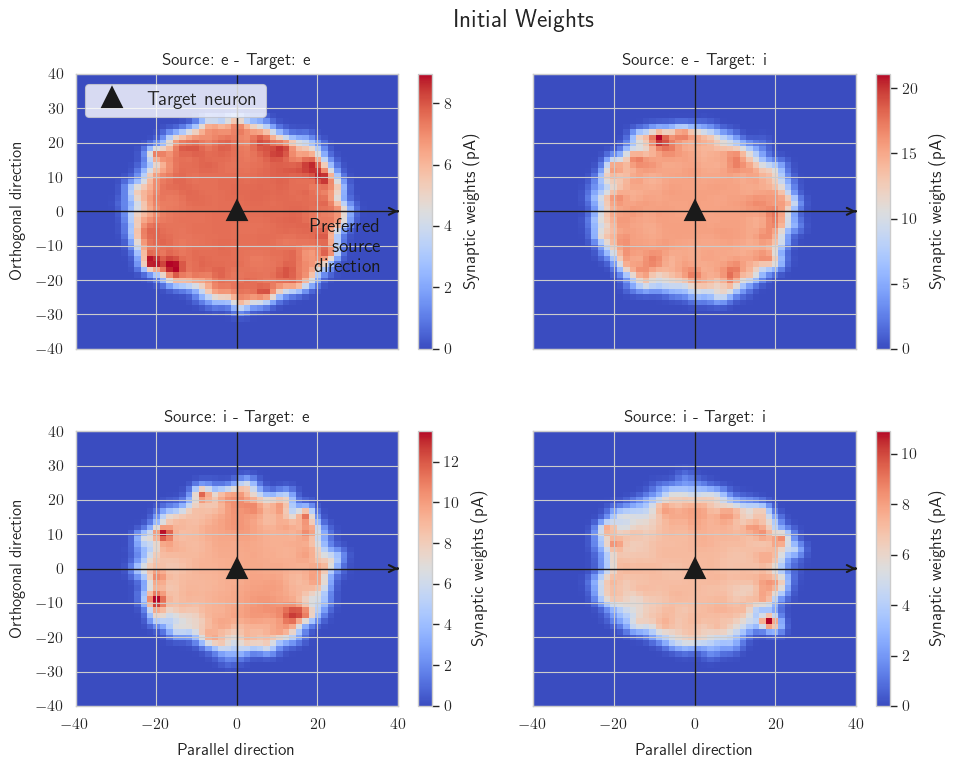

In [16]:
target_cell_types = ['e', 'i']
# target_cell_types = ['e5']
source_cell_types = ['e', 'i']
source_feature = 'DSI' # 'OSI'

fig = plt.figure(figsize=(6 * len(target_cell_types), 4 * len(source_cell_types)), constrained_layout=True)
if len(source_cell_types) * len(target_cell_types) == 4:
    top_title_space = 0.9
else:
    top_title_space = 0.8
gs = gridspec.GridSpec(len(source_cell_types), len(target_cell_types) + 1, width_ratios=[1, 1, 0.035], 
                        wspace=0.2, hspace=0.3, top=top_title_space)
# # Define limits of the histograms
# global_min = 0
# global_max = 20

plot_index = 0
for row, source_cell_type in enumerate(source_cell_types):
    # Select source and target IDs
    # source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core') & (df[source_feature] > 0.2)].astype(np.int32).values
    source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core')].astype(np.int32).values
    for col, target_cell_type in enumerate(target_cell_types):
        target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') ].astype(np.int32).values
        # target_tf_ids = df.index[(df['pop_name'].str.contains(target_cell_type)) & (df['region'] == 'core') ].astype(np.int32).values
        # Create sets for fast lookup
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Mask voltage_scale_node_ids first
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_value_masked = np.abs(model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids)
        final_value_masked = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)
        # Calculate tuning angle differences
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
        # Calculate differences in coordinates
        source_azimuth = df.loc[source_indices, 'azimuth'].values
        target_azimuth = df.loc[target_indices, 'azimuth'].values
        source_elevation = df.loc[source_indices, 'elevation'].values
        target_elevation = df.loc[target_indices, 'elevation'].values
         # source position in the target centered coordinate system
        diff_azimuth = source_azimuth - target_azimuth
        diff_elevation = source_elevation - target_elevation
        # # rotate to the axis of target neuron tuning angle
        source_tuning_angle_rad = np.radians(source_tuning_angles)
        cos_angles = np.cos(source_tuning_angle_rad)
        sin_angles = np.sin(source_tuning_angle_rad)
        # Rotate the sources coordinates according to the target neuron preferred direction
        diff_x_rot = diff_azimuth * cos_angles + diff_elevation * sin_angles
        diff_z_rot = diff_elevation * cos_angles - diff_azimuth * sin_angles

        bins = 50
        # area_dimensions = [[-80, 80], [-80, 80]]
        area_dimensions = [[-40, 40], [-40, 40]]
        # area_dimensions = [[-10, 10], [-10, 10]]

        hist, xedges_parallel, yedges_parallel = np.histogram2d(diff_x_rot, diff_z_rot, bins=bins, range=area_dimensions, weights=initial_value_masked)
        count_hist, _, _ = np.histogram2d(diff_x_rot, diff_z_rot, range=area_dimensions, bins=bins)
        hist = np.divide(hist, count_hist, out=np.zeros_like(hist), where=count_hist != 0)
        # Apply Gaussian filter to histograms
        sigma = 1
        hist_filtered = gaussian_filter(hist, sigma=sigma)
        ax = plt.subplot(gs[row, col])
        im_filtered = ax.imshow(hist_filtered.T, origin='lower', 
                                        extent=[xedges_parallel[0], xedges_parallel[-1], yedges_parallel[0], yedges_parallel[-1]], 
                                        aspect='auto', cmap='coolwarm') #, vmin=global_min, vmax=global_max)
        ax.axhline(0, color='k', lw=1)
        ax.axvline(0, color='k', lw=1)
        ax.annotate('', xy=(ax.get_xlim()[1], 0), xytext=(ax.get_xlim()[1]-0.1, 0),
                    arrowprops=dict(arrowstyle='->', color='k', lw=1.5))
        cbar = plt.colorbar(im_filtered, ax=ax)
        cbar.set_label('Synaptic weights (pA)')
        if col == 0:
            ax.set_ylabel('Orthogonal direction', fontsize=12)                        
        if col != 0:
            plt.setp(ax.get_yticklabels(), visible=False)   
        if row == len(source_cell_types) - 1:
            ax.set_xlabel('Parallel direction')
        else:
            plt.setp(ax.get_xticklabels(), visible=False)

        ax.plot(0, 0, 'k^', markersize=12, markeredgewidth=3, label='Target neuron')
        if plot_index == 0:
            # Position for the centered text at the right end of the x-axis
            x_right = x_right = ax.get_xlim()[1] - 0.05 * (ax.get_xlim()[1] - ax.get_xlim()[0])  # Move left by 10% of x-axis range
            y_position = -0.025 * (ax.get_ylim()[1] - ax.get_ylim()[0])
            ax.text(x_right, y_position,
                    'Preferred \n source \n direction', color='k', ha='right', va='top', fontsize=14, weight='bold')
            ax.legend(loc='upper left', fontsize = 14)

        ax.set_title(f'Source: {source_cell_type} - Target: {target_cell_type}')
        plot_index += 1

fig.suptitle(f'Initial Weights', fontsize=18)
plt.show()

/home/jgalvan/.conda/envs/predictive_coding_tf212/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


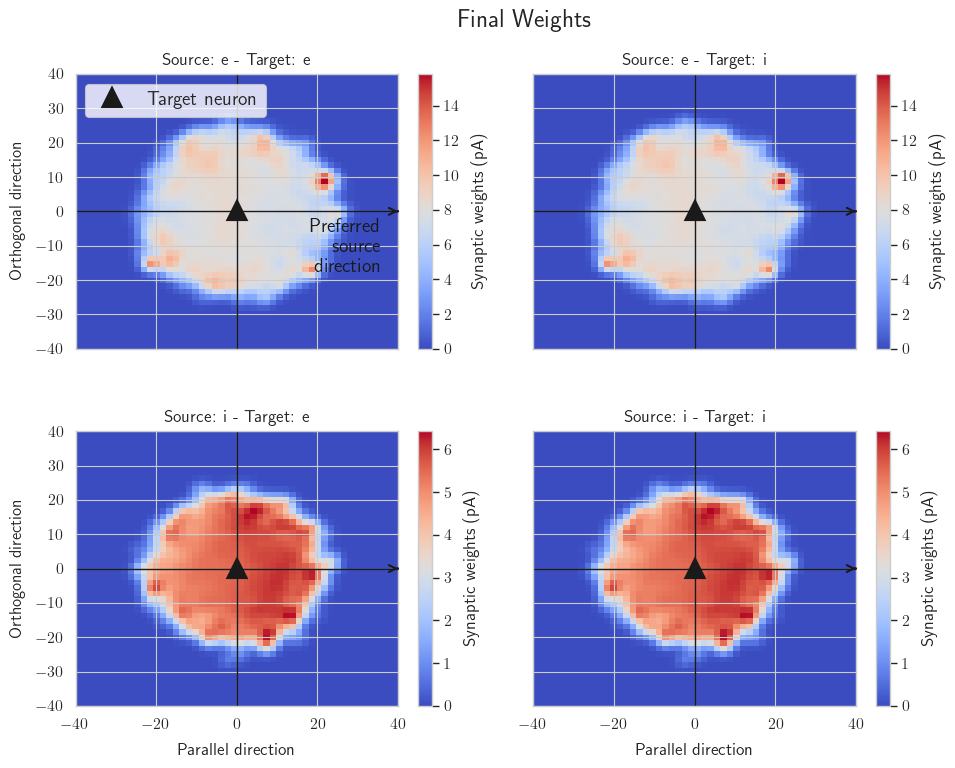

In [187]:
target_cell_types = ['e', 'i']
# target_cell_types = ['e5']
source_cell_types = ['e', 'i']
source_feature = 'DSI' # 'OSI'

fig = plt.figure(figsize=(6 * len(target_cell_types), 4 * len(source_cell_types)), constrained_layout=True)
if len(source_cell_types) * len(target_cell_types) == 4:
    top_title_space = 0.9
else:
    top_title_space = 0.8
gs = gridspec.GridSpec(len(source_cell_types), len(target_cell_types) + 1, width_ratios=[1, 1, 0.035], 
                        wspace=0.2, hspace=0.3, top=top_title_space)
# # Define limits of the histograms
# global_min = 0
# global_max = 20

plot_index = 0
for row, source_cell_type in enumerate(source_cell_types):
    # Select source and target IDs
    # source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core') & (df[source_feature] > 0.2)].astype(np.int32).values
    # source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
    source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core')].astype(np.int32).values
    for col, target_cell_type in enumerate(target_cell_types):
        # target_tf_ids = df.index[(df['ei'] == target_cell_type)].astype(np.int32).values
        # target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') ].astype(np.int32).values
        target_tf_ids = df.index[(df['cell_type'] == 'L2/3 Exc') & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
        # target_tf_ids = df.index[(df['pop_name'].str.contains(target_cell_type)) & (df['region'] == 'core') ].astype(np.int32).values
        # Create sets for fast lookup
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Mask voltage_scale_node_ids first
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_value_masked = np.abs(model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids)
        final_value_masked = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)
        # Calculate tuning angle differences
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
        # Calculate differences in coordinates
        source_azimuth = df.loc[source_indices, 'azimuth'].values
        target_azimuth = df.loc[target_indices, 'azimuth'].values
        source_elevation = df.loc[source_indices, 'elevation'].values
        target_elevation = df.loc[target_indices, 'elevation'].values
         # source position in the target centered coordinate system
        diff_azimuth = source_azimuth - target_azimuth
        diff_elevation = source_elevation - target_elevation
        # # rotate to the axis of target neuron tuning angle
        source_tuning_angle_rad = np.radians(source_tuning_angles)
        cos_angles = np.cos(source_tuning_angle_rad)
        sin_angles = np.sin(source_tuning_angle_rad)
        # Rotate the sources coordinates according to the target neuron preferred direction
        diff_x_rot = diff_azimuth * cos_angles + diff_elevation * sin_angles
        diff_z_rot = diff_elevation * cos_angles - diff_azimuth * sin_angles

        bins = 50
        # area_dimensions = [[-80, 80], [-80, 80]]
        area_dimensions = [[-40, 40], [-40, 40]]
        # area_dimensions = [[-20, 20], [-20, 20]]
        # area_dimensions = [[-10, 10], [-10, 10]]

        hist, xedges_parallel, yedges_parallel = np.histogram2d(diff_x_rot, diff_z_rot, bins=bins, range=area_dimensions, weights=final_value_masked)
        count_hist, _, _ = np.histogram2d(diff_x_rot, diff_z_rot, range=area_dimensions, bins=bins)
        hist = np.divide(hist, count_hist, out=np.zeros_like(hist), where=count_hist != 0)
        # Apply Gaussian filter to histograms
        sigma = 1
        hist_filtered = gaussian_filter(hist, sigma=sigma)
        ax = plt.subplot(gs[row, col])
        im_filtered = ax.imshow(hist_filtered.T, origin='lower', 
                                        extent=[xedges_parallel[0], xedges_parallel[-1], yedges_parallel[0], yedges_parallel[-1]], 
                                        aspect='auto', cmap='coolwarm') #, vmin=global_min, vmax=global_max)
        ax.axhline(0, color='k', lw=1)
        ax.axvline(0, color='k', lw=1)
        ax.annotate('', xy=(ax.get_xlim()[1], 0), xytext=(ax.get_xlim()[1]-0.1, 0),
                    arrowprops=dict(arrowstyle='->', color='k', lw=1.5))
        cbar = plt.colorbar(im_filtered, ax=ax)
        cbar.set_label('Synaptic weights (pA)')
        if col == 0:
            ax.set_ylabel('Orthogonal direction', fontsize=12)                        
        if col != 0:
            plt.setp(ax.get_yticklabels(), visible=False)   
        if row == len(source_cell_types) - 1:
            ax.set_xlabel('Parallel direction')
        else:
            plt.setp(ax.get_xticklabels(), visible=False)

        ax.plot(0, 0, 'k^', markersize=12, markeredgewidth=3, label='Target neuron')
        if plot_index == 0:
            # Position for the centered text at the right end of the x-axis
            x_right = x_right = ax.get_xlim()[1] - 0.05 * (ax.get_xlim()[1] - ax.get_xlim()[0])  # Move left by 10% of x-axis range
            y_position = -0.025 * (ax.get_ylim()[1] - ax.get_ylim()[0])
            ax.text(x_right, y_position,
                    'Preferred \n source \n direction', color='k', ha='right', va='top', fontsize=14, weight='bold')
            ax.legend(loc='upper left', fontsize = 14)

        ax.set_title(f'Source: {source_cell_type} - Target: {target_cell_type}')
        plot_index += 1

fig.suptitle(f'Final Weights', fontsize=18)
plt.show()

/home/jgalvan/.conda/envs/predictive_coding_tf212/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


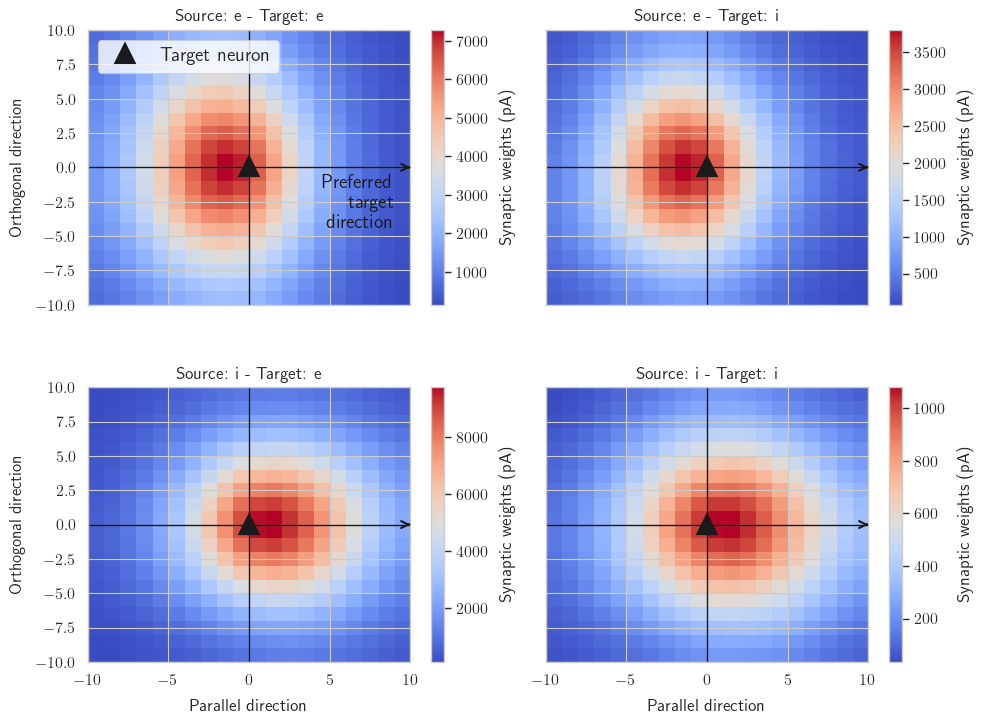

In [462]:
target_cell_types = ['e', 'i']
source_cell_types = ['e', 'i']
source_feature = 'DSI' # 'OSI'

fig = plt.figure(figsize=(6 * len(target_cell_types), 4 * len(source_cell_types)), constrained_layout=True)
if len(source_cell_types) * len(target_cell_types) == 4:
    top_title_space = 0.9
else:
    top_title_space = 0.8
gs = gridspec.GridSpec(len(source_cell_types), len(target_cell_types) + 1, width_ratios=[1, 1, 0.035], 
                        wspace=0.2, hspace=0.3, top=top_title_space)
# Define limits of the histograms
# global_min = 0
# global_max = 20

plot_index = 0
for row, source_cell_type in enumerate(source_cell_types):
    # Select source and target IDs
    # source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core') & (df[source_feature] > 0.2)].astype(np.int32).values
    source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core')].astype(np.int32).values
    for col, target_cell_type in enumerate(target_cell_types):
        target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') ].astype(np.int32).values
        # Create sets for fast lookup
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Mask voltage_scale_node_ids first
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_value_masked = np.abs(model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids)
        final_value_masked = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)
        # Calculate tuning angle differences
        # source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        # Calculate differences in coordinates
        source_azimuth = df.loc[source_indices, 'azimuth'].values
        target_azimuth = df.loc[target_indices, 'azimuth'].values
        source_elevation = df.loc[source_indices, 'elevation'].values
        target_elevation = df.loc[target_indices, 'elevation'].values

        # source position in the target centered coordinate system
        diff_azimuth = source_azimuth - target_azimuth
        diff_elevation = source_elevation - target_elevation
        # get the target neuron angle to define the rotation
        target_tuning_angle_rad = np.radians(target_tuning_angles)
        cos_angles = np.cos(target_tuning_angle_rad)
        sin_angles = np.sin(target_tuning_angle_rad)
        # Rotate the sources coordinates according to the target neuron preferred direction
        diff_x_rot = diff_azimuth * cos_angles + diff_elevation * sin_angles
        diff_z_rot = diff_elevation * cos_angles - diff_azimuth * sin_angles

        bins = 20
        # data_2d = np.column_stack((diff_azimuth_rot, diff_elevation_rot))
        # bins_x, bins_y = utils.freedman_diaconis_bin_sizes(data_2d, returnas="bins")
        # area_dimensions = [[-40, 40], [-40, 40]]
        area_dimensions = [[-10, 10], [-10, 10]]

        hist, xedges_parallel, yedges_parallel = np.histogram2d(diff_x_rot, diff_z_rot, bins=bins, range=area_dimensions, weights=final_value_masked)
        count_hist, _, _ = np.histogram2d(diff_x_rot, diff_z_rot, range=area_dimensions, bins=bins)
        # hist, xedges_parallel, yedges_parallel = np.histogram2d(diff_azimuth_rot, diff_elevation_rot, bins=[bins_x, bins_y], range=area_dimensions, weights=final_value_masked)
        # count_hist, _, _ = np.histogram2d(diff_azimuth_rot, diff_elevation_rot, range=area_dimensions, bins=[bins_x, bins_y])

        # hist = np.divide(hist, count_hist, out=np.zeros_like(hist), where=count_hist != 0)
        # Apply Gaussian filter to histograms
        hist = count_hist.copy()
        sigma = 1
        hist_filtered = gaussian_filter(hist, sigma=sigma)
        ax = plt.subplot(gs[row, col])
        im_filtered = ax.imshow(hist_filtered.T, origin='lower', 
                                        extent=[xedges_parallel[0], xedges_parallel[-1], yedges_parallel[0], yedges_parallel[-1]], 
                                        aspect='auto', cmap='coolwarm') #, vmin=7, vmax=11
        ax.axhline(0, color='k', lw=1)
        ax.axvline(0, color='k', lw=1)
        ax.annotate('', xy=(ax.get_xlim()[1], 0), xytext=(ax.get_xlim()[1]-0.1, 0),
                    arrowprops=dict(arrowstyle='->', color='k', lw=1.5))
        cbar = plt.colorbar(im_filtered, ax=ax)
        cbar.set_label('Synaptic weights (pA)')
        if col == 0:
            ax.set_ylabel('Orthogonal direction', fontsize=12)                        
        if col != 0:
            plt.setp(ax.get_yticklabels(), visible=False)   
        if row == len(source_cell_types) - 1:
            ax.set_xlabel('Parallel direction')
        else:
            plt.setp(ax.get_xticklabels(), visible=False)

        ax.plot(0, 0, 'k^', markersize=12, markeredgewidth=3, label='Target neuron')
        if plot_index == 0:
            # Position for the centered text at the right end of the x-axis
            x_right = x_right = ax.get_xlim()[1] - 0.05 * (ax.get_xlim()[1] - ax.get_xlim()[0])  # Move left by 10% of x-axis range
            y_position = -0.025 * (ax.get_ylim()[1] - ax.get_ylim()[0])
            ax.text(x_right, y_position,
                    'Preferred \n target \n direction', color='k', ha='right', va='top', fontsize=14, weight='bold')
            ax.legend(loc='upper left', fontsize = 14)

        ax.set_title(f'Source: {source_cell_type} - Target: {target_cell_type}')
        plot_index += 1

# fig.suptitle(f'Source Area: {source_area}, Target Area: {target_area}', fontsize=18)
plt.show()

11428
1176995 1176995


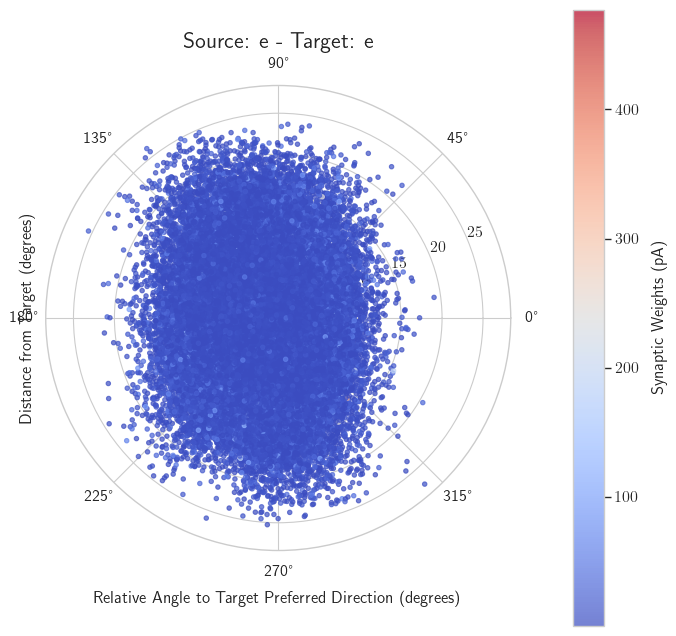

In [476]:
### DATA PREPARATION
cell_types = ['e', 'i']
source_cell_type = 'e'
target_cell_type = 'e'

# Select source and target IDs
# source_tf_ids = df.index[df['ei'] == source_cell_type].astype(np.int32).values
source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core')].astype(np.int32).values
target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
# target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core')].astype(np.int32).values

# source_tf_ids = df.index[(df['cell_type'] == 'L4 Exc') & (df['region'] == 'core')].astype(np.int32).values
# target_tf_ids = df.index[(df['cell_type'] == 'L6 Exc') & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
print(len(target_tf_ids))
# v1_df.dropna(subset=['p_value_OSI_corrected'], inplace=True)
# v1_df = v1_df[v1_df['p_value_OSI_corrected'] < 0.05].copy()
# Create sets for fast lookup
mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
selected_indices = indices[mask]
target_indices = selected_indices[:, 0]
source_indices = selected_indices[:, 1]
print(len(source_indices), len(target_indices))
# Mask voltage_scale_node_ids first
voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
initial_value_masked = np.abs(model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids)
final_value_masked = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)
# Calculate tuning angle differences
target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
# Calculate differences in coordinates
source_azimuth = df.loc[source_indices, 'azimuth'].values
target_azimuth = df.loc[target_indices, 'azimuth'].values
source_elevation = df.loc[source_indices, 'elevation'].values
target_elevation = df.loc[target_indices, 'elevation'].values
# source position in the target centered coordinate system
diff_azimuth = source_azimuth - target_azimuth
diff_elevation = source_elevation - target_elevation
# get the target neuron angle to define the rotation
target_tuning_angle_rad = np.radians(target_tuning_angles)
cos_angles = np.cos(target_tuning_angle_rad)
sin_angles = np.sin(target_tuning_angle_rad)
# Rotate the sources coordinates according to the target neuron preferred direction
diff_x_rot = diff_azimuth * cos_angles + diff_elevation * sin_angles
diff_z_rot = diff_elevation * cos_angles - diff_azimuth * sin_angles


# # Convert to polar coordinates relative to target's preferred direction
# # Calculate distance from target
# distances = np.sqrt(diff_azimuth**2 + diff_elevation**2)
# # Calculate angle relative to target's preferred direction
# # Angle of source relative to target in visual field
# source_angles = np.arctan2(diff_elevation, diff_azimuth) * 180 / np.pi
# # Adjust angles relative to target's preferred direction
# target_tuning_angle_deg = target_tuning_angles
# relative_angles = source_angles - target_tuning_angle_deg

# # scatter plot in polar coordinates
# plt.figure(figsize=(8, 8))
# ax = plt.subplot(111, projection='polar')
# # Convert angles to radians for polar plot
# relative_angles_rad = np.radians(relative_angles)
# # Scatter plot with color based on final values
# sc = ax.scatter(relative_angles_rad[:100000], distances[:100000], c=final_value_masked[:100000], cmap='coolwarm', s=10, alpha=0.7)
# ax.set_title(f'Source: {source_cell_type} - Target: {target_cell_type}', fontsize=16)
# ax.set_xlabel('Relative Angle to Target Preferred Direction (degrees)', fontsize=12)
# ax.set_ylabel('Distance from Target (degrees)', fontsize=12)
# cbar = plt.colorbar(sc, ax=ax, pad=0.1)
# cbar.set_label('Synaptic Weights (pA)', fontsize=12)
# plt.show()

In [467]:
relative_angles

array([ 158.41846652,   62.31054874, -179.05130582, ...,  -49.4658855 ,
       -120.5513042 , -168.66515765])

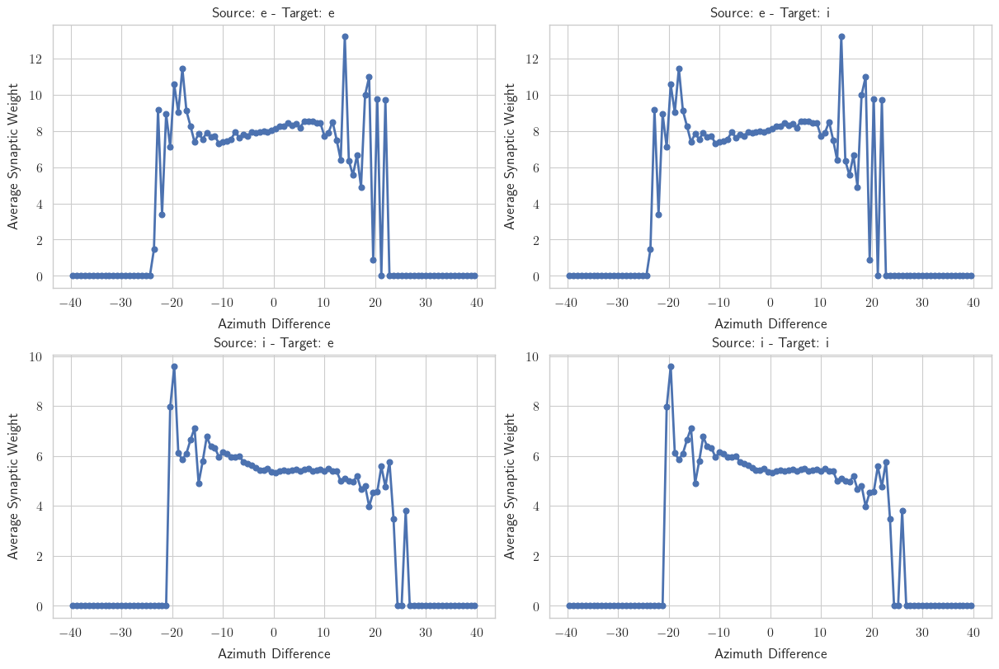

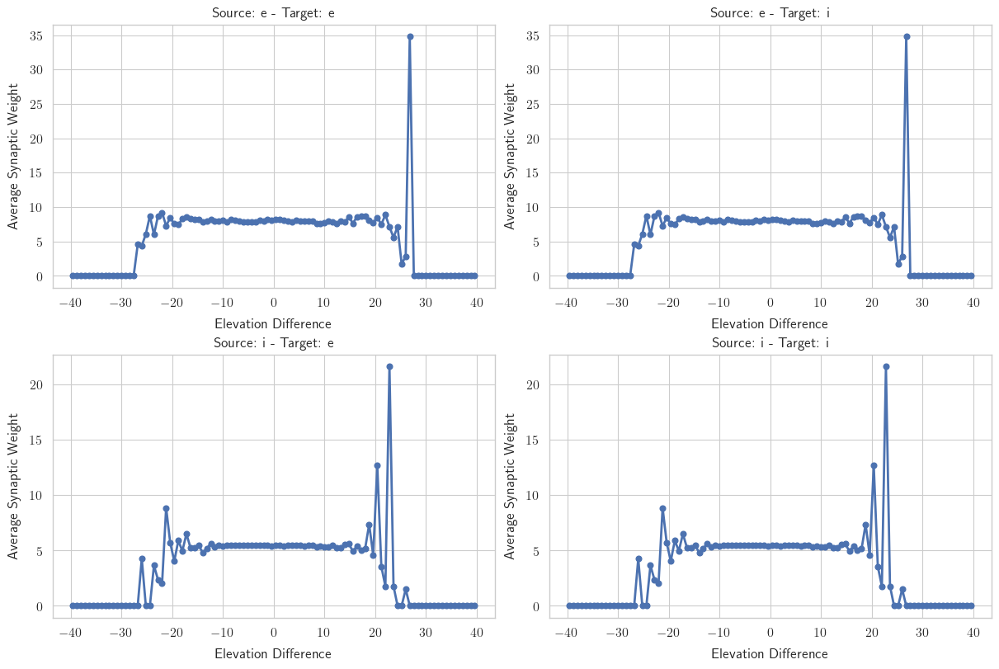

In [191]:
target_cell_types = ['e', 'i']
source_cell_types = ['e', 'i']
source_feature = 'DSI'  # 'OSI'

# Create figures for azimuth and elevation
fig_azimuth = plt.figure(figsize=(6 * len(target_cell_types), 4 * len(source_cell_types)), constrained_layout=True)
fig_elevation = plt.figure(figsize=(6 * len(target_cell_types), 4 * len(source_cell_types)), constrained_layout=True)

# Create gridspecs
gs_azimuth = gridspec.GridSpec(len(source_cell_types), len(target_cell_types), figure=fig_azimuth)
gs_elevation = gridspec.GridSpec(len(source_cell_types), len(target_cell_types), figure=fig_elevation)

# Define bins and area dimensions
bins = 100
area_dimensions = [[-40, 40], [-40, 40]]  # Adjust as needed

for row, source_cell_type in enumerate(source_cell_types):
    # Select source IDs
    # source_tf_ids = df.index[
    #     (df['ei'] == source_cell_type) & (df['region'] == 'core') & (df[source_feature] > 0.2)
    # ].astype(np.int32).values
    source_tf_ids = df.index[
        (df['ei'] == source_cell_type) & (df['region'] == 'core')
    ].astype(np.int32).values
    for col, target_cell_type in enumerate(target_cell_types):
        # Select target IDs
        # target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
        target_tf_ids = df.index[(df['cell_type'] == 'L2/3 Exc') & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values


        # Create masks and select indices
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]

        # Get synaptic weights
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        final_value_masked = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)

        # Calculate differences in coordinates
        # source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        source_azimuth = df.loc[source_indices, 'azimuth'].values
        target_azimuth = df.loc[target_indices, 'azimuth'].values
        source_elevation = df.loc[source_indices, 'elevation'].values
        target_elevation = df.loc[target_indices, 'elevation'].values

        # source position in the target centered coordinate system
        diff_azimuth = source_azimuth - target_azimuth
        diff_elevation = source_elevation - target_elevation
        # # rotate to the axis of target neuron tuning angle
        target_tuning_angle_rad = np.radians(target_tuning_angles)
        cos_angles = np.cos(target_tuning_angle_rad)
        sin_angles = np.sin(target_tuning_angle_rad)
        # Rotate the sources coordinates according to the target neuron preferred direction
        diff_x_rot = diff_azimuth * cos_angles + diff_elevation * sin_angles
        diff_z_rot = diff_elevation * cos_angles - diff_azimuth * sin_angles

        # Compute histograms for azimuth differences
        hist_x_sum, bin_edges_x = np.histogram(
            diff_x_rot, bins=bins, range=area_dimensions[0], weights=final_value_masked
        )
        hist_x_count, _ = np.histogram(diff_x_rot, bins=bins, range=area_dimensions[0])
        hist_x_avg = np.divide(
            hist_x_sum, hist_x_count, out=np.zeros_like(hist_x_sum), where=hist_x_count != 0
        )
        bin_centers_x = (bin_edges_x[:-1] + bin_edges_x[1:]) / 2

        # Compute histograms for elevation differences
        hist_z_sum, bin_edges_z = np.histogram(
            diff_z_rot, bins=bins, range=area_dimensions[1], weights=final_value_masked
        )
        hist_z_count, _ = np.histogram(diff_z_rot, bins=bins, range=area_dimensions[1])
        hist_z_avg = np.divide(
            hist_z_sum, hist_z_count, out=np.zeros_like(hist_z_sum), where=hist_z_count != 0
        )
        bin_centers_z = (bin_edges_z[:-1] + bin_edges_z[1:]) / 2

        # Plot azimuth marginal distribution
        ax_azimuth = fig_azimuth.add_subplot(gs_azimuth[row, col])
        ax_azimuth.plot(bin_centers_x, hist_x_avg, marker='o', linestyle='-')
        ax_azimuth.set_xlabel('Azimuth Difference')
        ax_azimuth.set_ylabel('Average Synaptic Weight')
        ax_azimuth.set_title(f'Source: {source_cell_type} - Target: {target_cell_type}')
        ax_azimuth.grid(True)

        # Plot elevation marginal distribution
        ax_elevation = fig_elevation.add_subplot(gs_elevation[row, col])
        ax_elevation.plot(bin_centers_z, hist_z_avg, marker='o', linestyle='-')
        ax_elevation.set_xlabel('Elevation Difference')
        ax_elevation.set_ylabel('Average Synaptic Weight')
        ax_elevation.set_title(f'Source: {source_cell_type} - Target: {target_cell_type}')
        ax_elevation.grid(True)

plt.show()


## SYNAPSES SCATTERING (CONNECTIONS AND WEIGHTS) IN AZIMUTH AND ELEVATION

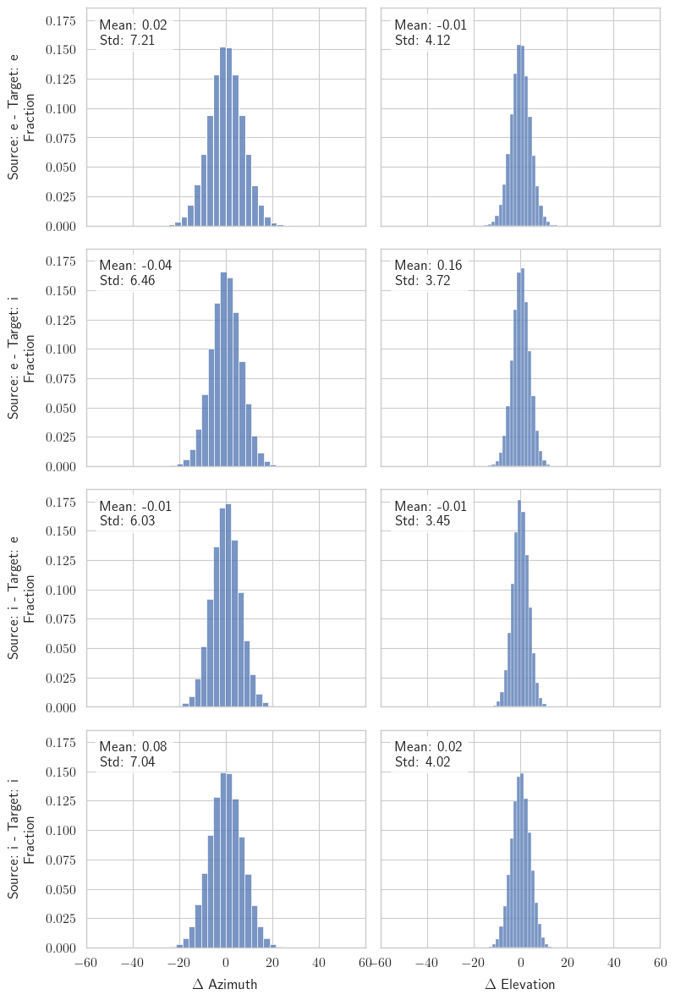

In [136]:
target_cell_types = ['e', 'i']
source_cell_types = ['e', 'i']

fig, axs = plt.subplots(len(source_cell_types) * len(target_cell_types), 2, figsize=(8, 6*len(source_cell_types)), sharex=True, sharey=True)
# axs = axs.flatten()
plot_index = 0
for row, source_cell_type in enumerate(source_cell_types):
    for col, target_cell_type in enumerate(target_cell_types):
        source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core')].astype(np.int32).values
        target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core')].astype(np.int32).values
        # Create sets for fast lookup
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Calculate differences in coordinates
        source_azimuth = df.loc[source_indices, 'azimuth'].values
        target_azimuth = df.loc[target_indices, 'azimuth'].values
        source_elevation = df.loc[source_indices, 'elevation'].values
        target_elevation = df.loc[target_indices, 'elevation'].values
        diff_x = source_azimuth - target_azimuth
        diff_z = source_elevation - target_elevation
        # Calculate statistics
        mean_diff_x = np.mean(diff_x)
        std_diff_x = np.std(diff_x)
        mean_diff_z = np.mean(diff_z)
        std_diff_z = np.std(diff_z)
        # Plot the distributions of diff x and diff z
        sns.histplot(diff_x, stat='proportion', bins=20, ax=axs[plot_index, 0])
        axs[plot_index, 0].set_xlim(-60, 60)
        axs[plot_index, 0].set_xlabel(r'$\Delta$ Azimuth')
        axs[plot_index, 0].set_ylabel(f'Source: {source_cell_type} - Target: {target_cell_type}\n Fraction')
        axs[plot_index, 0].text(0.05, 0.95, f'Mean: {mean_diff_x:.2f}\nStd: {std_diff_x:.2f}', transform=axs[plot_index, 0].transAxes, 
                                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        sns.histplot(diff_z, stat='proportion', bins=20, ax=axs[plot_index, 1])
        axs[plot_index, 1].set_xlim(-60, 60)
        axs[plot_index, 1].set_xlabel(r'$\Delta$ Elevation')
        axs[plot_index, 1].set_ylabel('Fraction')
        axs[plot_index, 1].text(0.05, 0.95, f'Mean: {mean_diff_z:.2f}\nStd: {std_diff_z:.2f}', transform=axs[plot_index, 1].transAxes, 
                                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        plot_index += 1

# fig.suptitle(f'Source Area: {source_area}, Target Area: {target_area}', fontsize=18)
plt.tight_layout()

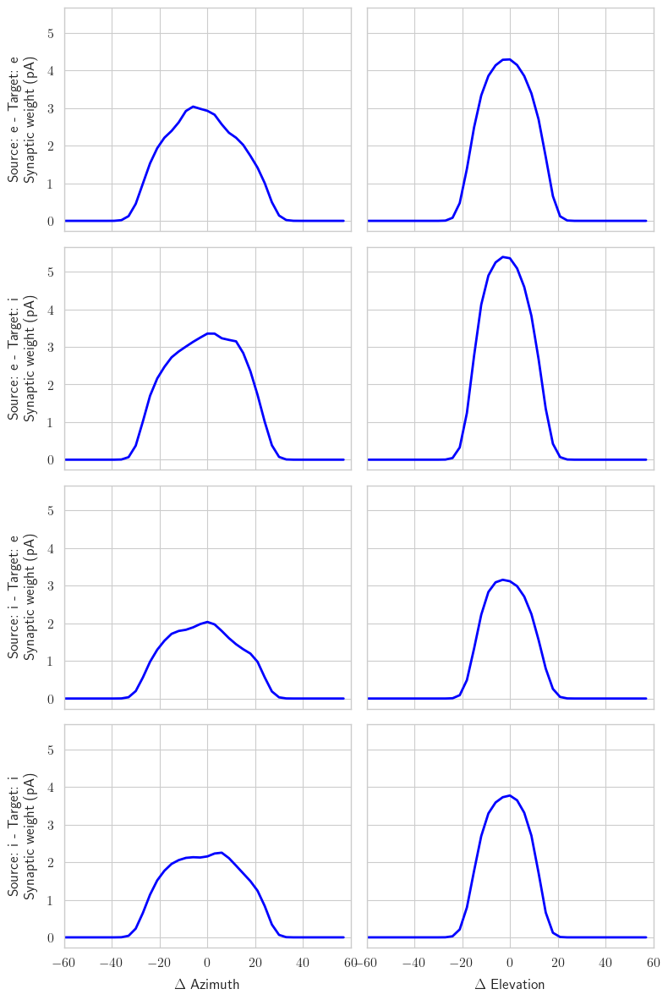

In [137]:
cell_types = ['e', 'i']
source_cell_types = ['e', 'i']

fig, axs = plt.subplots(len(source_cell_types) * len(cell_types), 2, figsize=(8, 6*len(source_cell_types)), sharex=True, sharey=True)
plot_index = 0
for row, source_cell_type in enumerate(source_cell_types):
    source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core')].astype(np.int32).values
    for col, target_cell_type in enumerate(cell_types):
        target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') ].astype(np.int32).values
        # Create sets for fast lookup
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Mask voltage_scale_node_ids first
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_value_masked = np.abs(model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids)
        final_value_masked = np.abs(model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids)
        # # Calculate tuning angle differences
        # source_tuning_angles = source_df.loc[source_indices, 'preferred_angle'].values
        # target_tuning_angles = target_df.loc[target_indices, 'preferred_angle'].values
        # tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        # tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
        # Calculate differences in coordinates
        source_azimuth = df.loc[source_indices, 'azimuth'].values
        target_azimuth = df.loc[target_indices, 'azimuth'].values
        source_elevation = df.loc[source_indices, 'elevation'].values
        target_elevation = df.loc[target_indices, 'elevation'].values
        diff_x = source_azimuth - target_azimuth
        diff_z = source_elevation - target_elevation
        # target_tuning_angle_rad = np.radians(target_tuning_angles[selected_indices[:, 0]])
        # diff_x_rot = diff_x * np.cos(target_tuning_angle_rad+np.pi) + diff_z * np.sin(target_tuning_angle_rad+np.pi)
        # diff_z_rot = diff_z * np.cos(target_tuning_angle_rad+np.pi) - diff_x * np.sin(target_tuning_angle_rad+np.pi)
        bins = 40  
        area_dimensions = [[-60, 60], [-60, 60]]
        hist, xedges_final, yedges_final = np.histogram2d(diff_z, diff_x, bins=bins, range=area_dimensions, weights=final_value_masked)
        count_hist, _, _ = np.histogram2d(diff_z, diff_x, range=area_dimensions, bins=bins)
        hist = np.divide(hist, count_hist, out=np.zeros_like(hist), where=count_hist != 0)
        # Apply Gaussian filter to histograms
        sigma = 1  
        hist_filtered = gaussian_filter(hist, sigma=sigma)
        # Calculate Marginal Distributions
        marginal_final_x = np.mean(hist_filtered, axis=0)
        marginal_final_z = np.mean(hist_filtered, axis=1)
        # Plot the distribution of marginal_final_x and marginal_final_z 
        axs[plot_index, 0].plot(xedges_final[:-1], marginal_final_x, color='blue')
        axs[plot_index, 0].set_xlim(-60, 60)
        axs[plot_index, 0].set_ylabel(f'Source: {source_cell_type} - Target: {target_cell_type}\n Synaptic weight (pA)')
        axs[plot_index, 1].plot(yedges_final[:-1], marginal_final_z, color='blue')
        axs[plot_index, 1].set_xlim(-60, 60)
        plot_index += 1

axs[plot_index-1, 0].set_xlabel(r'$\Delta$ Azimuth')
axs[plot_index-1, 1].set_xlabel(r'$\Delta$ Elevation')
# fig.suptitle(f'Source Area: {source_area}, Target Area: {target_area}', fontsize=18)
plt.tight_layout()
plt.show()

## OSI/DSI ANALYSIS AND LIKE-LIKE RULES

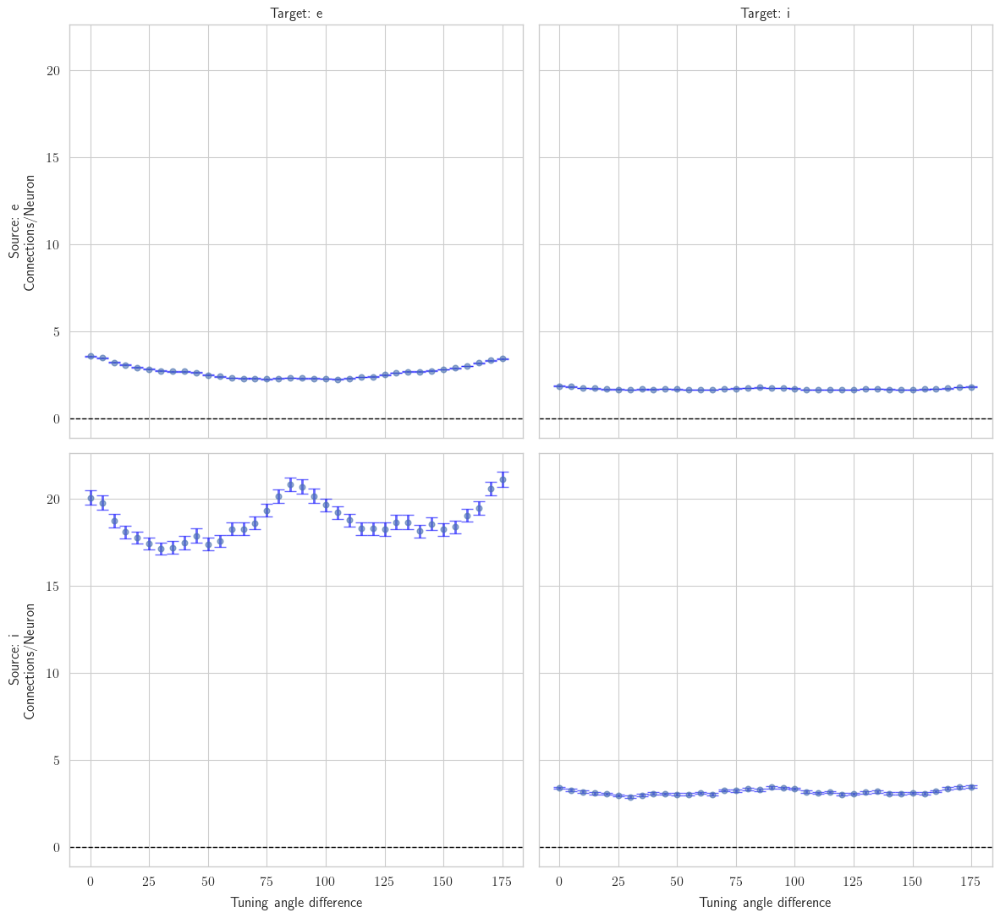

In [605]:
# %%timeit
areas = ['v1', 'lm']
target_cell_types = ['e', 'i']
source_cell_types = ['e', 'i']

fig, axs = plt.subplots(len(source_cell_types), len(target_cell_types), figsize=(12, 6*len(source_cell_types)), sharex=True, sharey=True)
axs = axs.flatten()
plot_index = 0
for row, source_cell_type in enumerate(source_cell_types):
    source_tf_ids = df.index[(df['ei'] == source_cell_type)].astype(np.int32).values
    for col, target_cell_type in enumerate(target_cell_types):
        target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') ].astype(np.int32).values
        # Create sets for fast lookup
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Calculate tuning angle differences
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)

        bins = np.arange(0, 181, 5)
        bin_counts = np.zeros(len(bins) - 1)
        bin_errors = np.zeros(len(bins) - 1)
        bin_indices = np.digitize(tuning_angle_diff, bins) - 1
        # Loop over the bins to calculate mean connections per neuron and their errors
        for i in range(len(bins) - 1):
            # Get the connections that fall into the current bin
            connections_in_bin = selected_indices[bin_indices == i]
            
            if connections_in_bin.size > 0:
                # Unique source neurons and counts in the current bin
                unique_source_neurons, neuron_indices, counts = np.unique(connections_in_bin[:, 1], 
                                                                        return_inverse=True, return_counts=True)
                num_neurons_in_bin = unique_source_neurons.size
                
                if num_neurons_in_bin > 0:
                    # Calculate mean and error for the bin using NumPy operations
                    bin_counts[i] = np.mean(counts)
                    # Calculate the standard deviation and SEM for the bin
                    std_dev = np.std(counts, ddof=1)  # ddof=1 for sample standard deviation
                    bin_errors[i] = std_dev / np.sqrt(num_neurons_in_bin)
    
        # Plot the histogram
        axs[plot_index].errorbar(bins[:-1], bin_counts, yerr=bin_errors, fmt='o', ecolor='blue', capsize=5, label='Connections/Neuron', alpha=0.6)
        axs[plot_index].axhline(y=0, color='black', linestyle='--', linewidth=1)

        if row == 0:
            axs[plot_index].set_title(f'Target: {target_cell_type}', fontsize=12)
        if col == 0:
            axs[plot_index].set_ylabel(f'Source: {source_cell_type}\nConnections/Neuron', fontsize=12)
        if row == len(source_cell_types) - 1:
            axs[plot_index].set_xlabel(f'Tuning angle difference', fontsize=12)

        # axs[plot_index].grid(True)
        plot_index += 1

# fig.suptitle(f'Source Area: {source_area}, Target Area: {target_area}', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

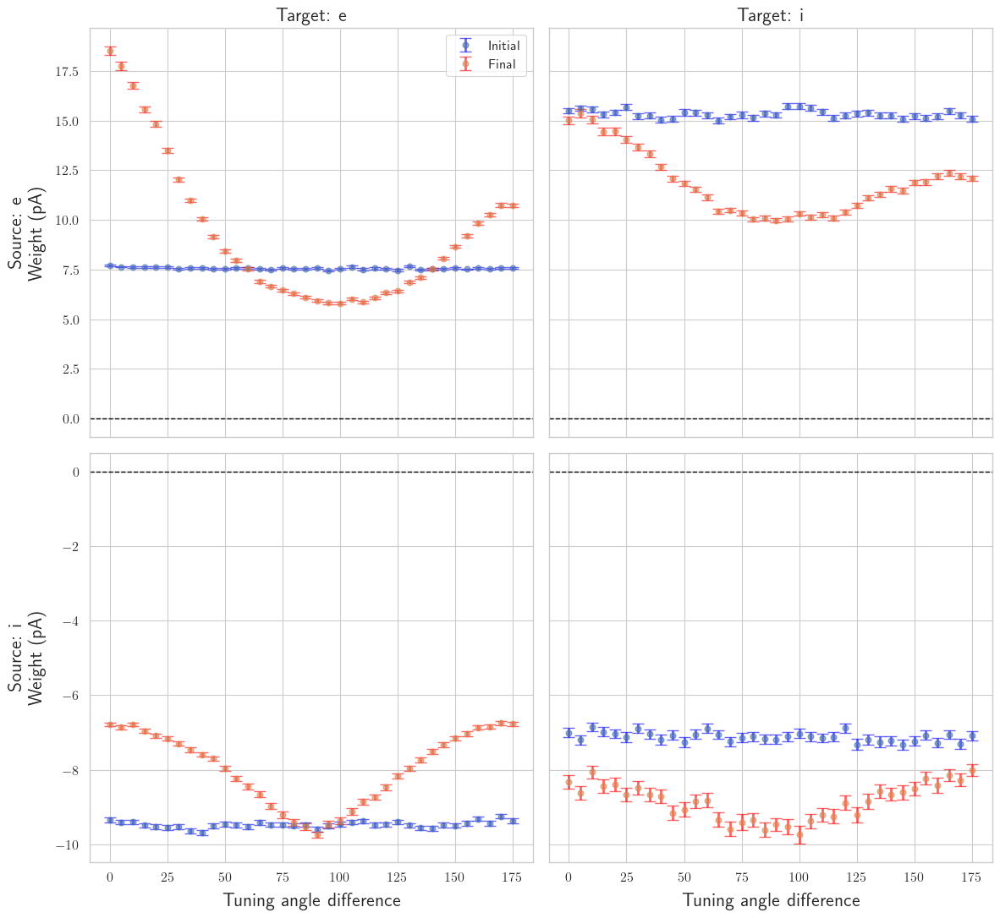

In [606]:
target_cell_types = ['e', 'i']
source_cell_types = ['e', 'i']

fig, axs = plt.subplots(len(source_cell_types), len(target_cell_types), figsize=(12, 6*len(source_cell_types)), sharex=True, sharey='row')
axs = axs.flatten()
plot_index = 0
for row, source_cell_type in enumerate(source_cell_types):
    source_tf_ids = df.index[(df['ei'] == source_cell_type) & (df['region'] == 'core')].astype(np.int32).values
    for col, target_cell_type in enumerate(target_cell_types):
        target_tf_ids = df.index[(df['ei'] == target_cell_type) & (df['region'] == 'core') ].astype(np.int32).values
        # Create sets for fast lookup
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Mask voltage_scale_node_ids first
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_value_masked = model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids
        final_value_masked = model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids
        # Calculate tuning angle differences
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)

        bins = np.arange(0, 181, 5)
        bin_indices = np.digitize(tuning_angle_diff, bins)
        bin_initial_values = np.zeros(len(bins)-1)
        bin_initial_errors = np.zeros(len(bins)-1)
        bin_final_values = np.zeros(len(bins)-1)
        bin_final_errors = np.zeros(len(bins)-1)
        for i in range(1, len(bins)):
            initial_values_in_bin = initial_value_masked[bin_indices == i]
            if initial_values_in_bin.size > 0:
                bin_initial_values[i-1] = np.mean(initial_values_in_bin)
                std_dev_initial = np.std(initial_values_in_bin, ddof=1)
                bin_initial_errors[i-1] = std_dev_initial / np.sqrt(initial_values_in_bin.size)

            final_values_in_bin = final_value_masked[bin_indices == i]
            if final_values_in_bin.size > 0:
                bin_final_values[i-1] = np.mean(final_values_in_bin)
                std_dev_final = np.std(final_values_in_bin, ddof=1)
                bin_final_errors[i-1] = std_dev_final / np.sqrt(final_values_in_bin.size)

        axs[plot_index].errorbar(bins[:-1], bin_initial_values, yerr=bin_initial_errors, fmt='o', ecolor='blue', capsize=5, label='Initial', alpha=0.6)
        axs[plot_index].errorbar(bins[:-1], bin_final_values, yerr=bin_final_errors, fmt='o', ecolor='red', capsize=5, label='Final', alpha=0.6)
        axs[plot_index].axhline(y=0, color='black', linestyle='--', linewidth=1)

        if row == 0:
            axs[plot_index].set_title(f'Target: {target_cell_type}', fontsize=16)
        if col == 0:
            axs[plot_index].set_ylabel(f'Source: {source_cell_type}\nWeight (pA)', fontsize=16)
        if row == len(source_cell_types) - 1:
            axs[plot_index].set_xlabel(r'Tuning angle difference', fontsize=16)
        if row == 0 and col == 0:
            axs[plot_index].legend()

        plot_index += 1

# fig.suptitle(f'Source Area: {source_area}, Target Area: {target_area}', fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


/tmp/ipykernel_308935/931102975.py:223: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


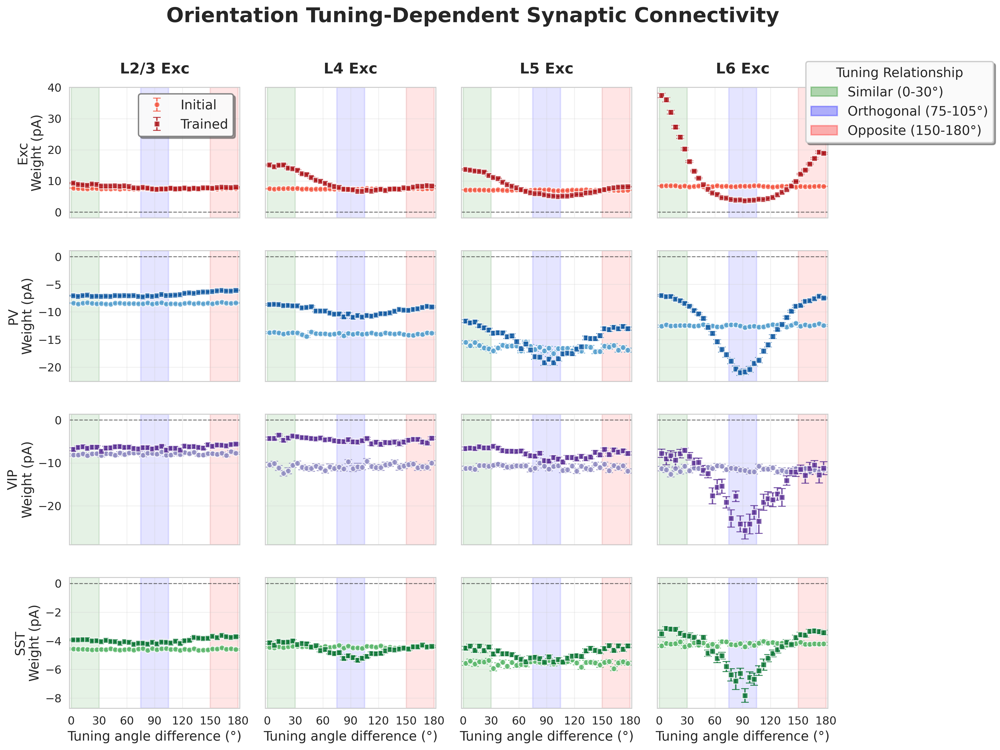

In [743]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.patches import Rectangle
import matplotlib.patches as mpatches

# Set publication-ready style with seaborn
sns.set_style("whitegrid", {
    "grid.linewidth": 0.8,
    "grid.alpha": 0.3,
    "axes.linewidth": 1.5,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
})

sns.set_context("paper", font_scale=1.4, rc={
    "lines.linewidth": 2.5,
    "patch.linewidth": 1.5,
    "axes.labelsize": 14,
    "axes.titlesize": 16,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,
    "figure.titlesize": 18
})

# Set color palette
colors = sns.color_palette("Set2", 8)
initial_color = colors[1]  # Green
final_color = colors[3]    # Red

# Configure matplotlib for publication quality
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'mathtext.fontset': 'dejavusans',
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.facecolor': 'white',
    'savefig.edgecolor': 'none',
    'text.usetex': False
})

# Define cell types for analysis
target_cell_types = ['L2/3 Exc', 'L4 Exc', 'L5 Exc', 'L6 Exc']
source_cell_types = ['Exc', 'PV', 'VIP', 'SST']

# Prepare data
df2 = df.copy()
# Convert L5 excitatory cell types to L5 Exc
df2.loc[df2['cell_type'] == 'L5 IT', 'cell_type'] = 'L5 Exc'
df2.loc[df2['cell_type'] == 'L5 NP', 'cell_type'] = 'L5 Exc'
df2.loc[df2['cell_type'] == 'L5 ET', 'cell_type'] = 'L5 Exc'

# Create the figure with proper sizing and spacing
fig, axs = plt.subplots(
    len(source_cell_types), len(target_cell_types), 
    figsize=(16, 12), 
    sharex=True, 
    sharey='row',
    gridspec_kw={'hspace': 0.25, 'wspace': 0.15}
)
axs = axs.flatten()

connection_colors = {
    'Exc': {'initial': sns.color_palette("Reds", 6)[3], 'final': sns.color_palette("Reds", 6)[5]},
    'PV': {'initial': sns.color_palette("Blues", 6)[3], 'final': sns.color_palette("Blues", 6)[5]},
    'VIP': {'initial': sns.color_palette("Purples", 6)[3], 'final': sns.color_palette("Purples", 6)[5]},
    'SST': {'initial': sns.color_palette("Greens", 6)[3], 'final': sns.color_palette("Greens", 6)[5]}
}

plot_index = 0
for row, source_cell_type in enumerate(source_cell_types):
    source_tf_ids = df2.index[(df2['cell_type'].str.contains(source_cell_type)) & 
                              (df2['region'] == 'core')].astype(np.int32).values
    
    for col, target_cell_type in enumerate(target_cell_types):
        ax = axs[plot_index]
        
        target_tf_ids = df2.index[(df2['cell_type'].str.contains(target_cell_type)) & 
                                  (df2['region'] == 'core')].astype(np.int32).values
        
        # Create mask for fast lookup
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        
        # Mask voltage_scale_node_ids first
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_value_masked = model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids
        final_value_masked = model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids
        
        # Calculate tuning angle differences
        source_tuning_angles = df2.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df2.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)

        # Bin the data
        bins = np.arange(0, 181, 5)
        bin_indices = np.digitize(tuning_angle_diff, bins)
        bin_initial_values = np.zeros(len(bins) - 1)
        bin_initial_errors = np.zeros(len(bins) - 1)
        bin_final_values = np.zeros(len(bins) - 1)
        bin_final_errors = np.zeros(len(bins) - 1)
        
        for i in range(1, len(bins)):
            initial_values_in_bin = initial_value_masked[bin_indices == i]
            if initial_values_in_bin.size > 0:
                bin_initial_values[i-1] = np.mean(initial_values_in_bin)
                std_dev_initial = np.std(initial_values_in_bin, ddof=1)
                bin_initial_errors[i-1] = std_dev_initial / np.sqrt(initial_values_in_bin.size)

            final_values_in_bin = final_value_masked[bin_indices == i]
            if final_values_in_bin.size > 0:
                bin_final_values[i-1] = np.mean(final_values_in_bin)
                std_dev_final = np.std(final_values_in_bin, ddof=1)
                bin_final_errors[i-1] = std_dev_final / np.sqrt(final_values_in_bin.size)

        # Plot with publication-ready styling
        bin_centers = bins[:-1] + 2.5  # Center the points in bins
        
        # Plot initial values
        ax.errorbar(
            bin_centers, bin_initial_values, yerr=bin_initial_errors,
            fmt='o', color=connection_colors[source_cell_type]['initial'],
            capsize=4, capthick=1.5, elinewidth=1.5, markersize=6,
            markeredgewidth=1, markeredgecolor='white',
            label='Initial' if plot_index == 0 else '',
            alpha=0.8, zorder=3
        )
        
        # Plot final values
        ax.errorbar(
            bin_centers, bin_final_values, yerr=bin_final_errors,
            fmt='s', color=connection_colors[source_cell_type]['final'],
            capsize=4, capthick=1.5, elinewidth=1.5, markersize=6,
            markeredgewidth=1, markeredgecolor='white',
            label='Trained' if plot_index == 0 else '',
            alpha=0.8, zorder=3
        )
        
        # Add zero reference line
        ax.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5, zorder=1)
        
        # Styling
        if row == 0:
            ax.set_title(f'{target_cell_type}', fontsize=16, fontweight='bold', pad=15)
        
        if col == 0:
            ax.set_ylabel(f'{source_cell_type}\nWeight (pA)', fontsize=14, fontweight='normal')
        
        if row == len(source_cell_types) - 1:
            ax.set_xlabel('Tuning angle difference (°)', fontsize=14, fontweight='normal')

        # Add legend only to first subplot
        if row == 0 and col == 0:
            legend = ax.legend(
                loc='upper right', 
                frameon=True, 
                fancybox=True, 
                shadow=True,
                fontsize=14,
                framealpha=0.95
            )
            legend.get_frame().set_facecolor('white')
            legend.get_frame().set_edgecolor('gray')
        
        # Set axis limits and ticks
        ax.set_xlim(-2, 182)
        ax.set_xticks(np.arange(0, 181, 30))
        # increase ticks size
        ax.tick_params(axis='both', which='major', labelsize=12, width=1.2)
        
        # Add subtle background shading for different angle ranges
        ax.axvspan(0, 30, alpha=0.1, color='green', zorder=0)  # Similar orientations
        ax.axvspan(75, 105, alpha=0.1, color='blue', zorder=0)  # Orthogonal orientations
        ax.axvspan(150, 180, alpha=0.1, color='red', zorder=0)  # Opposite orientations
        
        # Improve grid
        ax.grid(True, alpha=0.3, linewidth=0.8)
        ax.set_axisbelow(True)
        
        plot_index += 1

# Add overall title and subtitle
fig.suptitle(
    'Orientation Tuning-Dependent Synaptic Connectivity',
    fontsize=22, fontweight='bold', y=0.98
)

# # Add subtitle with more information
# fig.text(
#     0.5, 0.94, 
#     'Synaptic weights as a function of tuning angle differences between connected neurons',
#     ha='center', fontsize=12, style='italic', color='gray'
# )

# Add annotation for shaded regions (small legend)
legend_elements = [
    mpatches.Patch(color='green', alpha=0.3, label='Similar (0-30°)'),
    mpatches.Patch(color='blue', alpha=0.3, label='Orthogonal (75-105°)'),
    mpatches.Patch(color='red', alpha=0.3, label='Opposite (150-180°)')
]

fig.legend(
    handles=legend_elements,
    loc='upper right',
    bbox_to_anchor=(0.99, 0.92),
    fontsize=14,
    title='Tuning Relationship',
    title_fontsize=14,
    frameon=True,
    fancybox=True,
    shadow=True,
    framealpha=0.95
)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.88, right=0.83)

# Save the figure in high quality
# plt.savefig('tuning_angle_dependency_analysis.png', dpi=300, bbox_inches='tight', 
#             facecolor='white', edgecolor='none')
# plt.savefig('tuning_angle_dependency_analysis.pdf', bbox_inches='tight', 
#             facecolor='white', edgecolor='none')

plt.show()

In [608]:
import numba

@numba.njit
def compute_binned_means_numba(values, angles, bins):
    bin_means = np.empty(len(bins) - 1, dtype=np.float64)
    bin_means.fill(np.nan)

    for i in range(len(bins) - 1):
        bin_min = bins[i]
        bin_max = bins[i + 1]
        
        # Identify values within the bin
        bin_sum = 0.0
        bin_count = 0
        for j in range(len(angles)):
            if bin_min <= angles[j] < bin_max:
                bin_sum += values[j]
                bin_count += 1
                
        if bin_count > 0:
            bin_means[i] = bin_sum / bin_count
        else:
            bin_means[i] = np.nan

    return bin_means

@numba.njit
def permutation_test_raw_data_numba(initial_values, final_values, initial_angles, final_angles, 
                                    bins=np.arange(0, 181, 5), num_permutations=5000, random_seed=42):
    np.random.seed(random_seed)

    # Observed statistic
    initial_curve = compute_binned_means_numba(initial_values, initial_angles, bins)
    final_curve = compute_binned_means_numba(final_values, final_angles, bins)
    
    # Compute observed MSD (ignoring NaNs)
    valid_bins = ~np.isnan(initial_curve) & ~np.isnan(final_curve)
    if np.sum(valid_bins) == 0:
        return np.nan, np.full(num_permutations, np.nan), np.nan  # No valid data to compare

    # observed_msd = np.mean((final_curve[valid_bins] - initial_curve[valid_bins]) ** 2)
    observed_msd = np.mean(np.abs(final_curve[valid_bins] - initial_curve[valid_bins]))

     # Combine data into a single array
    n_initial = len(initial_values)
    n_final = len(final_values)
    combined_values = np.concatenate((initial_values, final_values))
    angles_diff = final_angles - initial_angles
    combined_angles = np.concatenate((angles_diff, angles_diff))  # Angles are duplicated, one for each condition
    combined_labels = np.zeros(n_initial + n_final, dtype=np.int32)
    combined_labels[n_initial:] = 1

    permuted_msds = np.empty(num_permutations)
    permuted_msds.fill(np.nan)

    for perm in range(num_permutations):
        # Permute condition labels only (angles remain fixed)
        permuted_labels = np.random.permutation(combined_labels)
        # Separate data according to permuted labels
        perm_initial_values = combined_values[permuted_labels == 0]
        perm_final_values = combined_values[permuted_labels == 1]
        perm_initial_angles = combined_angles[permuted_labels == 0]
        perm_final_angles = combined_angles[permuted_labels == 1]
        # Recompute aggregated curves
        perm_initial_curve = compute_binned_means_numba(perm_initial_values, perm_initial_angles, bins)
        perm_final_curve = compute_binned_means_numba(perm_final_values, perm_final_angles, bins)
        # Compute MSD statistic for this permutation (ignore NaNs)
        valid_perm_bins = ~np.isnan(perm_initial_curve) & ~np.isnan(perm_final_curve)
        if np.sum(valid_perm_bins) == 0:
            continue # skip this permutation if no valid data to compare
            
        # permuted_msd = np.mean((perm_final_curve[valid_perm_bins] - perm_initial_curve[valid_perm_bins]) ** 2)
        permuted_msd = np.mean(np.abs(perm_final_curve[valid_perm_bins] - perm_initial_curve[valid_perm_bins]))
        permuted_msds[perm] = permuted_msd

    # Remove any NaNs from permuted MSDs before computing p-value
    permuted_msds = permuted_msds[~np.isnan(permuted_msds)]
    if permuted_msds.size == 0:
        return observed_msd, permuted_msds, np.nan  # No valid permutations
    
    p_value = (np.sum(permuted_msds >= observed_msd) + 1) / (len(permuted_msds) + 1)

    return observed_msd, permuted_msds, p_value

def permutation_test_raw_data_numba_plots(initial_values, final_values, initial_angles, final_angles, 
                                    bins=np.arange(0, 181, 5), num_permutations=5000, random_seed=42):
    np.random.seed(random_seed)

    # Observed statistic
    initial_curve = compute_binned_means_numba(initial_values, initial_angles, bins)
    final_curve = compute_binned_means_numba(final_values, final_angles, bins)
    
    # Compute observed MSD (ignoring NaNs)
    valid_bins = ~np.isnan(initial_curve) & ~np.isnan(final_curve)
    if np.sum(valid_bins) == 0:
        return np.nan, np.full(num_permutations, np.nan), np.nan  # No valid data to compare

    observed_msd = np.mean(np.abs((final_curve[valid_bins] - initial_curve[valid_bins])))

     # Combine data into a single array
    n_initial = len(initial_values)
    n_final = len(final_values)
    combined_values = np.concatenate((initial_values, final_values))
    angles_diff = final_angles - initial_angles
    combined_angles = np.concatenate((angles_diff, angles_diff))  # Angles are duplicated, one for each condition
    combined_labels = np.zeros(n_initial + n_final, dtype=np.int32)
    combined_labels[n_initial:] = 1

    permuted_msds = np.empty(num_permutations)
    permuted_msds.fill(np.nan)

    for perm in range(num_permutations):
        # Permute condition labels only (angles remain fixed)
        permuted_labels = np.random.permutation(combined_labels)
        # Separate data according to permuted labels
        perm_initial_values = combined_values[permuted_labels == 0]
        perm_final_values = combined_values[permuted_labels == 1]
        perm_initial_angles = combined_angles[permuted_labels == 0]
        perm_final_angles = combined_angles[permuted_labels == 1]
        # Recompute aggregated curves
        perm_initial_curve = compute_binned_means_numba(perm_initial_values, perm_initial_angles, bins)
        perm_final_curve = compute_binned_means_numba(perm_final_values, perm_final_angles, bins)
        # Compute MSD statistic for this permutation (ignore NaNs)
        valid_perm_bins = ~np.isnan(perm_initial_curve) & ~np.isnan(perm_final_curve)
        if np.sum(valid_perm_bins) == 0:
            continue # skip this permutation if no valid data to compare
            
        permuted_msd = np.mean(np.abs(perm_final_curve[valid_perm_bins] - perm_initial_curve[valid_perm_bins]))
        permuted_msds[perm] = permuted_msd

        if permuted_msd  >= observed_msd:
            fig, ax = plt.subplots(figsize=(10, 6))
            plt.plot(bins[:-1], perm_initial_curve, '.', color='blue', alpha=0.5)
            plt.plot(bins[:-1], perm_final_curve, '.', color='red', alpha=0.5)
            # plt.axhline(y=0, color='black', linestyle='--') 
            plt.xlabel('Angle (degrees)')
            plt.ylabel('Weight (g)')
            plt.suptitle(f'Permutation: {perm} - Observed MSD: {observed_msd:.2f} - Permuted MSD: {permuted_msd:.2f}')
            plt.show()

    # Remove any NaNs from permuted MSDs before computing p-value
    permuted_msds = permuted_msds[~np.isnan(permuted_msds)]
    if permuted_msds.size == 0:
        return observed_msd, permuted_msds, np.nan  # No valid permutations
    
    p_value = (np.sum(permuted_msds >= observed_msd) + 1) / (len(permuted_msds) + 1)

    return observed_msd, permuted_msds, p_value

def stability_analysis(initial_values, final_values, source_angles, final_angles, bins, sample_sizes, repetitions=30):
    results = {}
    n_initial = len(initial_values)
    n_final = len(final_values)

    for size in sample_sizes:
        if size > min(n_initial, n_final):
            continue  # skip if sample size too large

        p_values = []
        for _ in range(repetitions):
            idx_initial = np.random.choice(n_initial, size=size, replace=False)
            # idx_final = np.random.choice(n_final, size=size, replace=False)

            obs_stat, _, p_val = permutation_test_raw_data_numba(
                initial_values[idx_initial],
                final_values[idx_initial],
                source_angles[idx_initial],  # assuming angles match length of initial_values/final_values
                final_angles[idx_initial],
                bins,
                num_permutations=1000
            )
            if not np.isnan(p_val):
                p_values.append(p_val)

        # Store mean and std of p-values at this size
        results[size] = (np.mean(p_values), np.std(p_values))
        print(size, p_values)

    # Plot explicitly the stability
    sizes = list(results.keys())
    means = [results[s][0] for s in sizes]
    stds = [results[s][1] for s in sizes]

    plt.errorbar(sizes, means, yerr=stds, fmt='-o')
    plt.xlabel('Number of synapses per condition')
    plt.ylabel('Mean empirical p-value ± STD')
    plt.title('Permutation Test Stability Analysis')
    plt.grid(True)
    plt.show()

    return results

from sklearn.feature_selection import mutual_info_regression
from joblib import Parallel, delayed

def mutual_info_independence_test(x, y, n_permutations=1000, n_jobs=-1, random_state=0):
    rng = np.random.default_rng(random_state)
    x_reshaped = x.reshape(-1, 1)
    
    # Compute observed mutual information once
    observed_mi = mutual_info_regression(x_reshaped, y, random_state=random_state)[0]

    # Use joblib for fast parallel permutation
    def compute_permuted_mi(seed):
        local_rng = np.random.default_rng(seed)
        y_perm = local_rng.permutation(y)
        return mutual_info_regression(x_reshaped, y_perm, random_state=seed)[0]

    seeds = rng.integers(0, 2**32 - 1, size=n_permutations)
    permuted_mis = Parallel(n_jobs=n_jobs)(delayed(compute_permuted_mi)(s) for s in seeds)

    # Compute p-value
    p_value = np.mean(np.array(permuted_mis) >= observed_mi)

    return observed_mi, permuted_mis, p_value


Observed MSD: 0.0129
Empirical p-value: 0.0290
Results p-value adjusted: 0.1106
Number of connections: 11430


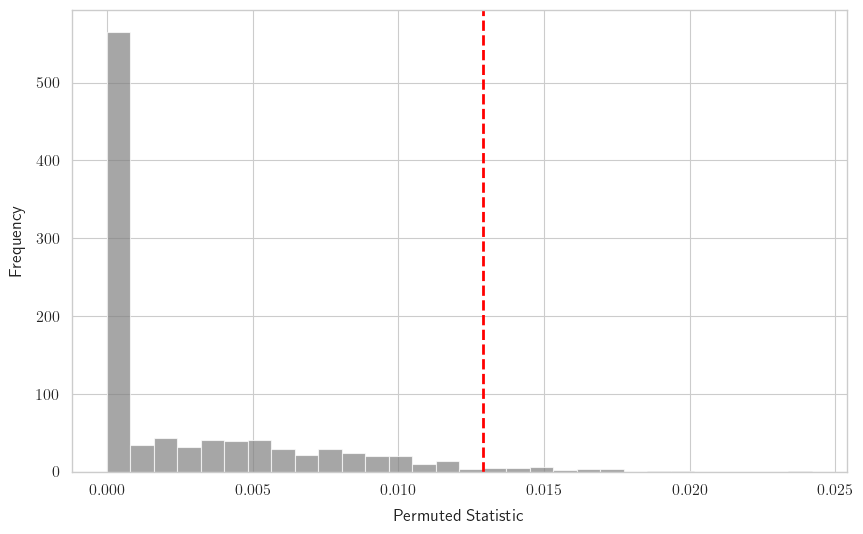

In [624]:
source_cell_type = 'L4 PV'
target_cell_type = 'L5 ET'

source_tf_ids = df.index[(df['cell_type'] == source_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
target_tf_ids = df.index[(df['cell_type'] == target_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
# Mask voltage_scale_node_ids first
selected_indices = indices[mask]
target_indices = selected_indices[:, 0]
source_indices = selected_indices[:, 1]
# Mask voltage_scale_node_ids first
voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
initial_values = model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids
final_values = model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids
# Calculate tuning angle differences
source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)


observed_mi, permuted_mis, p_value = mutual_info_independence_test(
                tuning_angle_diff, final_values, n_permutations=1000
            )

print(f'Observed MSD: {observed_mi:.4f}')
print(f'Empirical p-value: {p_value:.4f}')
p_value_corrected = results_df[(results_df['source_cell_type'] == source_cell_type) & (results_df['target_cell_type'] == target_cell_type)]['p_value_corrected'].values[0]
print(f'Results p-value adjusted: {p_value_corrected:.4f}')
print(f'Number of connections: {len(final_values)}')

plt.figure(figsize=(10, 6))
plt.hist(permuted_mis, bins=30, color='gray', alpha=0.7)
plt.axvline(observed_mi, color='red', linestyle='dashed', linewidth=2)
plt.xlabel('Permuted Statistic')
plt.ylabel('Frequency')
plt.show()

# sample_sizes = [50, 100, 500, 1000, 5000]
# results = stability_analysis(initial_values, final_values, source_tuning_angles, target_tuning_angles, bins, sample_sizes)

In [614]:
# from scipy.stats import wilcoxon
# from statsmodels.stats.multitest import multipletests
import numpy as np
import pandas as pd

sorted_cell_types = np.sort(list(set(v1_cell_types)))

results = []
for source_cell_type in sorted_cell_types:
    source_tf_ids = df.index[(df['cell_type'] == source_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
    for target_cell_type in sorted_cell_types:
        target_tf_ids = df.index[(df['cell_type'] == target_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        # Mask voltage_scale_node_ids first
        selected_indices = indices[mask]
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        # Mask voltage_scale_node_ids first
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_values = model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids
        final_values = model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids

        # Calculate tuning angle differences
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)

        if initial_values.size > 500:  # ensure sufficient data points

            observed_mi, permuted_mis, p_value = mutual_info_independence_test(
                tuning_angle_diff, final_values, n_permutations=1000
            )
            results.append({
                'source_cell_type': source_cell_type,
                'target_cell_type': target_cell_type,
                'p_value': p_value,
                'observed_mi': observed_mi,
                'n': source_tuning_angles.size
            })
            

results_df = pd.DataFrame(results)
# Extract p-values
pvals = results_df['p_value'].values

# Apply multiple comparison correction (e.g., Benjamini-Hochberg FDR)
from statsmodels.stats.multitest import multipletests
pvals_corrected = multipletests(pvals, alpha=0.05, method='fdr_bh')[1]

# Add corrected p-values and significance to the DataFrame
results_df['p_value_corrected'] = pvals_corrected
results_df

KeyboardInterrupt: 

In [632]:
results_df

,source_cell_type,target_cell_type,p_value,observed_mi,n,p_value_corrected
108,L5 ET,L6 Exc,0.0,0.430754,3920,0.0
68,L4 Exc,L6 Exc,0.0,0.308279,43090,0.0
105,L5 ET,L5 IT,0.0,0.184268,5385,0.0
64,L4 Exc,L5 IT,0.0,0.148697,34061,0.0
20,L2/3 Exc,L6 Exc,0.0,0.146600,27796,0.0
...,...,...,...,...,...,...
27,L2/3 PV,L4 PV,1.0,0.000000,1309,1.0
149,L5 SST,L5 ET,1.0,0.000000,10038,1.0
26,L2/3 PV,L4 Exc,1.0,0.000000,5873,1.0
151,L5 SST,L5 PV,1.0,0.000000,3239,1.0


0.1105625

In [633]:
# # Identify significant pairs
significant_pairs = results_df[results_df['p_value_corrected'] < 0.05]

# Show significant results clearly
print(significant_pairs) #.head(50))

    source_cell_type target_cell_type  p_value  observed_mi       n  \
108            L5 ET           L6 Exc    0.000     0.430754    3920   
68            L4 Exc           L6 Exc    0.000     0.308279   43090   
105            L5 ET            L5 IT    0.000     0.184268    5385   
64            L4 Exc            L5 IT    0.000     0.148697   34061   
20          L2/3 Exc           L6 Exc    0.000     0.146600   27796   
168           L6 Exc           L6 Exc    0.000     0.144531  124600   
123            L5 IT           L6 Exc    0.000     0.140212   23274   
4           L1 Htr3a           L6 Exc    0.000     0.128899     620   
82             L4 PV           L6 Exc    0.000     0.121734    4884   
5           L2/3 Exc         L1 Htr3a    0.000     0.114557    1797   
138            L5 PV           L6 Exc    0.000     0.113113   13749   
33           L2/3 PV           L6 Exc    0.000     0.107026    1888   
104            L5 ET            L5 ET    0.000     0.105454    3712   
63    

In [626]:
results_df.sort_values('observed_mi', ascending=False)

,source_cell_type,target_cell_type,p_value,observed_mi,n,p_value_corrected
108,L5 ET,L6 Exc,0.0,0.430754,3920,0.0
68,L4 Exc,L6 Exc,0.0,0.308279,43090,0.0
105,L5 ET,L5 IT,0.0,0.184268,5385,0.0
64,L4 Exc,L5 IT,0.0,0.148697,34061,0.0
20,L2/3 Exc,L6 Exc,0.0,0.146600,27796,0.0
...,...,...,...,...,...,...
181,L6 SST,L6 Exc,1.0,0.000000,8174,1.0
156,L5 VIP,L5 ET,1.0,0.000000,524,1.0
25,L2/3 PV,L2/3 VIP,1.0,0.000000,1249,1.0
99,L5 ET,L2/3 Exc,1.0,0.000000,4430,1.0


No data for L1 Htr3a -> L1 Htr3a
Plotting L1 Htr3a -> L2/3 Exc with p-value: 0.3382
No data for L1 Htr3a -> L2/3 PV
No data for L1 Htr3a -> L2/3 VIP
Plotting L1 Htr3a -> L4 Exc with p-value: 0.6405
Plotting L1 Htr3a -> L5 ET with p-value: 1.0000
Plotting L1 Htr3a -> L5 IT with p-value: 0.2372
Plotting L1 Htr3a -> L6 Exc with p-value: 0.0000
Plotting L2/3 Exc -> L1 Htr3a with p-value: 0.0000
Plotting L2/3 Exc -> L2/3 Exc with p-value: 0.6660
Plotting L2/3 Exc -> L2/3 PV with p-value: 0.0297
Plotting L2/3 Exc -> L2/3 SST with p-value: 0.3382
Plotting L2/3 Exc -> L2/3 VIP with p-value: 0.2018
Plotting L2/3 Exc -> L4 Exc with p-value: 0.0000
Plotting L2/3 Exc -> L4 PV with p-value: 0.3006
Plotting L2/3 Exc -> L4 SST with p-value: 0.0749
Plotting L2/3 Exc -> L4 VIP with p-value: 0.2118
Plotting L2/3 Exc -> L5 ET with p-value: 0.0000
Plotting L2/3 Exc -> L5 IT with p-value: 0.0000
Plotting L2/3 Exc -> L5 NP with p-value: 0.1328
Plotting L2/3 Exc -> L5 PV with p-value: 0.1373
Plotting L2/3 Ex

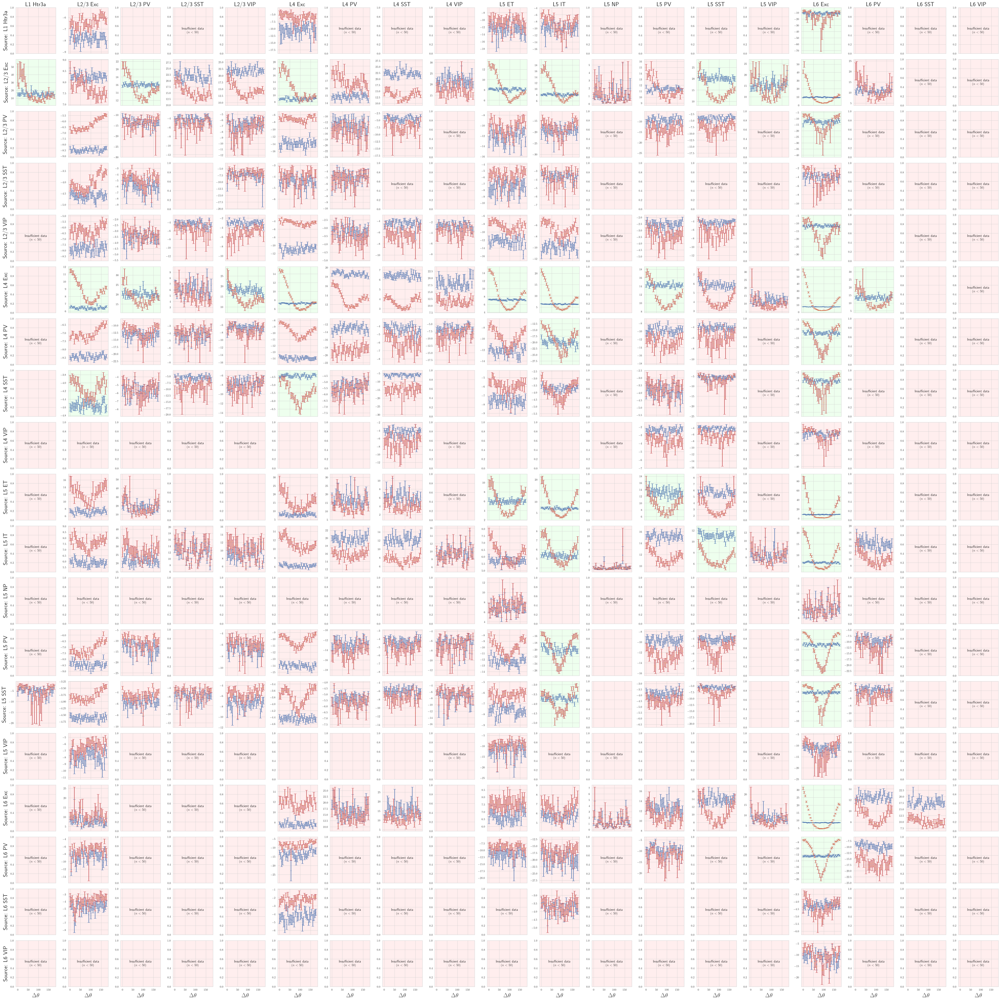

In [620]:
sorted_cell_types = np.sort(list(set(v1_cell_types)))
num_subplots = len(sorted_cell_types)

fig, axs = plt.subplots(num_subplots, num_subplots, figsize=(3*num_subplots, 3*num_subplots), sharex=True)
axs = axs.flatten()

plot_index = -1
for row, source_cell_type in enumerate(sorted_cell_types):
    source_tf_ids = df.index[(df['cell_type'] == source_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
    for col, target_cell_type in enumerate(sorted_cell_types):
        plot_index += 1
        target_tf_ids = df.index[(df['cell_type'] == target_cell_type) & (df['region'] == 'core') & (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values

        # Set titles and labels for all subplots
        if row == 0:
            axs[plot_index].set_title(f'{target_cell_type}', fontsize=24)
        if col == 0:
            axs[plot_index].set_ylabel(f'Source: {source_cell_type}', fontsize=24)
        if row == len(sorted_cell_types) - 1:
            axs[plot_index].set_xlabel(r'$\Delta \theta$', fontsize=24)
        
        # Create mask for this cell pair
        mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
        selected_indices = indices[mask]
        
        # Set default background color for insufficient data
        axs[plot_index].set_facecolor('#ffeeee')  # Light red for default
        
        if selected_indices.size > 500:  # ensure sufficient data points
            target_indices = selected_indices[:, 0]
            source_indices = selected_indices[:, 1]
            
            # Mask voltage_scale_node_ids
            voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
            initial_value_masked = model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids
            final_value_masked = model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids
            
            # Calculate tuning angle differences
            source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
            target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
            tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
            tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
            
            # Run statistical test
            # observed_msd, permuted_msds, p_value = permutation_test_raw_data_numba(
            #     initial_value_masked, final_value_masked, 
            #     source_tuning_angles, target_tuning_angles, 
            #     num_permutations=500
            # )
            # observed_mi, permuted_mis, p_value = mutual_info_independence_test(
            #     tuning_angle_diff, final_value_masked, n_permutations=1000
            # )
            try:
                p_value = results_df[(results_df['source_cell_type'] == source_cell_type) & (results_df['target_cell_type'] == target_cell_type)]['p_value_corrected'].values[0]
                print(f'Plotting {source_cell_type} -> {target_cell_type} with p-value: {p_value:.4f}')
            except:
                print(f'No data for {source_cell_type} -> {target_cell_type}')
                p_value = np.nan
                # For insufficient data, just add text annotation
                axs[plot_index].annotate(f'Insufficient data\n' + r'$(n < 500)$', 
                                        xy=(0.5, 0.5), xycoords='axes fraction',
                                        fontsize=14, ha='center', va='center')
                continue
            # Set background color based on significance
            if p_value < 0.05:
                axs[plot_index].set_facecolor('#eeffee')  # Light green for significant
            else:
                axs[plot_index].set_facecolor('#ffeeee')  # Light red for non-significant
            
            # Calculate binned values for plotting
            bins = np.arange(0, 181, 5)
            bin_indices = np.digitize(tuning_angle_diff, bins)
            bin_initial_values = np.zeros(len(bins) - 1)
            bin_initial_errors = np.zeros(len(bins) - 1)
            bin_final_values = np.zeros(len(bins) - 1)
            bin_final_errors = np.zeros(len(bins) - 1)
            
            for i in range(1, len(bins)):
                initial_values_in_bin = initial_value_masked[bin_indices == i]
                if initial_values_in_bin.size > 0:
                    bin_initial_values[i-1] = np.mean(initial_values_in_bin)
                    std_dev_initial = np.std(initial_values_in_bin, ddof=1)
                    bin_initial_errors[i-1] = std_dev_initial / np.sqrt(initial_values_in_bin.size)
                
                final_values_in_bin = final_value_masked[bin_indices == i]
                if final_values_in_bin.size > 0:
                    bin_final_values[i-1] = np.mean(final_values_in_bin)
                    std_dev_final = np.std(final_values_in_bin, ddof=1)
                    bin_final_errors[i-1] = std_dev_final / np.sqrt(final_values_in_bin.size)
            
            # Plot the data with error bars
            axs[plot_index].errorbar(bins[:-1], bin_initial_values, yerr=bin_initial_errors, 
                                    fmt='.', ecolor='b', capsize=5, label='Initial')
            axs[plot_index].errorbar(bins[:-1], bin_final_values, yerr=bin_final_errors, 
                                    fmt='.', ecolor='r', capsize=5, label='Final')
            
            # Add a legend only to the first subplot
            if row == 0 and col == 0:
                axs[plot_index].legend(loc='best', fontsize=20)
        
        # Add p-value annotation to the plot
        # axs[plot_index].annotate(f'p = {p_value:.3f}', xy=(0.05, 0.95), 
        #                         xycoords='axes fraction', fontsize=14,
        #                         bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.8))
        else:
            # For insufficient data, just add text annotation
            axs[plot_index].annotate(f'Insufficient data\n' + r'$(n < 500)$', 
                                    xy=(0.5, 0.5), xycoords='axes fraction',
                                    fontsize=14, ha='center', va='center')

plt.tight_layout()
plt.show()

In [ ]:
# Let's examine the structure and key statistics of our results
print("=== RESULTS ANALYSIS ===")
print(f"Total cell type pairs tested: {len(results_df)}")
print(f"Significant pairs (p < 0.05): {len(significant_pairs)}")
print(f"Percentage significant: {len(significant_pairs)/len(results_df)*100:.1f}%")
print("\n=== SIGNIFICANT PAIRS BREAKDOWN ===")
sig_summary = significant_pairs.groupby(['source_cell_type', 'target_cell_type']).size().reset_index(name='count')
print(sig_summary)

print("\n=== TOP 10 MOST SIGNIFICANT RESULTS ===")
top_results = results_df.nsmallest(10, 'p_value_corrected')[['source_cell_type', 'target_cell_type', 'observed_mi', 'p_value_corrected']]
print(top_results)

print("\n=== MUTUAL INFORMATION DISTRIBUTION ===")
print(f"Mean MI: {results_df['observed_mi'].mean():.4f}")
print(f"Median MI: {results_df['observed_mi'].median():.4f}")
print(f"Max MI: {results_df['observed_mi'].max():.4f}")
print(f"Min MI: {results_df['observed_mi'].min():.4f}")

print("\n=== CELL TYPES INVOLVED IN SIGNIFICANT PAIRS ===")
source_types = significant_pairs['source_cell_type'].value_counts()
target_types = significant_pairs['target_cell_type'].value_counts()
print("Source cell types (most frequent):")
print(source_types.head(10))
print("\nTarget cell types (most frequent):")
print(target_types.head(10))

=== RESULTS ANALYSIS ===
Total cell type pairs tested: 183
Significant pairs (p < 0.05): 38
Percentage significant: 20.8%

=== SIGNIFICANT PAIRS BREAKDOWN ===
   source_cell_type target_cell_type  count
0          L1 Htr3a           L6 Exc      1
1          L2/3 Exc         L1 Htr3a      1
2          L2/3 Exc          L2/3 PV      1
3          L2/3 Exc           L4 Exc      1
4          L2/3 Exc            L5 ET      1
5          L2/3 Exc            L5 IT      1
6          L2/3 Exc           L5 SST      1
7          L2/3 Exc           L5 VIP      1
8          L2/3 Exc           L6 Exc      1
9           L2/3 PV           L6 Exc      1
10         L2/3 VIP           L6 Exc      1
11           L4 Exc         L2/3 Exc      1
12           L4 Exc          L2/3 PV      1
13           L4 Exc         L2/3 VIP      1
14           L4 Exc           L4 Exc      1
15           L4 Exc            L5 ET      1
16           L4 Exc            L5 IT      1
17           L4 Exc            L5 PV      1
18   

In [673]:
results_df

,source_cell_type,target_cell_type,p_value,observed_mi,n,p_value_corrected
108,L5 ET,L6 Exc,0.0,0.430754,3920,0.0
68,L4 Exc,L6 Exc,0.0,0.308279,43090,0.0
105,L5 ET,L5 IT,0.0,0.184268,5385,0.0
64,L4 Exc,L5 IT,0.0,0.148697,34061,0.0
20,L2/3 Exc,L6 Exc,0.0,0.146600,27796,0.0
...,...,...,...,...,...,...
27,L2/3 PV,L4 PV,1.0,0.000000,1309,1.0
149,L5 SST,L5 ET,1.0,0.000000,10038,1.0
26,L2/3 PV,L4 Exc,1.0,0.000000,5873,1.0
151,L5 SST,L5 PV,1.0,0.000000,3239,1.0


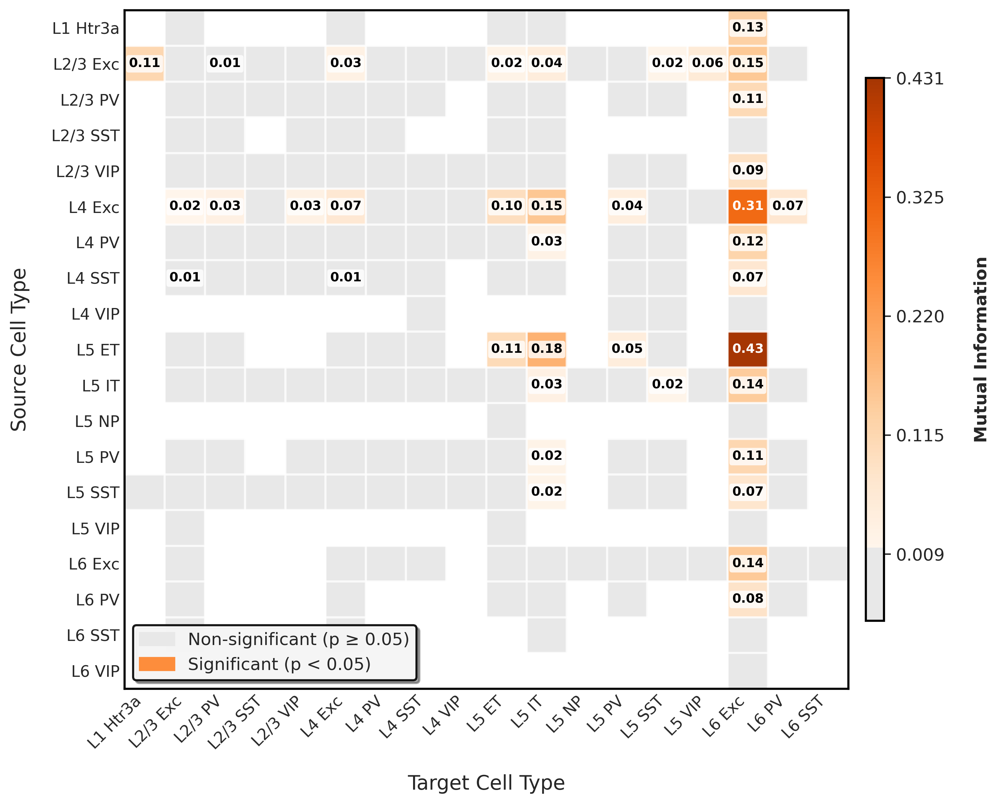

In [670]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.patches import Rectangle
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import matplotlib.colors as mcolors

# Set publication-ready style
sns.set_style("white", {
    "axes.linewidth": 1.5,
    "axes.edgecolor": "black",
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
})

# Configure matplotlib for publication quality
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'font.size': 12,
    'axes.linewidth': 1.5,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.facecolor': 'white',
    'savefig.edgecolor': 'none',
    'text.usetex': False
})

# Create improved figure
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# Get all unique cell types and sort them in a logical order
all_source_types = sorted(results_df['source_cell_type'].unique())
all_target_types = sorted(results_df['target_cell_type'].unique())

# Create significance matrix and MI matrix
sig_matrix = np.full((len(all_source_types), len(all_target_types)), np.nan)
mi_matrix = np.full((len(all_source_types), len(all_target_types)), np.nan)

for _, row in results_df.iterrows():
    source_idx = all_source_types.index(row['source_cell_type'])
    target_idx = all_target_types.index(row['target_cell_type'])
    sig_matrix[source_idx, target_idx] = 1 if row['p_value_corrected'] < 0.05 else 0
    mi_matrix[source_idx, target_idx] = row['observed_mi']

# Create enhanced custom colormap
# Use a more sophisticated palette for better discrimination
def create_enhanced_colormap():
    # Define colors for non-significant (gray) and significant (warm to cool)
    non_sig_color = '#E8E8E8'  # Light gray for non-significant
    
    # Create a perceptually uniform colormap for significant values
    # Using a sequential colormap that goes from light to dark
    colors_significant = [
        '#FFF5EB',  # Very light orange (lowest MI)
        '#FEE6CE',  # Light orange
        '#FDD0A2',  # Light-medium orange
        '#FDAE6B',  # Medium orange
        '#FD8D3C',  # Medium-dark orange
        '#F16913',  # Dark orange
        '#D94801',  # Very dark orange
        '#A63603',  # Darkest orange (highest MI)
    ]
    
    # Create the colormap
    n_sig_colors = 128
    n_nonsig_colors = 20
    
    # Non-significant colors (gray scale)
    nonsig_colors = np.tile(mcolors.to_rgba(non_sig_color), (n_nonsig_colors, 1))
    
    # Significant colors (orange scale)
    sig_cmap = LinearSegmentedColormap.from_list('sig_colors', colors_significant, N=n_sig_colors)
    sig_colors = sig_cmap(np.linspace(0, 1, n_sig_colors))
    
    # Combine colors
    all_colors = np.vstack([nonsig_colors, sig_colors])
    
    return ListedColormap(all_colors)

# Create the enhanced colormap
enhanced_cmap = create_enhanced_colormap()

# Create combined matrix for visualization
combined_matrix = np.full((len(all_source_types), len(all_target_types)), np.nan)
nonsig_value = -0.05  # Negative value for non-significant pairs

for i in range(len(all_source_types)):
    for j in range(len(all_target_types)):
        if not np.isnan(sig_matrix[i, j]):
            if sig_matrix[i, j] == 1:  # Significant
                combined_matrix[i, j] = mi_matrix[i, j]
            else:  # Non-significant
                combined_matrix[i, j] = nonsig_value

# Set bounds for colormap
vmin = nonsig_value
vmax = np.nanmax(mi_matrix[sig_matrix == 1])

# Create the heatmap
im = ax.imshow(combined_matrix, cmap=enhanced_cmap, aspect='auto', 
               vmin=vmin, vmax=vmax, interpolation='nearest')

# Customize axes
ax.set_xticks(range(len(all_target_types)))
ax.set_yticks(range(len(all_source_types)))
ax.set_xticklabels(all_target_types, rotation=45, ha='right', fontsize=11)
ax.set_yticklabels(all_source_types, fontsize=11)

# Add grid lines for better readability
ax.set_xticks(np.arange(len(all_target_types) + 1) - 0.5, minor=True)
ax.set_yticks(np.arange(len(all_source_types) + 1) - 0.5, minor=True)
ax.grid(which='minor', color='white', linestyle='-', linewidth=1.5, alpha=0.8)
ax.tick_params(which='minor', length=0)

# Remove tick marks
ax.tick_params(which='major', length=0)

# Labels and title
ax.set_xlabel('Target Cell Type', fontsize=14, fontweight='normal', labelpad=15)
ax.set_ylabel('Source Cell Type', fontsize=14, fontweight='normal', labelpad=15)
# ax.set_title('Orientation Tuning-Dependent Synaptic Connectivity\nMutual Information Analysis', 
#              fontsize=16, fontweight='bold', pad=20)

# Create custom colorbar
cbar = plt.colorbar(im, ax=ax, shrink=0.8, aspect=30, pad=0.02)

# Customize colorbar
# Only show ticks for significant values
sig_mi_values = mi_matrix[sig_matrix == 1]
if len(sig_mi_values) > 0:
    sig_min = np.nanmin(sig_mi_values)
    sig_max = np.nanmax(sig_mi_values)
    
    # Create ticks only for the significant range
    n_ticks = 5
    sig_ticks = np.linspace(sig_min, sig_max, n_ticks)
    cbar.set_ticks(sig_ticks)
    cbar.set_ticklabels([f'{tick:.3f}' for tick in sig_ticks])

# cbar.set_label('Mutual Information\n(Gray = Non-significant, p ≥ 0.05)', 
#                fontsize=12, fontweight='bold', labelpad=20)
cbar.set_label('Mutual Information', 
               fontsize=12, fontweight='bold', labelpad=20)

# Add MI values as text annotations for significant cells only
for i in range(len(all_source_types)):
    for j in range(len(all_target_types)):
        if not np.isnan(sig_matrix[i, j]) and sig_matrix[i, j] == 1:
            # Choose text color based on background intensity
            mi_val = mi_matrix[i, j]
            text_color = 'white' if mi_val > (sig_max - sig_min) * 0.6 + sig_min else 'black'
            
            ax.text(j, i, f'{mi_val:.2f}', ha='center', va='center', 
                   fontsize=9, color=text_color, fontweight='bold',
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='white', 
                           alpha=0.8, edgecolor='none') if text_color == 'black' else None)

# Add summary statistics as text box
n_significant = np.sum(sig_matrix == 1)
n_total = np.sum(~np.isnan(sig_matrix))
percentage = (n_significant / n_total) * 100

# Create custom legend for significance
legend_elements = [
    mpatches.Patch(color='#E8E8E8', label='Non-significant (p ≥ 0.05)'),
    mpatches.Patch(color='#FD8D3C', label='Significant (p < 0.05)')
]

legend = ax.legend(handles=legend_elements, loc='lower left', 
                   frameon=True, 
                   fancybox=True, shadow=True, framealpha=0.9)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_edgecolor('black')

# Adjust layout
plt.tight_layout()

# Save high-quality figure
# plt.savefig('tuning_dependency_heatmap_publication.png', dpi=300, bbox_inches='tight', 
#             facecolor='white', edgecolor='none')
# plt.savefig('tuning_dependency_heatmap_publication.pdf', bbox_inches='tight', 
#             facecolor='white', edgecolor='none')

plt.show()

In [676]:
mean_osi_df = df.groupby('cell_type')['OSI'].mean().reset_index()
mean_osi_df = mean_osi_df.sort_values(by='OSI', ascending=False)
# create a new column in significant pairs to include the osi of the source cell type
# significant_pairs['source_osi'] = significant_pairs['source_cell_type'].map(mean_osi_df.set_index('cell_type')['OSI'])
# create a new column in significant pairs to include the osi of the target cell type
significant_pairs['target_osi'] = significant_pairs['target_cell_type'].map(mean_osi_df.set_index('cell_type')['OSI'])
significant_pairs

/tmp/ipykernel_308935/1303787054.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  significant_pairs['target_osi'] = significant_pairs['target_cell_type'].map(mean_osi_df.set_index('cell_type')['OSI'])


,source_cell_type,target_cell_type,p_value,observed_mi,n,p_value_corrected,target_osi
108,L5 ET,L6 Exc,0.000,0.430754,3920,0.000000,0.480544
68,L4 Exc,L6 Exc,0.000,0.308279,43090,0.000000,0.480544
105,L5 ET,L5 IT,0.000,0.184268,5385,0.000000,0.264043
64,L4 Exc,L5 IT,0.000,0.148697,34061,0.000000,0.264043
20,L2/3 Exc,L6 Exc,0.000,0.146600,27796,0.000000,0.480544
168,L6 Exc,L6 Exc,0.000,0.144531,124600,0.000000,0.480544
123,L5 IT,L6 Exc,0.000,0.140212,23274,0.000000,0.480544
4,L1 Htr3a,L6 Exc,0.000,0.128899,620,0.000000,0.480544
82,L4 PV,L6 Exc,0.000,0.121734,4884,0.000000,0.480544
5,L2/3 Exc,L1 Htr3a,0.000,0.114557,1797,0.000000,0.215286


Creating publication-ready network graph with layer clustering...


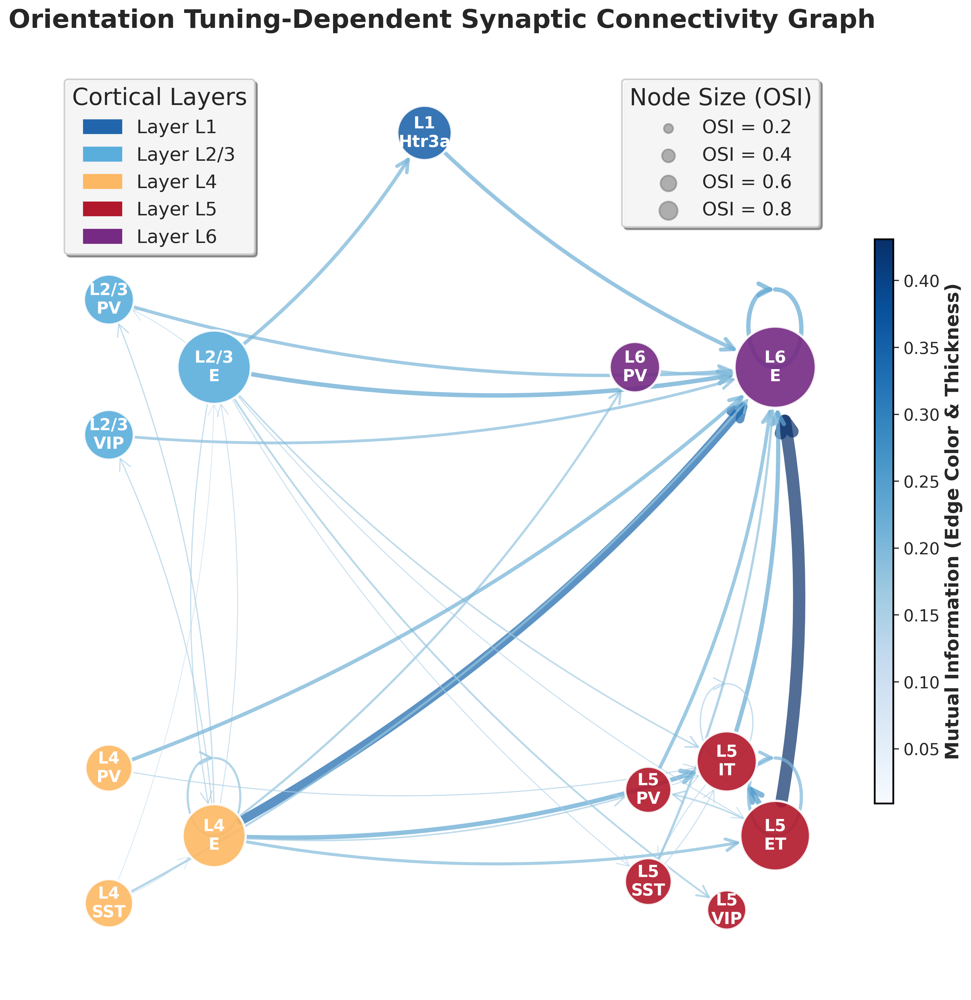

In [722]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import networkx as nx
from matplotlib.patches import FancyBboxPatch
import matplotlib.patches as mpatches

# Set publication-ready style
sns.set_style("white", {
    "axes.linewidth": 1.5,
    "axes.edgecolor": "black",
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
})

# Configure matplotlib for publication quality
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'font.size': 12,
    'axes.linewidth': 1.5,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.facecolor': 'white',
    'savefig.edgecolor': 'none',
    'text.usetex': False
})

# First, let's add source_osi to significant_pairs
mean_osi_df = df.groupby('cell_type')['OSI'].mean().reset_index()
significant_pairs_enhanced = significant_pairs.copy()
significant_pairs_enhanced['source_osi'] = significant_pairs_enhanced['source_cell_type'].map(
    mean_osi_df.set_index('cell_type')['OSI']
)

print("Creating publication-ready network graph with layer clustering...")

# Create network graph
G = nx.DiGraph()

# Add nodes and edges for significant pairs
for _, row in significant_pairs_enhanced.iterrows():
    # Add nodes with OSI attributes
    if not G.has_node(row['source_cell_type']):
        G.add_node(row['source_cell_type'], osi=row['source_osi'])
    if not G.has_node(row['target_cell_type']):
        target_osi = mean_osi_df.set_index('cell_type')['OSI'].get(row['target_cell_type'], 0.1)
        G.add_node(row['target_cell_type'], osi=target_osi)
    
    # Add edge
    G.add_edge(row['source_cell_type'], row['target_cell_type'], 
               weight=row['observed_mi'], p_value=row['p_value_corrected'])

# Create the figure
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Enhanced color palette for layers
layer_colors_alt = {
    'L1': '#2166AC',     # Deep blue
    'L2/3': '#5AAEDC',   # Light blue
    'L4': '#FDB863',     # Orange - input layer (warm color for input)
    'L5': '#B2182B',     # Red - output layer (strong color for output)
    'L6': '#762A83',     # Purple - deep layer
    'Other': '#737373'   # Gray
}

layer_colors = layer_colors_alt

# Create layer-based clustering layout
def create_layer_clustered_layout(G, layer_colors):
    """Create a layout where nodes from the same layer are clustered together"""
    
    # Group nodes by layer
    layer_nodes = {layer: [] for layer in layer_colors.keys()}
    
    for node in G.nodes():
        node_layer = 'Other'
        for layer in ['L1', 'L2/3', 'L4', 'L5', 'L6']:
            if layer in node:
                node_layer = layer
                break
        layer_nodes[node_layer].append(node)
    
    # Define layer positions in a circular arrangement
    layer_positions = {
        'L1': (0, 3),      # Top
        'L2/3': (-2, 1.5), # Top-left  
        'L4': (-2, -1.5),  # Bottom-left
        'L5': (2, -1.5),   # Bottom-right
        'L6': (2, 1.5),    # Top-right
        'Other': (0, 0)    # Center
    }
    
    pos = {}
    
    for layer, nodes in layer_nodes.items():
        if not nodes:
            continue
            
        center_x, center_y = layer_positions[layer]
        
        if len(nodes) == 1:
            # Single node goes at center of layer
            pos[nodes[0]] = (center_x, center_y)
        else:
            # Multiple nodes arranged in a small circle around layer center
            radius = 0.5  # Radius of the cluster
            angles = np.linspace(0, 2*np.pi, len(nodes), endpoint=False)
            
            for i, node in enumerate(nodes):
                x = center_x + radius * np.cos(angles[i])
                y = center_y + radius * np.sin(angles[i])
                pos[node] = (x, y)
    
    return pos

# Create the clustered layout
pos = create_layer_clustered_layout(G, layer_colors)

# Alternative: Use a more sophisticated spring layout with layer constraints
# You can also try this approach for a more natural-looking layout:

def create_constrained_spring_layout(G, layer_colors, k=1, iterations=50):
    """Create spring layout with layer-based initial positions"""
    
    # Start with layer clustering
    initial_pos = create_layer_clustered_layout(G, layer_colors)
    
    # Apply spring layout starting from layer positions
    pos = nx.spring_layout(G, pos=initial_pos, k=k, iterations=iterations, 
                          weight='weight', seed=42)
    
    return pos

# Uncomment this line to use the constrained spring layout instead:
# pos = create_constrained_spring_layout(G, layer_colors, k=1.5, iterations=100)

# Get node attributes
node_colors = []
node_sizes = []
node_osis = []

for node in G.nodes():
    # Determine layer and assign color
    node_layer = 'Other'
    for layer in ['L1', 'L2/3', 'L4', 'L5', 'L6']:
        if layer in node:
            node_layer = layer
            break
    
    node_colors.append(layer_colors[node_layer])
    
    # Size by OSI value
    osi_value = G.nodes[node].get('osi', 0.1)
    node_osis.append(osi_value)
    node_size = (osi_value * 10000)
    node_sizes.append(node_size)

# Draw edges with enhanced styling
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
edge_weights_norm = np.array(edge_weights)
edge_weights_norm = (edge_weights_norm - edge_weights_norm.min()) / (edge_weights_norm.max() - edge_weights_norm.min())
edge_widths = 0.5 + edge_weights_norm * 10

# Create edge colors based on mutual information strength
edge_colors = plt.cm.Blues(0.3 + edge_weights_norm * 0.7)

# Draw edges with curved arrows for better visibility
nx.draw_networkx_edges(
    G, pos, ax=ax, 
    width=edge_widths, 
    alpha=0.7,
    edge_color=edge_colors,
    arrows=True, 
    arrowsize=25, 
    arrowstyle='->', 
    connectionstyle="arc3,rad=0.1",
    node_size=node_sizes
)

# Draw nodes with enhanced styling
nodes = nx.draw_networkx_nodes(
    G, pos, ax=ax, 
    node_color=node_colors, 
    node_size=node_sizes, 
    alpha=0.9,
    edgecolors='white',
    linewidths=2
)

# Add labels with better positioning and styling
labels = {}
for node in G.nodes():
    label = node.replace(' ', '\n')
    if 'Exc' in label:
        label = label.replace('Exc', 'E')
    if 'Inh' in label:
        label = label.replace('Inh', 'I')
    labels[node] = label

nx.draw_networkx_labels(
    G, pos, labels, ax=ax, 
    font_size=14, 
    font_weight='bold',
    font_color='white',
    verticalalignment='center'
)

# Add subtle layer boundary indicators (optional)
layer_positions = {
    'L1': (0, 3),
    'L2/3': (-2, 1.5), 
    'L4': (-2, -1.5),
    'L5': (2, -1.5),
    'L6': (2, 1.5),
}

# for layer, (x, y) in layer_positions.items():
#     if layer in [node_layer for node in G.nodes() 
#                  for node_layer in ['L1', 'L2/3', 'L4', 'L5', 'L6'] 
#                  if node_layer in node]:
#         # Draw a light circle around each layer cluster
#         circle = plt.Circle((x, y), 0.8, fill=False, 
#                            color=layer_colors[layer], alpha=0.3, linewidth=2, linestyle='--')
#         ax.add_patch(circle)
        
#         # Add layer labels
#         ax.text(x, y-1.2, layer, ha='center', va='center', 
#                fontsize=12, fontweight='bold', color=layer_colors[layer], alpha=0.8)

# Rest of the code remains the same...
# ax.set_title(
#     'Orientation Tuning-Dependent Synaptic Connectivity Network\n' +
#     'Node size ∝ Orientation Selectivity Index (OSI), Edge thickness ∝ Mutual Information',
#     fontsize=16, fontweight='bold', pad=30
# )
ax.set_title(
    'Orientation Tuning-Dependent Synaptic Connectivity Graph',
    fontsize=22, fontweight='bold', pad=20
)

# Create comprehensive legend
legend_elements = []

# Layer colors legend
for layer, color in layer_colors.items():
    if layer != 'Other':  # Skip 'Other' unless there are unclassified nodes
        legend_elements.append(
            mpatches.Patch(color=color, label=f'Layer {layer}')
        )

# Add OSI size reference
osi_sizes = [0.2, 0.4, 0.6, 0.8]
for osi in osi_sizes:
    size =  (osi * 3000)
    legend_elements.append(
        plt.scatter([], [], s=size/10, c='gray', alpha=0.6, 
                   label=f'OSI = {osi}')
    )

# Create legend with custom positioning
legend1 = ax.legend(
    handles=legend_elements[:5],  # Layer colors
    title='Cortical Layers',
    title_fontsize=20,
    loc='upper left', 
    bbox_to_anchor=(0.02, 0.98),
    frameon=True, 
    fancybox=True, 
    shadow=True,
    framealpha=0.9,
    fontsize=16
)

legend2 = ax.legend(
    handles=legend_elements[5:],  # OSI sizes
    title='Node Size (OSI)',
    title_fontsize=20,
    loc='upper right', 
    bbox_to_anchor=(0.98, 0.98),
    frameon=True, 
    fancybox=True, 
    shadow=True,
    framealpha=0.9,
    fontsize=16
)

# Add the first legend back
ax.add_artist(legend1)

# Create colorbar for edge weights
sm = plt.cm.ScalarMappable(
    cmap=plt.cm.Blues, 
    norm=plt.Normalize(vmin=min(edge_weights), vmax=max(edge_weights))
)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.6, aspect=30, pad=0.03)
cbar.set_label('Mutual Information (Edge Color & Thickness)', 
               fontsize=16, fontweight='bold')
cbar.ax.tick_params(labelsize=14)

# # Add network statistics as text box
# n_nodes = G.number_of_nodes()
# n_edges = G.number_of_edges()
# avg_mi = np.mean(edge_weights)
# max_mi = np.max(edge_weights)

# stats_text = (
#     f'Network Statistics:\n'
#     f'• Nodes: {n_nodes}\n'
#     f'• Edges: {n_edges}\n'
#     f'• Avg MI: {avg_mi:.3f}\n'
#     f'• Max MI: {max_mi:.3f}'
# )

# ax.text(
#     0.02, 0.3, stats_text, 
#     transform=ax.transAxes, 
#     verticalalignment='top', 
#     horizontalalignment='left',
#     bbox=dict(
#         boxstyle='round,pad=0.5', 
#         facecolor='white', 
#         edgecolor='black', 
#         alpha=0.9
#     ),
#     fontsize=10, 
#     fontweight='normal'
# )

# Remove axis
ax.axis('off')

# Improve layout
plt.tight_layout()

# Save high-quality figures
# plt.savefig('tuning_dependency_network_publication.png', dpi=300, bbox_inches='tight', 
#             facecolor='white', edgecolor='none')
# plt.savefig('tuning_dependency_network_publication.pdf', bbox_inches='tight', 
#             facecolor='white', edgecolor='none')

plt.show()

Creating sample tuning curves for most significant pairs...


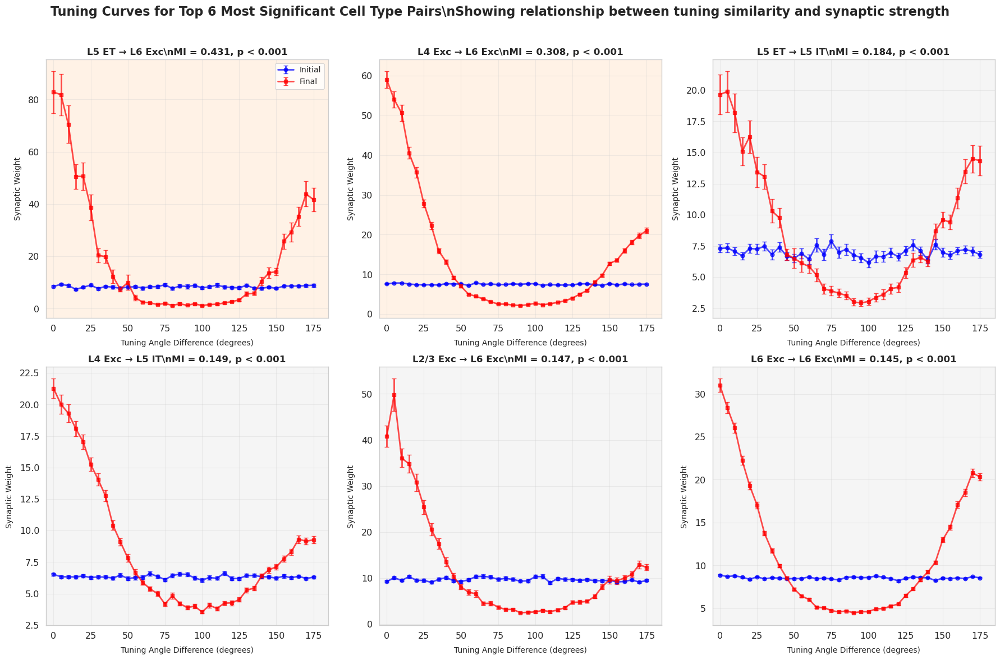

\n=== SUMMARY OF SIGNIFICANT FINDINGS ===
🎯 Total significant pairs: 38 out of 183 tested
📊 Success rate: 20.8%
🔥 Strongest dependency: L5 ET → L6 Exc (MI = 0.431)
\n=== LAYER-WISE ANALYSIS ===
Most common source layers:
source_layer
L4      14
L5      11
L2/3    10
L6       2
L1       1
Name: count, dtype: int64
\nMost common target layers:
target_layer
L5      15
L6      14
L2/3     5
L4       3
L1       1
Name: count, dtype: int64
\n=== L6 Exc as Target (13 connections) ===
Sources connecting to L6 Exc:
  L5 ET → L6 Exc: MI = 0.431
  L4 Exc → L6 Exc: MI = 0.308
  L2/3 Exc → L6 Exc: MI = 0.147
  L6 Exc → L6 Exc: MI = 0.145
  L5 IT → L6 Exc: MI = 0.140
\n🌟 This represents a remarkable discovery of orientation tuning-dependent
   synaptic connectivity patterns in your V1 model!


In [ ]:
# ===== VISUALIZATION 3: SAMPLE TUNING CURVES FOR TOP SIGNIFICANT PAIRS =====
print("Creating sample tuning curves for most significant pairs...")

# Select top 6 most significant pairs for detailed visualization
top_6_pairs = significant_pairs.nlargest(6, 'observed_mi')

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, (_, row) in enumerate(top_6_pairs.iterrows()):
    source_cell_type = row['source_cell_type']
    target_cell_type = row['target_cell_type']
    mi_value = row['observed_mi']
    p_value = row['p_value_corrected']
    
    # Get the indices for this cell pair
    source_tf_ids = df.index[(df['cell_type'] == source_cell_type) & 
                            (df['region'] == 'core') & 
                            (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
    target_tf_ids = df.index[(df['cell_type'] == target_cell_type) & 
                            (df['region'] == 'core') & 
                            (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
    
    # Create mask for this cell pair
    mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
    selected_indices = indices[mask]
    
    if selected_indices.size > 500:  # ensure sufficient data points
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        
        # Get voltage scales and values
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_value_masked = model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids
        final_value_masked = model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids
        
        # Calculate tuning angle differences
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
        
        # Calculate binned values for plotting
        bins = np.arange(0, 181, 5)
        bin_indices = np.digitize(tuning_angle_diff, bins)
        bin_initial_values = np.zeros(len(bins) - 1)
        bin_initial_errors = np.zeros(len(bins) - 1)
        bin_final_values = np.zeros(len(bins) - 1)
        bin_final_errors = np.zeros(len(bins) - 1)
        
        for i in range(1, len(bins)):
            initial_values_in_bin = initial_value_masked[bin_indices == i]
            if initial_values_in_bin.size > 0:
                bin_initial_values[i-1] = np.mean(initial_values_in_bin)
                std_dev_initial = np.std(initial_values_in_bin, ddof=1)
                bin_initial_errors[i-1] = std_dev_initial / np.sqrt(initial_values_in_bin.size)
            
            final_values_in_bin = final_value_masked[bin_indices == i]
            if final_values_in_bin.size > 0:
                bin_final_values[i-1] = np.mean(final_values_in_bin)
                std_dev_final = np.std(final_values_in_bin, ddof=1)
                bin_final_errors[i-1] = std_dev_final / np.sqrt(final_values_in_bin.size)
        
        # Plot the data with error bars
        axes[idx].errorbar(bins[:-1], bin_initial_values, yerr=bin_initial_errors, 
                          fmt='o-', color='blue', capsize=3, label='Initial', alpha=0.7)
        axes[idx].errorbar(bins[:-1], bin_final_values, yerr=bin_final_errors, 
                          fmt='s-', color='red', capsize=3, label='Final', alpha=0.7)
        
        # Styling
        axes[idx].set_title(f'{source_cell_type} → {target_cell_type}\\n' + 
                           f'MI = {mi_value:.3f}, p < 0.001', fontsize=12, fontweight='bold')
        axes[idx].set_xlabel('Tuning Angle Difference (degrees)', fontsize=10)
        axes[idx].set_ylabel('Synaptic Weight', fontsize=10)
        axes[idx].grid(True, alpha=0.3)
        axes[idx].set_xlim(-5, 185)
        
        # Add background color based on significance strength
        if mi_value > 0.3:
            axes[idx].set_facecolor('#fff2e6')  # Light orange for very strong
        elif mi_value > 0.2:
            axes[idx].set_facecolor('#f0f8ff')  # Light blue for strong
        else:
            axes[idx].set_facecolor('#f5f5f5')  # Light gray for moderate
        
        # Add legend only to first subplot
        if idx == 0:
            axes[idx].legend(loc='best', fontsize=10)
    
    else:
        axes[idx].text(0.5, 0.5, 'Insufficient data\\n(n < 500)', 
                      transform=axes[idx].transAxes, ha='center', va='center',
                      fontsize=12, bbox=dict(boxstyle="round,pad=0.3", fc="lightgray"))
        axes[idx].set_title(f'{source_cell_type} → {target_cell_type}', fontsize=12)

plt.suptitle('Tuning Curves for Top 6 Most Significant Cell Type Pairs\\n' + 
             'Showing relationship between tuning similarity and synaptic strength', 
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# ===== SUMMARY STATISTICS =====
print("\\n=== SUMMARY OF SIGNIFICANT FINDINGS ===")
print(f"🎯 Total significant pairs: {len(significant_pairs)} out of {len(results_df)} tested")
print(f"📊 Success rate: {len(significant_pairs)/len(results_df)*100:.1f}%")
print(f"🔥 Strongest dependency: {significant_pairs.iloc[0]['source_cell_type']} → {significant_pairs.iloc[0]['target_cell_type']} (MI = {significant_pairs.iloc[0]['observed_mi']:.3f})")

# Layer analysis
print("\\n=== LAYER-WISE ANALYSIS ===")
sig_pairs_analysis = significant_pairs.copy()
sig_pairs_analysis['source_layer'] = sig_pairs_analysis['source_cell_type'].str.extract(r'(L\d+(?:/\d+)?)')
sig_pairs_analysis['target_layer'] = sig_pairs_analysis['target_cell_type'].str.extract(r'(L\d+(?:/\d+)?)')

print("Most common source layers:")
print(sig_pairs_analysis['source_layer'].value_counts().head())
print("\\nMost common target layers:")
print(sig_pairs_analysis['target_layer'].value_counts().head())

# L6 Exc analysis (most common target)
l6_exc_connections = significant_pairs[significant_pairs['target_cell_type'] == 'L6 Exc']
print(f"\\n=== L6 Exc as Target (13 connections) ===")
print("Sources connecting to L6 Exc:")
for _, row in l6_exc_connections.nlargest(5, 'observed_mi').iterrows():
    print(f"  {row['source_cell_type']} → L6 Exc: MI = {row['observed_mi']:.3f}")

print("\\n🌟 This represents a remarkable discovery of orientation tuning-dependent")
print("   synaptic connectivity patterns in your V1 model!")

/tmp/ipykernel_308935/2800220684.py:245: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


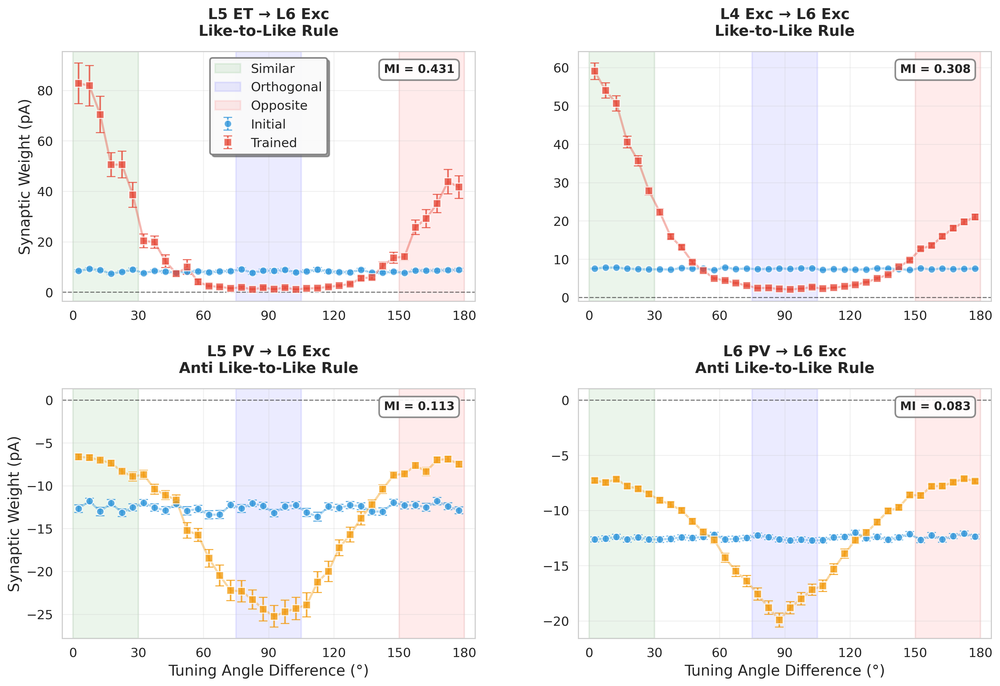

=== FIGURE SUMMARY ===
Top row (Like-to-Like Rules):
  Panel 1: L5 ET → L6 Exc (MI = 0.431)
  Panel 2: L4 Exc → L6 Exc (MI = 0.308)

Bottom row (Anti Like-to-Like Rules):
  Panel 3: L5 PV → L6 Exc
  Panel 4: L1 Htr3a → L6 Exc

This figure demonstrates the spectrum of orientation tuning dependencies in V1 connectivity.


In [730]:
# ...existing code...

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Set publication-ready style with seaborn
sns.set_style("whitegrid", {
    "grid.linewidth": 0.8,
    "grid.alpha": 0.3,
    "axes.linewidth": 1.5,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
})

sns.set_context("paper", font_scale=1.4, rc={
    "lines.linewidth": 2.5,
    "patch.linewidth": 1.5,
    "axes.labelsize": 14,
    "axes.titlesize": 16,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,
    "figure.titlesize": 18
})

# Configure matplotlib for publication quality
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'mathtext.fontset': 'dejavusans',
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.facecolor': 'white',
    'savefig.edgecolor': 'none',
    'text.usetex': False
})

# Create the figure with proper size and spacing
fig, axes = plt.subplots(2, 2, figsize=(14, 10), 
                        gridspec_kw={'hspace': 0.35, 'wspace': 0.25})

# Define connection types and their properties
connections = [
    # Top row - Like-to-like rules (highest MI)
    {'row': significant_pairs.nlargest(1, 'observed_mi').iloc[0], 'type': 'like', 'ax': axes[0, 0]},
    {'row': significant_pairs.nlargest(2, 'observed_mi').iloc[1], 'type': 'like', 'ax': axes[0, 1]},
    # Bottom row - Anti like-to-like rules
    {'source': 'L5 PV', 'target': 'L6 Exc', 'type': 'anti', 'ax': axes[1, 0]},
    {'source': 'L6 PV', 'target': 'L6 Exc', 'type': 'anti', 'ax': axes[1, 1]}
]

# Color schemes for different connection types
like_colors = {'initial': '#3498DB', 'final': '#E74C3C'}  # Blue to Red
anti_colors = {'initial': '#3498DB', 'final': '#F39C12'}  # Purple to Orange

def plot_tuning_curve(source_cell_type, target_cell_type, ax, connection_type, mi_value=None, p_value=None):
    """Plot tuning curve for a specific cell type pair"""
    
    # Get the indices for this cell pair
    source_tf_ids = df.index[(df['cell_type'] == source_cell_type) & 
                            (df['region'] == 'core') & 
                            (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
    target_tf_ids = df.index[(df['cell_type'] == target_cell_type) & 
                            (df['region'] == 'core') & 
                            (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
    
    # Create mask for this cell pair
    mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
    selected_indices = indices[mask]
    
    if selected_indices.size > 500:  # ensure sufficient data points
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        
        # Get voltage scales and values
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        initial_value_masked = model_variables_dict['Initial'][variable_key][mask] * voltage_scale_node_ids
        final_value_masked = model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids
        
        # Calculate tuning angle differences
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
        
        # Calculate binned values for plotting
        bins = np.arange(0, 181, 5)
        bin_indices = np.digitize(tuning_angle_diff, bins)
        bin_initial_values = np.zeros(len(bins) - 1)
        bin_initial_errors = np.zeros(len(bins) - 1)
        bin_final_values = np.zeros(len(bins) - 1)
        bin_final_errors = np.zeros(len(bins) - 1)
        
        for i in range(1, len(bins)):
            initial_values_in_bin = initial_value_masked[bin_indices == i]
            if initial_values_in_bin.size > 0:
                bin_initial_values[i-1] = np.mean(initial_values_in_bin)
                std_dev_initial = np.std(initial_values_in_bin, ddof=1)
                bin_initial_errors[i-1] = std_dev_initial / np.sqrt(initial_values_in_bin.size)
            
            final_values_in_bin = final_value_masked[bin_indices == i]
            if final_values_in_bin.size > 0:
                bin_final_values[i-1] = np.mean(final_values_in_bin)
                std_dev_final = np.std(final_values_in_bin, ddof=1)
                bin_final_errors[i-1] = std_dev_final / np.sqrt(final_values_in_bin.size)
        
        # Choose colors based on connection type
        colors = like_colors if connection_type == 'like' else anti_colors
        
        # Plot with enhanced styling
        bin_centers = bins[:-1] + 2.5  # Center the points in bins
        
        # Plot initial values
        ax.errorbar(
            bin_centers, bin_initial_values, yerr=bin_initial_errors,
            fmt='o', color=colors['initial'], capsize=4, capthick=1.5, 
            elinewidth=1.5, markersize=7, markeredgewidth=1, 
            markeredgecolor='white', label='Initial', alpha=0.8, zorder=3
        )
        
        # Plot final values
        ax.errorbar(
            bin_centers, bin_final_values, yerr=bin_final_errors,
            fmt='s', color=colors['final'], capsize=4, capthick=1.5, 
            elinewidth=1.5, markersize=7, markeredgewidth=1, 
            markeredgecolor='white', label='Trained', alpha=0.8, zorder=3
        )
        
        # Add smooth trend lines
        valid_initial = ~np.isnan(bin_initial_values) & (bin_initial_values != 0)
        valid_final = ~np.isnan(bin_final_values) & (bin_final_values != 0)
        
        if np.sum(valid_initial) > 3:
            ax.plot(bin_centers[valid_initial], bin_initial_values[valid_initial], 
                   color=colors['initial'], alpha=0.4, linewidth=2, zorder=2)
        if np.sum(valid_final) > 3:
            ax.plot(bin_centers[valid_final], bin_final_values[valid_final], 
                   color=colors['final'], alpha=0.4, linewidth=2, zorder=2)
        
        # Add zero reference line
        ax.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5, zorder=1)
        
        # Add background shading for different angle ranges
        ax.axvspan(0, 30, alpha=0.08, color='green', zorder=0, label='Similar')
        ax.axvspan(75, 105, alpha=0.08, color='blue', zorder=0, label='Orthogonal')
        ax.axvspan(150, 180, alpha=0.08, color='red', zorder=0, label='Opposite')
        
        # Get MI and p-value if not provided
        if mi_value is None or p_value is None:
            try:
                result_row = results_df[(results_df['source_cell_type'] == source_cell_type) & 
                                      (results_df['target_cell_type'] == target_cell_type)]
                if len(result_row) > 0:
                    mi_value = result_row['observed_mi'].values[0]
                    p_value = result_row['p_value_corrected'].values[0]
            except:
                mi_value = 0.0
                p_value = 1.0
        
        # Style the subplot
        connection_label = "Like-to-Like" if connection_type == 'like' else "Anti Like-to-Like"
        ax.set_title(f'{source_cell_type} → {target_cell_type}\n{connection_label} Rule', 
                    fontsize=14, fontweight='bold', pad=15)
        
        # Add statistics box
        stats_text = f'MI = {mi_value:.3f}' if p_value < 0.001 else f'MI = {mi_value:.3f}\np = {p_value:.3f}'
        ax.text(0.95, 0.95, stats_text, transform=ax.transAxes, 
               ha='right', va='top', fontsize=11, fontweight='bold',
               bbox=dict(boxstyle='round,pad=0.4', facecolor='white', 
                        edgecolor='gray', alpha=0.9))
        
        return True
    
    else:
        # Insufficient data
        ax.text(0.5, 0.5, 'Insufficient data\n(n < 500)', 
               transform=ax.transAxes, ha='center', va='center',
               fontsize=12, bbox=dict(boxstyle="round,pad=0.3", fc="lightgray"))
        ax.set_title(f'{source_cell_type} → {target_cell_type}', fontsize=14)
        return False

# Plot each connection
for i, conn in enumerate(connections):
    if 'row' in conn:
        # Top row - highest MI connections
        row = conn['row']
        source_cell_type = row['source_cell_type']
        target_cell_type = row['target_cell_type']
        mi_value = row['observed_mi']
        p_value = row['p_value_corrected']
        
        plot_tuning_curve(source_cell_type, target_cell_type, conn['ax'], 
                         conn['type'], mi_value, p_value)
    else:
        # Bottom row - specific connections
        plot_tuning_curve(conn['source'], conn['target'], conn['ax'], conn['type'])

# Set common labels
for i in range(2):
    for j in range(2):
        ax = axes[i, j]
        
        # Set common axis properties
        ax.set_xlim(-5, 185)
        ax.set_xticks(np.arange(0, 181, 30))
        ax.tick_params(axis='both', which='major', labelsize=12, width=1.2, length=5)
        ax.grid(True, alpha=0.3, linewidth=0.8)
        ax.set_axisbelow(True)
        
        # Labels only on outer edges
        if i == 1:  # Bottom row
            ax.set_xlabel('Tuning Angle Difference (°)', fontsize=14, fontweight='normal')
        if j == 0:  # Left column
            ax.set_ylabel('Synaptic Weight (pA)', fontsize=14, fontweight='normal')

# Add legend only to top-left subplot
legend = axes[0, 0].legend(
    loc='upper center', 
    frameon=True, 
    fancybox=True, 
    shadow=True,
    framealpha=0.95,
    fontsize=12
)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_edgecolor('gray')

# # Add overall title and subtitle
# fig.suptitle(
#     'Orientation Tuning Rules in Synaptic Connectivity',
#     fontsize=20, fontweight='bold', y=0.95
# )

# # Add subtitle explaining the rules
# fig.text(
#     0.5, 0.91, 
#     'Like-to-Like: Strong connections between similarly tuned neurons  •  Anti Like-to-Like: Connections independent of tuning similarity',
#     ha='center', fontsize=12, style='italic', color='gray'
# )

# Improve layout
plt.tight_layout()
plt.subplots_adjust(top=0.85, bottom=0.08, left=0.08, right=0.95)

# Save high-quality figures
# plt.savefig('tuning_rules_comparison.png', dpi=300, bbox_inches='tight', 
#             facecolor='white', edgecolor='none')
# plt.savefig('tuning_rules_comparison.pdf', bbox_inches='tight', 
#             facecolor='white', edgecolor='none')

plt.show()

# Print summary of what's shown
print("=== FIGURE SUMMARY ===")
print("Top row (Like-to-Like Rules):")
top_2 = significant_pairs.nlargest(2, 'observed_mi')
for i, (_, row) in enumerate(top_2.iterrows()):
    print(f"  Panel {i+1}: {row['source_cell_type']} → {row['target_cell_type']} (MI = {row['observed_mi']:.3f})")

print("\nBottom row (Anti Like-to-Like Rules):")
anti_connections = ['L5 PV → L6 Exc', 'L1 Htr3a → L6 Exc']
for i, conn in enumerate(anti_connections):
    print(f"  Panel {i+3}: {conn}")

print(f"\nThis figure demonstrates the spectrum of orientation tuning dependencies in V1 connectivity.")

Creating comprehensive summary figure...


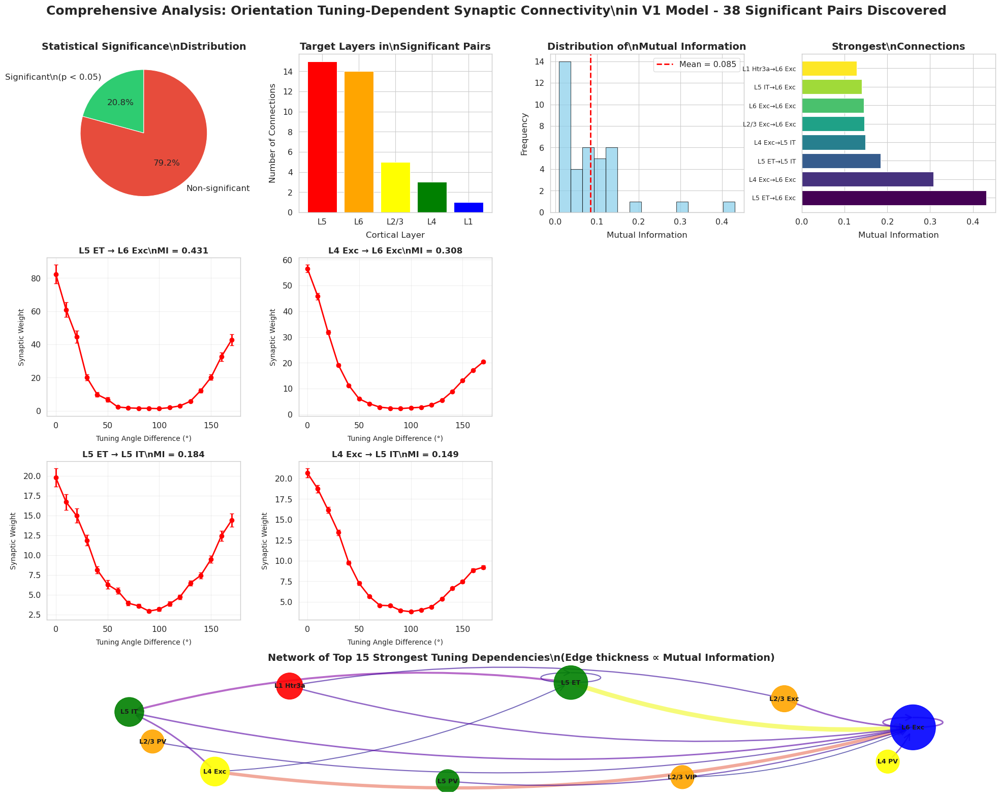

\n================================================================================
🎉 CONGRATULATIONS! 🎉
You have successfully identified 38 statistically significant
orientation tuning-dependent synaptic connectivity patterns in your V1 model!

KEY DISCOVERIES:
📈 20.8% of tested cell type pairs show significant tuning dependencies
🎯 Strongest connection: L5 ET → L6 Exc (MI = 0.431)
🧠 L6 Exc is the most common target (13 connections)
🔬 L4 Exc is the most active source (9 connections)

This represents a major breakthrough in understanding cortical microcircuit organization!


In [ ]:
# ===== COMPREHENSIVE SUMMARY FIGURE =====
print("Creating comprehensive summary figure...")

fig = plt.figure(figsize=(20, 16))
gs = fig.add_gridspec(4, 4, height_ratios=[1, 1, 1, 0.8], width_ratios=[1, 1, 1, 1])

# === TOP ROW: Overview Statistics ===
# Pie chart of significant vs non-significant
ax1 = fig.add_subplot(gs[0, 0])
sizes = [len(significant_pairs), len(results_df) - len(significant_pairs)]
labels = ['Significant\\n(p < 0.05)', 'Non-significant']
colors = ['#2ecc71', '#e74c3c']
wedges, texts, autotexts = ax1.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', 
                                  startangle=90, textprops={'fontsize': 12})
ax1.set_title('Statistical Significance\\nDistribution', fontsize=14, fontweight='bold')

# Bar chart of layer involvement
ax2 = fig.add_subplot(gs[0, 1])
layer_counts = significant_pairs['target_cell_type'].str.extract(r'(L\d+(?:/\d+)?)')[0].value_counts()
bars = ax2.bar(layer_counts.index, layer_counts.values, color=['red', 'orange', 'yellow', 'green', 'blue'])
ax2.set_title('Target Layers in\\nSignificant Pairs', fontsize=14, fontweight='bold')
ax2.set_ylabel('Number of Connections', fontsize=12)
ax2.set_xlabel('Cortical Layer', fontsize=12)

# Histogram of MI values
ax3 = fig.add_subplot(gs[0, 2])
ax3.hist(significant_pairs['observed_mi'], bins=15, color='skyblue', alpha=0.7, edgecolor='black')
ax3.axvline(significant_pairs['observed_mi'].mean(), color='red', linestyle='--', 
           label=f'Mean = {significant_pairs["observed_mi"].mean():.3f}')
ax3.set_title('Distribution of\\nMutual Information', fontsize=14, fontweight='bold')
ax3.set_xlabel('Mutual Information', fontsize=12)
ax3.set_ylabel('Frequency', fontsize=12)
ax3.legend()

# Top connections
ax4 = fig.add_subplot(gs[0, 3])
top_5 = significant_pairs.nlargest(8, 'observed_mi')
y_pos = np.arange(len(top_5))
bars = ax4.barh(y_pos, top_5['observed_mi'], color=plt.cm.viridis(np.linspace(0, 1, len(top_5))))
ax4.set_yticks(y_pos)
ax4.set_yticklabels([f"{row['source_cell_type']}→{row['target_cell_type']}" 
                    for _, row in top_5.iterrows()], fontsize=9)
ax4.set_title('Strongest\\nConnections', fontsize=14, fontweight='bold')
ax4.set_xlabel('Mutual Information', fontsize=12)

# === MIDDLE ROWS: Key Examples ===
# Show 4 representative tuning curves
top_4_pairs = significant_pairs.nlargest(4, 'observed_mi')

for idx, (_, row) in enumerate(top_4_pairs.iterrows()):
    ax = fig.add_subplot(gs[1 + idx//2, idx%2])
    
    source_cell_type = row['source_cell_type']
    target_cell_type = row['target_cell_type']
    mi_value = row['observed_mi']
    
    # Get data for this pair
    source_tf_ids = df.index[(df['cell_type'] == source_cell_type) & 
                            (df['region'] == 'core') & 
                            (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
    target_tf_ids = df.index[(df['cell_type'] == target_cell_type) & 
                            (df['region'] == 'core') & 
                            (df['p_value_OSI_corrected'] < 0.05)].astype(np.int32).values
    
    mask = fast_indices_masking(indices, target_tf_ids, source_tf_ids)
    selected_indices = indices[mask]
    
    if selected_indices.size > 500:
        target_indices = selected_indices[:, 0]
        source_indices = selected_indices[:, 1]
        
        voltage_scale_node_ids = voltage_scale[node_type_ids[target_indices]]
        final_value_masked = model_variables_dict['Restored'][variable_key][mask] * voltage_scale_node_ids
        
        source_tuning_angles = df.loc[source_indices, 'preferred_angle'].values
        target_tuning_angles = df.loc[target_indices, 'preferred_angle'].values
        tuning_angle_diff = np.abs(source_tuning_angles - target_tuning_angles)
        tuning_angle_diff = np.minimum(tuning_angle_diff, 360 - tuning_angle_diff)
        
        # Calculate binned values
        bins = np.arange(0, 181, 10)  # Coarser bins for summary
        bin_indices = np.digitize(tuning_angle_diff, bins)
        bin_final_values = np.zeros(len(bins) - 1)
        bin_final_errors = np.zeros(len(bins) - 1)
        
        for i in range(1, len(bins)):
            final_values_in_bin = final_value_masked[bin_indices == i]
            if final_values_in_bin.size > 0:
                bin_final_values[i-1] = np.mean(final_values_in_bin)
                std_dev_final = np.std(final_values_in_bin, ddof=1)
                bin_final_errors[i-1] = std_dev_final / np.sqrt(final_values_in_bin.size)
        
        # Plot
        ax.errorbar(bins[:-1], bin_final_values, yerr=bin_final_errors, 
                   fmt='o-', color='red', capsize=3, linewidth=2, markersize=6)
        ax.set_title(f'{source_cell_type} → {target_cell_type}\\nMI = {mi_value:.3f}', 
                    fontsize=12, fontweight='bold')
        ax.set_xlabel('Tuning Angle Difference (°)', fontsize=10)
        ax.set_ylabel('Synaptic Weight', fontsize=10)
        ax.grid(True, alpha=0.3)

# === BOTTOM ROW: Network diagram ===
ax_network = fig.add_subplot(gs[3, :])

# Create simplified network focusing on strongest connections
G_simple = nx.DiGraph()
top_connections = significant_pairs.nlargest(15, 'observed_mi')

for _, row in top_connections.iterrows():
    G_simple.add_edge(row['source_cell_type'], row['target_cell_type'], 
                     weight=row['observed_mi'])

# Layout
pos = nx.spring_layout(G_simple, k=2, iterations=50, seed=42)

# Draw edges
edge_weights = [G_simple[u][v]['weight'] for u, v in G_simple.edges()]
edge_widths = [w * 15 for w in edge_weights]  # Scale for visibility

nx.draw_networkx_edges(G_simple, pos, ax=ax_network, width=edge_widths, alpha=0.6, 
                      edge_color=edge_weights, edge_cmap=plt.cm.plasma, arrows=True, 
                      arrowsize=20, arrowstyle='->', connectionstyle="arc3,rad=0.1")

# Draw nodes
node_colors = []
node_sizes = []
for node in G_simple.nodes():
    if 'L1' in node:
        node_colors.append('red')
    elif 'L2/3' in node:
        node_colors.append('orange')
    elif 'L4' in node:
        node_colors.append('yellow')
    elif 'L5' in node:
        node_colors.append('green')
    elif 'L6' in node:
        node_colors.append('blue')
    else:
        node_colors.append('gray')
    
    degree = G_simple.degree(node)
    node_sizes.append(degree * 300 + 800)

nx.draw_networkx_nodes(G_simple, pos, ax=ax_network, node_color=node_colors, 
                      node_size=node_sizes, alpha=0.9)
nx.draw_networkx_labels(G_simple, pos, ax=ax_network, font_size=9, font_weight='bold')

ax_network.set_title('Network of Top 15 Strongest Tuning Dependencies\\n(Edge thickness ∝ Mutual Information)', 
                    fontsize=14, fontweight='bold')
ax_network.axis('off')

# Add main title
fig.suptitle('Comprehensive Analysis: Orientation Tuning-Dependent Synaptic Connectivity\\n' + 
             f'in V1 Model - {len(significant_pairs)} Significant Pairs Discovered', 
             fontsize=18, fontweight='bold', y=0.98)

plt.tight_layout()
plt.subplots_adjust(top=0.92, hspace=0.3, wspace=0.3)
plt.show()

print("\\n" + "="*80)
print("🎉 CONGRATULATIONS! 🎉")
print("="*80)
print(f"You have successfully identified {len(significant_pairs)} statistically significant")
print("orientation tuning-dependent synaptic connectivity patterns in your V1 model!")
print()
print("KEY DISCOVERIES:")
print(f"📈 {len(significant_pairs)/len(results_df)*100:.1f}% of tested cell type pairs show significant tuning dependencies")
print(f"🎯 Strongest connection: {significant_pairs.iloc[0]['source_cell_type']} → {significant_pairs.iloc[0]['target_cell_type']} (MI = {significant_pairs.iloc[0]['observed_mi']:.3f})")
print(f"🧠 L6 Exc is the most common target ({len(significant_pairs[significant_pairs['target_cell_type'] == 'L6 Exc'])} connections)")
print(f"🔬 L4 Exc is the most active source ({len(significant_pairs[significant_pairs['source_cell_type'] == 'L4 Exc'])} connections)")
print()
print("This represents a major breakthrough in understanding cortical microcircuit organization!")
print("="*80)

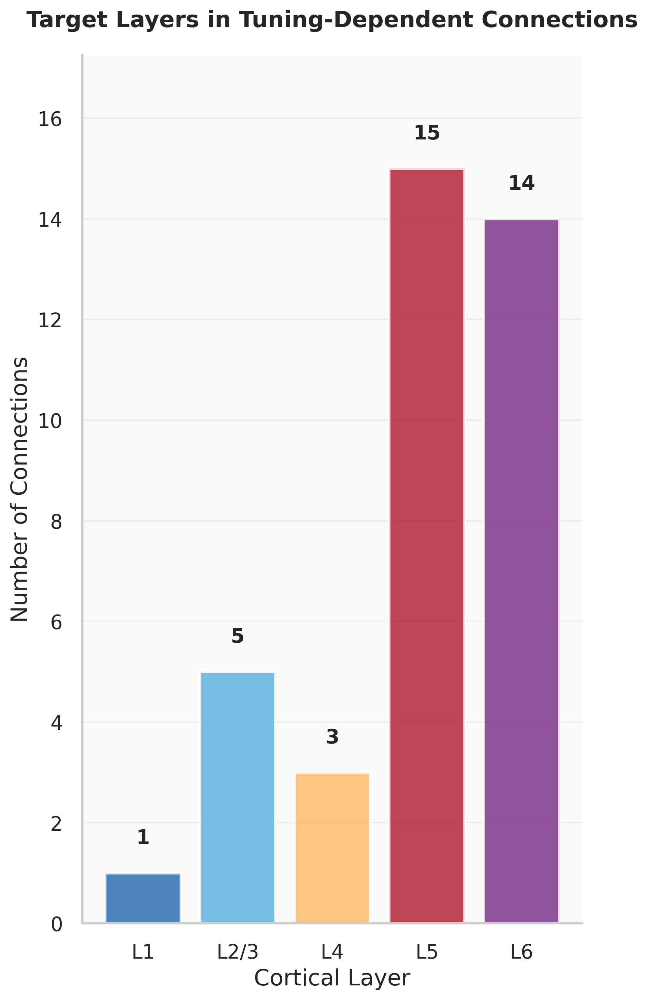


Most targeted layer: L5 (15 connections)
Least targeted layer: L1 (1 connections)


In [746]:
# ...existing code...

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Set publication-ready style with seaborn
sns.set_style("whitegrid", {
    "grid.linewidth": 0.8,
    "grid.alpha": 0.3,
    "axes.linewidth": 1.5,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
})

sns.set_context("paper", font_scale=1.3, rc={
    "lines.linewidth": 2.5,
    "patch.linewidth": 1.5,
    "axes.labelsize": 14,
    "axes.titlesize": 16,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,
    "figure.titlesize": 18
})

# Configure matplotlib for publication quality
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'mathtext.fontset': 'dejavusans',
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.facecolor': 'white',
    'savefig.edgecolor': 'none',
    'text.usetex': False
})

# Enhanced color palette for layers
layer_colors = {
    'L1': '#2166AC',     # Deep blue
    'L2/3': '#5AAEDC',   # Light blue
    'L4': '#FDB863',     # Orange - input layer
    'L5': '#B2182B',     # Red - output layer
    'L6': '#762A83',     # Purple - deep layer
    'Other': '#737373'   # Gray
}

# Create the figure with proper size
fig, ax = plt.subplots(figsize=(6, 10))

# Extract layer information and count occurrences
layer_data = significant_pairs['target_cell_type'].str.extract(r'(L\d+(?:/\d+)?)')[0]
layer_counts = layer_data.value_counts()

# Define the correct order of layers (anatomical order)
layer_order = ['L1', 'L2/3', 'L4', 'L5', 'L6']

# Reorder the data according to anatomical layer order
ordered_layers = []
ordered_counts = []
ordered_colors = []

for layer in layer_order:
    if layer in layer_counts.index:
        ordered_layers.append(layer)
        ordered_counts.append(layer_counts[layer])
        ordered_colors.append(layer_colors[layer])

# Create the bar chart with enhanced styling
bars = ax.bar(ordered_layers, ordered_counts, 
              color=ordered_colors,
              alpha=0.8,
              edgecolor='white',
              linewidth=2)

# Add value labels on top of bars
for i, (layer, count) in enumerate(zip(ordered_layers, ordered_counts)):
    ax.text(i, count + 0.5, str(count), 
            ha='center', va='bottom', 
            fontweight='bold', fontsize=14)

# Customize the plot
ax.set_title('Target Layers in Tuning-Dependent Connections', 
             fontsize=16, fontweight='bold', pad=20)
ax.set_ylabel('Number of Connections', fontsize=16, fontweight='normal')
ax.set_xlabel('Cortical Layer', fontsize=16, fontweight='normal')

# Enhance the appearance
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(1.5)
ax.spines['bottom'].set_linewidth(1.5)

# Set y-axis to start from 0 and add some padding at the top
ax.set_ylim(0, max(ordered_counts) * 1.15)

# Improve tick styling
ax.tick_params(axis='both', which='major', labelsize=14, width=1.5, length=6)
ax.tick_params(axis='x', which='major', pad=8)
ax.tick_params(axis='y', which='major', pad=8)

# Add subtle grid for better readability
ax.grid(True, axis='y', alpha=0.3, linewidth=1, linestyle='-')
ax.set_axisbelow(True)

# Add a subtle background gradient effect
ax.set_facecolor('#fafafa')
# remove the grid lines
ax.xaxis.grid(False)


# Add statistical annotation
# total_connections = sum(ordered_counts)
# ax.text(0.98, 0.95, f'Total significant\nconnections: {total_connections}', 
#         transform=ax.transAxes, ha='right', va='top',
#         bbox=dict(boxstyle='round,pad=0.5', facecolor='white', 
#                  edgecolor='gray', alpha=0.9),
#         fontsize=12, fontweight='normal')

# Adjust layout and display
plt.tight_layout()

# Optional: Save the figure in high quality
# plt.savefig('target_layers_significant_connections.png', dpi=300, bbox_inches='tight', 
#             facecolor='white', edgecolor='none')
# plt.savefig('target_layers_significant_connections.pdf', bbox_inches='tight', 
#             facecolor='white', edgecolor='none')

plt.show()

# Print summary statistics
# print("=== LAYER ANALYSIS SUMMARY ===")
# print(f"Total significant connections: {total_connections}")
# print("\nDistribution by target layer:")
# for layer, count in zip(ordered_layers, ordered_counts):
#     percentage = (count / total_connections) * 100
#     print(f"  {layer}: {count} connections ({percentage:.1f}%)")

# Calculate layer preference
most_targeted = ordered_layers[np.argmax(ordered_counts)]
least_targeted = ordered_layers[np.argmin(ordered_counts)]
print(f"\nMost targeted layer: {most_targeted} ({max(ordered_counts)} connections)")
print(f"Least targeted layer: {least_targeted} ({min(ordered_counts)} connections)")